# Load Libraries

In [51]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from torch.utils.data import Dataset, DataLoader
from torch import nn
from torch.nn.functional import relu
from scipy.io import loadmat
import os
from skimage import io
from PIL import Image
from sklearn.metrics import confusion_matrix
import seaborn as sn
import pickle
from ConvLSTM_pytorch import convlstm_wdo as convlstm
import operator
from random import sample
from utils_v4 import *

# Load Data

In [52]:
#selected subset of dates. 
val_dates = ['180327','180329']
test_dates = ['180330','180331']
bad_dates = ['180326', '180328', '171019', '180715', '180716', '180717']
load_path = '/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/'
model_saving_path = '/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models'




## Load data helper functions

In [53]:
def create_files_new(load_path, bad_dates, T_length=10, proceed=1): 
    sleep_files = os.listdir(load_path+'sleep/')
    move_files = os.listdir(load_path+'move/')
    all_files = sleep_files+move_files
    
    dic = {}
    for f in all_files:
        mvmt_type = f.split('_')[-1].split('.')[0]
        date = f.split('_')[0]
        rec = f.split('_')[1].split('_')[0]
        time = float(f.split('_')[3][4:])
        if date in bad_dates:
            continue
        if mvmt_type == 'sleep':
            label = 1
        else:
            label = 0
        if date in dic:
            if rec in dic[date]:
                dic[date][rec].append([f, label, mvmt_type, date, rec, time])
            else:
                dic[date][rec] = [[f, label, mvmt_type, date, rec, time]]
        else:
            dic[date] = {rec: [[f, label, mvmt_type, date, rec, time]]}
        
    for d in dic:
        for r in dic[d]:
            dic[d][r] = sorted(dic[d][r], key=operator.itemgetter(3, 4, 5))
    
    move_data, sleep_data = [], []
    for d in dic:
        for r in dic[d]:
            sleep_grouped, move_grouped = create_files_new_helper(dic[d][r], T_length=T_length, proceed=proceed)
            sleep_data.append(sleep_grouped)
            move_data.append(move_grouped)
    
    return move_data, sleep_data

In [54]:
def create_files_new_helper(L, T_length, proceed):
    L_labels = np.array([L[i][1] for i in range(len(L))])
    L_times = np.array([L[i][-1] for i in range(len(L))])
    
    L_new_sleep, L_new_move = [], []
    start = 0
    while start <= len(L)-T_length:
        end = start + T_length
        #pdb.pm()
        if sum(L_times[start+1:end]-L_times[start:end-1]-time_window) != 0:
            start += 1
            continue
        if sum(L_labels[start:end]) == T_length:
            L_new_sleep.append(L[start:end])
        elif sum(L_labels[start:end]) == 0:
            L_new_move.append(L[start:end])
        start += proceed
    return L_new_sleep, L_new_move

In [55]:
def upsample(train_files):
    train_sleep = [i for i in train_files if i[0][1] == 1]
    train_move = [i for i in train_files if i[0][1] == 0]
    diff = abs(len(train_sleep)-len(train_move))
    train_new = []
    d = 0
    while d < diff:
        if len(train_sleep) > len(train_move):
            ind = random.randint(0, len(train_move)-1)
            x = train_move[ind]
            d += 1
        else:
            ind = random.randint(0, len(train_sleep)-1)
            x = train_sleep[ind]
            d += 1
        train_new.append(x)   
    train_files = train_sleep+train_move+train_new
    return train_files

In [56]:
class SpectrogramDatasetAtt(Dataset):
    def __init__(self, files, load_path, T_length, all_label=False, CH=None):
        self.CH = CH
        self.files = files
        self.load_path = load_path
        self.T_length = T_length
        self.all_label = all_label
  
    def __len__(self):
        return len(self.files)
    
    def __getitem__(self, idx):
        group = self.files[idx]
        specs, labels, dates, recs, times = [], [], [], [], []
        for i in range(len(group)):
            f, label, mvmt_type, date, rec, time = group[i]
            spec = torch.from_numpy(np.load(self.load_path+mvmt_type+'/'+f))
            if self.CH is not None:
                spec = torch.transpose(spec[self.CH,:,:].unsqueeze(0), 2, 1)
            else:
                spec = torch.transpose(spec, 2, 1)
            specs.append(spec)
            labels.append(torch.Tensor([label]))
            dates.append(date)
            recs.append(rec)
            times.append(time)
            if i == (self.T_length-1)/2:
                label_mid = torch.Tensor([label])
                date_mid = date
                rec_mid = rec
                time_mid = time
        if self.all_label:
            return specs, labels, dates, recs, times
        else:
            return specs, label_mid, date_mid, rec_mid, time_mid

## T-length = 3

In [81]:
time_window = 10
## Load files
move_files, sleep_files = create_files_new(load_path, bad_dates, T_length=3, proceed=1)
train_files, val_files, test_files = [], [], []

## Put files in val, test, and train
for f in move_files+sleep_files:
    if f:
        if f[0][1][3] in val_dates:
            val_files.extend(f)
        elif f[0][1][3] in test_dates:
            test_files.extend(f)
        else:
            train_files.extend(f)           

In [82]:
## Randomly shuffle inside train, val, and test
random.shuffle(train_files)
random.shuffle(val_files)
random.shuffle(test_files)

In [83]:
## Upsample train
train_files = upsample(train_files)

In [84]:
len(train_files), len(val_files), len(test_files)

(17266, 5248, 5199)

In [85]:
## Balance val 
sleep_files = []
move_files = []
for t in range(len(val_files)):
    if 'sleep' in val_files[t][0]:
        sleep_files.append(val_files[t])
    if 'move' in val_files[t][0]:
        move_files.append(val_files[t])

sleep_sample = sample(sleep_files, len(move_files))
val_2_files = sleep_sample+move_files

In [93]:
## Load files to dataloader

train_dataset = SpectrogramDatasetAtt(files=train_files, load_path=load_path, T_length=3, all_label=True)
valid_dataset_bal = SpectrogramDatasetAtt(files=val_2_files, load_path=load_path, T_length=3, all_label=True)
test_dataset = SpectrogramDatasetAtt(files=test_files, load_path=load_path, T_length=3, all_label=True)

# train_dataset = SpectrogramDatasetAtt(files=train_files, load_path=load_path, T_length=3, all_label=True)
valid_dataset = SpectrogramDatasetAtt(files=val_files, load_path=load_path, T_length=3, all_label=True)
# test_dataset = SpectrogramDatasetAtt(files=test_files, load_path=load_path, T_length=3, all_label=True)

train_loader = DataLoader(dataset=train_dataset, batch_size=128, shuffle = True)
val_loader = DataLoader(dataset=valid_dataset, batch_size=128, shuffle = False)
test_loader = DataLoader(dataset=test_dataset, batch_size=128, shuffle = False)
val_loader_bal = DataLoader(dataset=valid_dataset_bal, batch_size=128, shuffle = False)

## convLSTM

In [87]:
## Define Model
class convLSTM(nn.Module):
    def __init__(self, input_dim = 1, layers = 1, hidden_dim = 10, frequencies = 100,timewindow = 10, output_size=1, batch_size=128, dropout = 0):
        super(convLSTM, self).__init__()
        
        self.input_dim = input_dim
        self.output_size = output_size
        self.batch_size = batch_size
        self.n_layers = layers
        self.hidden_dim = hidden_dim
        self.freqs = frequencies
        self.timewindow = timewindow
        self.dropout = dropout
        
        # Define the lstm layer
        self.convLSTM = convlstm.ConvLSTM(input_dim=self.input_dim,
                 hidden_dim=self.hidden_dim,
                 kernel_size=(3, 3),
                 num_layers=self.n_layers,
                 batch_first=False,
                 bias=True,
                 return_all_layers=False, 
                 dropout = self.dropout)
        # Define the fully-connected layer
#         self.fc = nn.Linear(self.n_layers*self.hidden_dim, output_size)
        self.fc = nn.Linear(self.hidden_dim*self.freqs*self.timewindow, output_size)

    def forward(self, input_seq):
        
        # convLSTM
        _, last_states = self.convLSTM(input_seq)
        last_states = last_states[0][0]
        last_states = last_states.reshape(last_states.shape[0], -1)
        fc = self.fc(last_states)        

        return fc

### Training functions

In [88]:
def get_accuracy(model, loader, device='cuda', collect_result = False):
    """
    Function that calculate the accuracy of the model. 
    """
    correct = 0
    total = 0
    pred, labs = [],[]
    with torch.no_grad():
        for data, labels, _, _, _ in loader:
            # Labels
            labels = torch.stack(labels)
            labels = labels[0]
            labels = labels.to(device).float()
            # Data
            data = torch.tensor(np.stack(data)).to(device).float() 
            data = data.to(device).float()
            # Feed data to model
            outputs = model(data)            
            outputs = torch.tensor(outputs).to(device)
            # Predictions
            predictions = (outputs > 0.5) * 1.0
            predictions = predictions.flatten().detach().cpu().numpy()
            labels = labels.flatten().cpu().numpy()
            # Calculate Accuracy
            total += len(labels)
            correct += (predictions == labels).sum()
            
            if collect_result:
                pred.append(predictions)
                labs.append(labels)
            
    accuracy = correct / total
    if collect_result:
        return accuracy, pred, labs
    return accuracy

In [89]:
def train(model, optimizer, criterion, loader, device='cuda'):
    """
    Function that train the model. 
    """
    model.train()
    epoch_losses = 0
    epoch_lens = 0
    parameter_history = []
    # criterion = nn.BCELoss()
    for batch_idx, (data, labels, _, _, _) in enumerate(loader):
        # Get Label
        labels = torch.stack(labels)
        labels = labels[0]
        labels = torch.flatten(labels).to(device).float()
        labels = labels.to(device).float()
#         print(batch_idx)
        
        # Get data
        data = torch.tensor(np.stack(data)).to(device).float() 
        data = data.to(device).float()

        # Zero out grad
        optimizer.zero_grad()

        # Data in model
        outputs = model(data)
#         outputs = torch.tensor(outputs,requires_grad = True).to(device)
        outputs = torch.squeeze(outputs)

        # Get loss
        loss = criterion(torch.sigmoid(outputs), labels)
#         print(loss)
        epoch_losses += loss
        epoch_lens += 1

        parameter_history.append(list(model.parameters())[0])
        loss.backward() # error?
        optimizer.step()

    epoch_accs = get_accuracy(model, loader, device=device, collect_result = False)
    return epoch_losses/epoch_lens, epoch_accs, parameter_history

def evaluate(model, optimizer, criterion, loader, device='cuda', collect_result = False):
    model.eval()
    epoch_losses = 0
    epoch_lens = 0
    
    with torch.no_grad():
        for batch_idx, (data, labels, _, _, _) in enumerate(loader):
            labels = torch.stack(labels)
            labels = labels[0]
            labels = labels.to(device).float()
            labels = torch.flatten(labels).to(device).float()
            data = torch.tensor(np.stack(data)).to(device).float() 
            data = data.to(device).float()
            outputs = model(data)
#             outputs = torch.tensor(outputs).to(device)
            outputs = torch.squeeze(outputs)
            loss = criterion(torch.sigmoid(outputs), labels)
            epoch_losses += loss
            epoch_lens += 1
    
    if collect_result:
        epoch_accs, pred, labs = get_accuracy(model, loader, device = device, collect_result = True)
        predictions = np.concatenate(pred)
        truths = np.concatenate(labs)
        df_result = pd.DataFrame({'predictions': predictions, 'labels': truths})
        cm = confusion_matrix(truths, predictions)
        ax = plt.axes()
        group_names = ['True Neg','False Pos','False Neg','True Pos']
        group_counts = ["{0:0.0f}".format(value) for value in cm.flatten()]

        TNR = int(group_counts[0]) / (int(group_counts[0])+int(group_counts[1]))
        FPR = 1 - TNR
        TPR = int(group_counts[3]) / (int(group_counts[3])+int(group_counts[2]))
        FNR = 1-TPR
        F1_score = int(group_counts[3])/(int(group_counts[3])+1/2*(int(group_counts[1])+int(group_counts[2])))
        group_percentages =[TNR, FPR, FNR, TPR]

        group_percentages = ["{0:.2%}".format(value) for value in group_percentages]
        cm_labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]
        cm_labels = np.asarray(cm_labels).reshape(2,2)
        sn.heatmap(cm, annot=cm_labels, fmt='', center = 2000)
        ax.set_title('Validation Confusion Matrix')
        ax.set_xlabel('Predicted Label')
        ax.set_ylabel('True Label')
        plt.show()
        return epoch_losses/epoch_lens,epoch_accs, pred, F1_score, labs
    else:
        epoch_accs = get_accuracy(model, loader, device=device, collect_result = collect_result)
    return epoch_losses/epoch_lens, epoch_accs

### Training

In [90]:
device = torch.device('cuda')

tol = 0.01
learning_rate = 0.01
num_epochs = 51
alpha = 0
model_type = 'convLSTM'
loss_type = 'bce'
reg_type = 'none'
alpha = 0
timewindow = 10
ch = 'all'
dropout = [0.1,0.3,0.5]
hidden_dim = [10,15,48,56]

# verbose = False

T_length = 3
# optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
criterion = nn.BCELoss() # BCE loss

In [31]:
for i in hidden_dim:
    for d in dropout:
        model = convLSTM(input_dim = 62, hidden_dim = i, dropout = d).to(device)
        print(model)
        optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
        criterion = nn.BCELoss() # BCE loss
        train_losses, train_accs, val_losses, val_accs, parameter_history = [], [], [], [],[]

        for epoch in range(num_epochs):
            train_loss, train_acc, parameter_history = train(model, optimizer, criterion, train_loader,  device='cuda')
            val_loss, val_acc = evaluate(model, optimizer, criterion, val_loader, device='cuda')
            train_losses.append(train_loss)
            train_accs.append(train_acc)
            val_losses.append(val_loss)
            val_accs.append(val_acc)
            if epoch == 0:
                torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch))

            if val_loss <= min(val_losses):
                best_epoch = epoch
                print(epoch)
                print('Train loss for epoch {}: {}'.format(epoch, train_loss))
                print('Val loss for epoch {}: {}'.format(epoch, val_loss))
                torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch))
            else:
                print('Train loss for epoch {}: {}'.format(epoch, train_loss))
                print('Val loss for epoch {}: {}'.format(epoch, val_loss))

        #     if epoch == num_epochs-1:
        #         torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_EPOCH{}.pt'.format(model_saving_path, model_type, CH, loss_type, reg_type, alpha, timewindow, epoch))

        train_result_filename =  '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}_trainresult.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch)
        train_result = {'model_type': model_type, 'train_losses' : train_losses, 'val_losses' : val_losses, 'train_accs': train_accs, 'val_accs': val_accs}
        pickle.dump( train_result, open( train_result_filename, "wb" ) )
        plot_loss_acc(train_losses, val_losses, train_accs, val_accs, model_type)

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)


<ipython-input-14-894d578093d0>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  outputs = torch.tensor(outputs).to(device)


0
Train loss for epoch 0: 0.9044264554977417
Val loss for epoch 0: 1.1101045608520508


KeyboardInterrupt: 

### Balanced Result

In [91]:
results = []
for h in hidden_dim:
    for d in dropout:
        model_convLSTM = os.listdir(model_saving_path)

        best_result = 0
        reg_alpha = 'REG'+reg_type+str(alpha)+'_'
        dropout_type = 'DO'+str(d)
        hidden_type = 'HD'+str(h)
        t_len = 'TLEN'+str(T_length)
        for i, s in enumerate(model_convLSTM):
            if 'convLSTM_CHall_' in s and reg_alpha in s and dropout_type in s and 'trainresult' not in s and hidden_type in s and t_len in s and '_balanced' in s and 'valcm' not in s and 'testcm' not in s:
                model_name = model_convLSTM[i].split('_')
                epoch_name = [ind for ind,item in enumerate(np.array(model_name)) if "EPOCH" in item]
                res = [int(i) for i in model_name[epoch_name[0]] if i.isdigit()]
                if len(res) > 1:
                    epoch_result = res[0]*10+res[1]
                else:
                    epoch_result = res[0]
                if epoch_result>best_result and epoch_result != 50:
                    best_result = epoch_result

        results.append([h,d,best_result])

results = pd.DataFrame(np.array(results), columns=['hidden','dropout', 'epoch'])
best_results = results.groupby(['hidden','dropout']).max('epoch')
print(best_results)


                epoch
hidden dropout       
10.0   0.1        1.0
       0.3        1.0
       0.5        0.0
15.0   0.1        1.0
       0.3        1.0
       0.5        0.0
48.0   0.1        1.0
       0.3       19.0
       0.5        0.0
56.0   0.1       49.0
       0.3       21.0
       0.5        9.0


In [92]:
def plot_train_result_file(model_saving_path, model_type, num_channel, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden, best_epoch):
    fb = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH50_balanced_trainresult.pt'.format(model_saving_path, model_type, num_channel, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden)
    file = open(fb,'rb')
    train_result = pickle.load(file)
    train_losses = train_result['train_losses']
    val_losses = train_result['val_losses']
    train_accs = train_result['train_accs']
    val_accs = train_result['val_accs']
    model_type = train_result['model_type']
    print('best epoch training accuracy: ', train_accs[best_epoch])
    plot_loss_acc(train_losses, val_losses, train_accs, val_accs, model_type)
    

/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD10_EPOCH1_balanced.pt
best epoch training accuracy:  0.9651917062434843


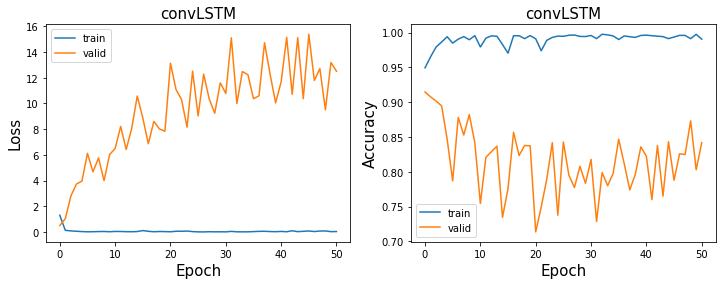

<ipython-input-88-894d578093d0>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  outputs = torch.tensor(outputs).to(device)


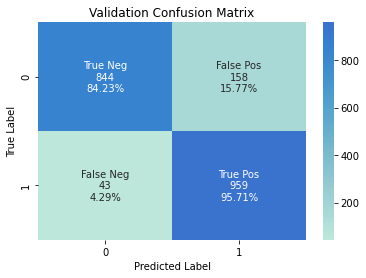

validation loss:0.391915887594223 accuracy:0.8997005988023952 F1:0.9051439358187825


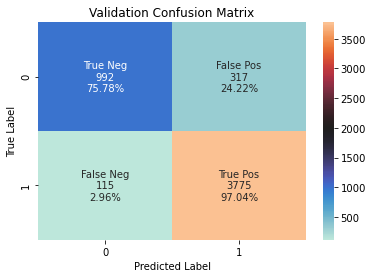

test loss:0.2531229257583618 accuracy:0.9169070975187537 F1:0.9458782260085191
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD10_EPOCH1_balanced.pt
best epoch training accuracy:  0.9571991196571297


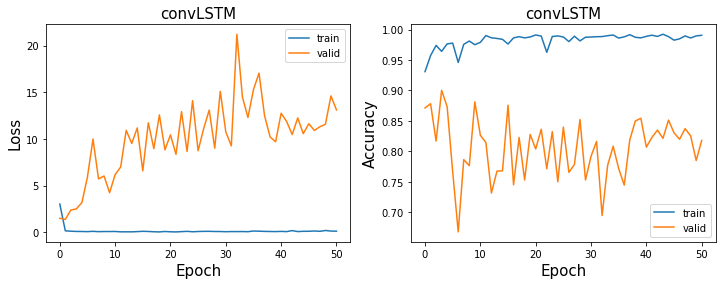

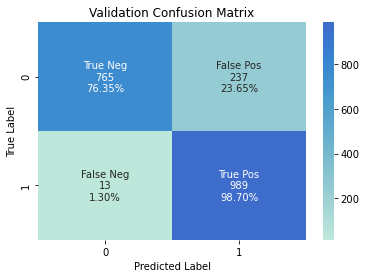

validation loss:1.4645049571990967 accuracy:0.875249500998004 F1:0.8877917414721723


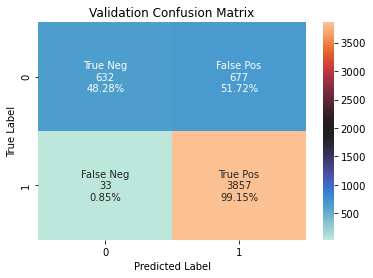

test loss:0.8449989557266235 accuracy:0.8634352760146182 F1:0.9157169990503324
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD10_EPOCH0_balanced.pt
best epoch training accuracy:  0.8969072164948454


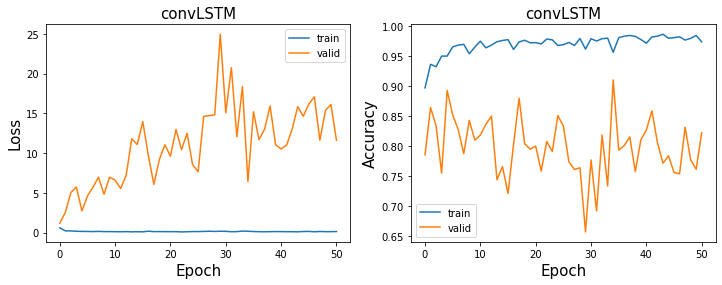

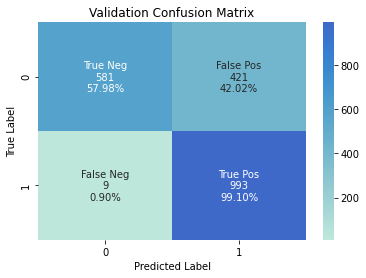

validation loss:1.1755485534667969 accuracy:0.7854291417165669 F1:0.8220198675496688


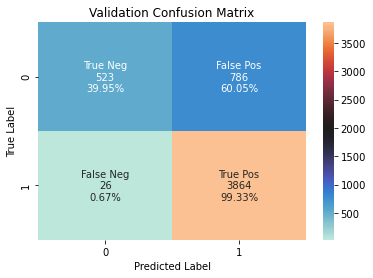

test loss:0.7775594592094421 accuracy:0.8438161184843239 F1:0.9049180327868852
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD15_EPOCH1_balanced.pt
best epoch training accuracy:  0.9801343681223214


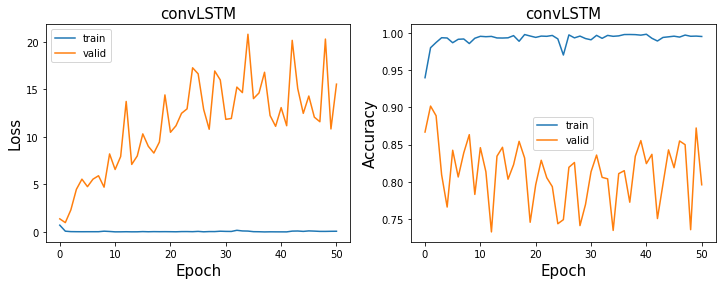

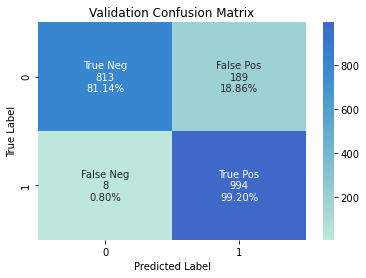

validation loss:1.076547622680664 accuracy:0.9016966067864272 F1:0.9098398169336385


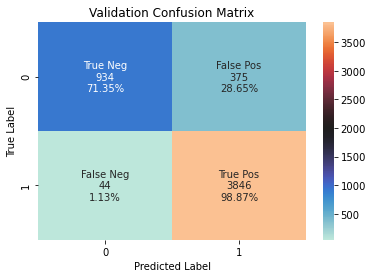

test loss:0.3357943296432495 accuracy:0.9194075783804578 F1:0.9483417581062754
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD15_EPOCH1_balanced.pt
best epoch training accuracy:  0.9334530290744817


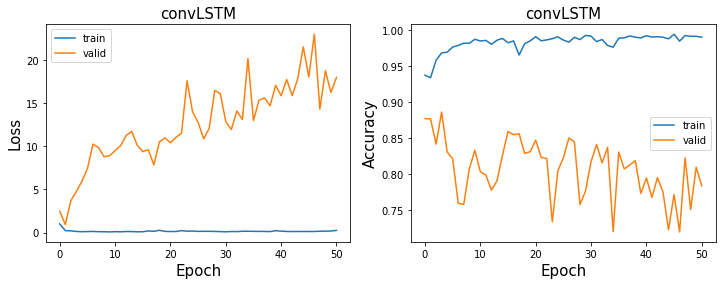

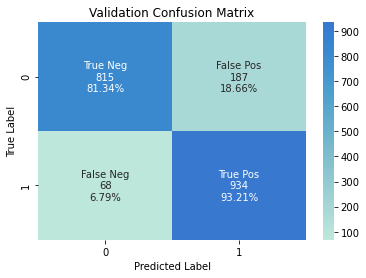

validation loss:0.9626238346099854 accuracy:0.8727544910179641 F1:0.8798869524258125


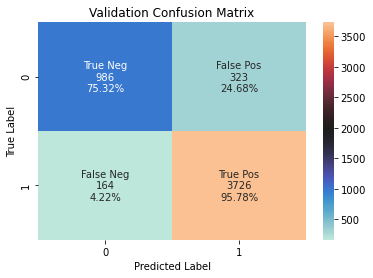

test loss:0.4819967448711395 accuracy:0.9063281400269283 F1:0.9386572616198514
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD15_EPOCH0_balanced.pt
best epoch training accuracy:  0.9216379010772616


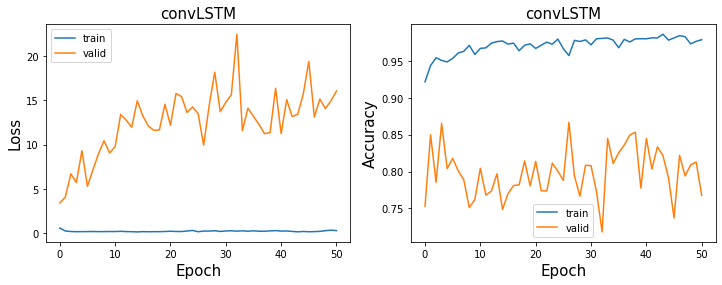

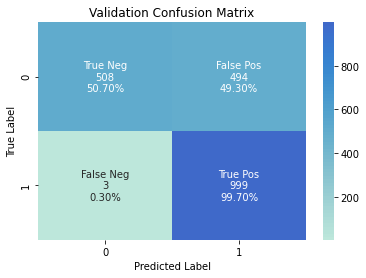

validation loss:3.449678421020508 accuracy:0.751996007984032 F1:0.8008016032064128


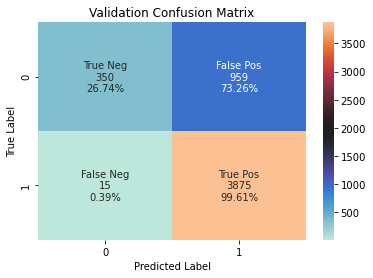

test loss:1.3380941152572632 accuracy:0.8126562800538565 F1:0.8883539660706098
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD48_EPOCH1_balanced.pt
best epoch training accuracy:  0.9536661647167844


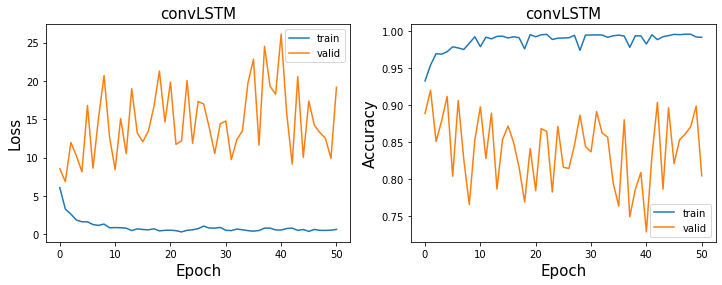

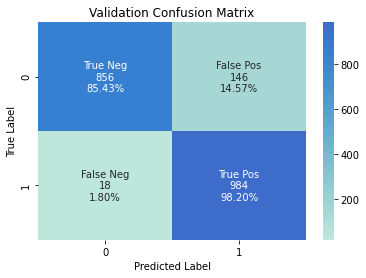

validation loss:6.983623504638672 accuracy:0.9181636726546906 F1:0.9230769230769231


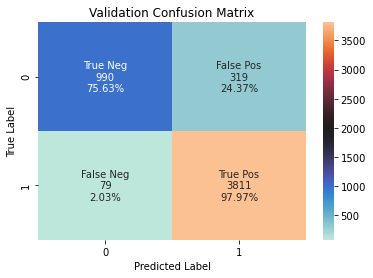

test loss:5.111519813537598 accuracy:0.9234468166955184 F1:0.9503740648379052
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD48_EPOCH19_balanced.pt
best epoch training accuracy:  0.9644387814201321


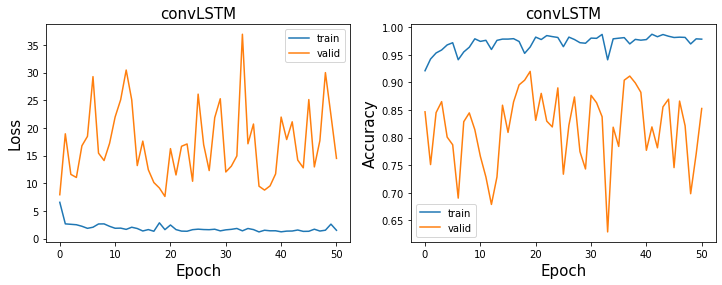

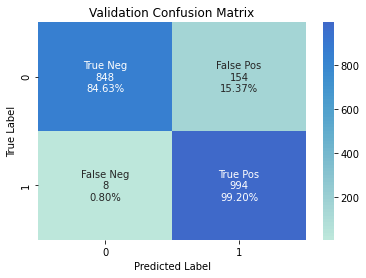

validation loss:7.887606620788574 accuracy:0.9191616766467066 F1:0.9246511627906977


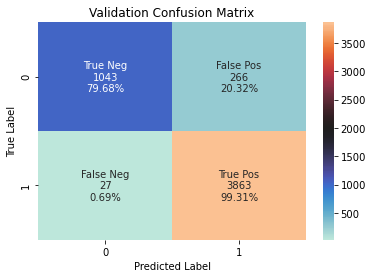

test loss:5.144246578216553 accuracy:0.9436430082708213 F1:0.9634617782765931
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD48_EPOCH0_balanced.pt
best epoch training accuracy:  0.8945905247306846


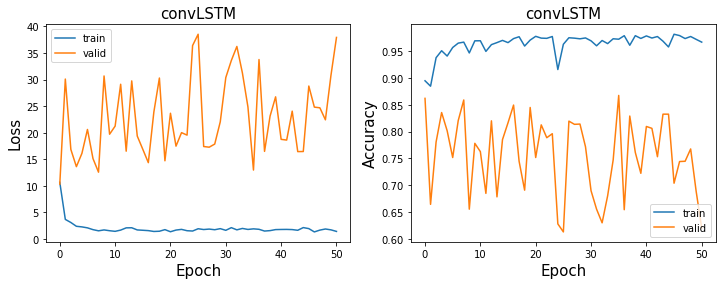

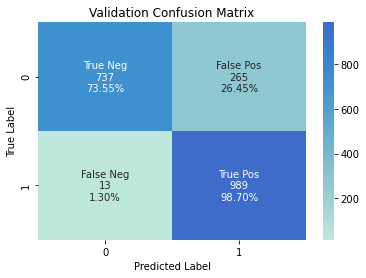

validation loss:10.405694961547852 accuracy:0.8612774451097804 F1:0.87677304964539


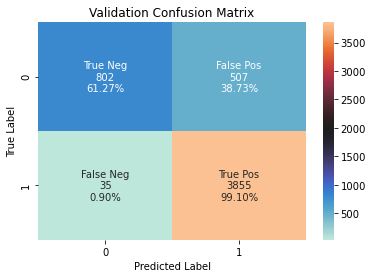

test loss:7.865866184234619 accuracy:0.8957491825351029 F1:0.9343189529810955
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD56_EPOCH49_balanced.pt
best epoch training accuracy:  0.5


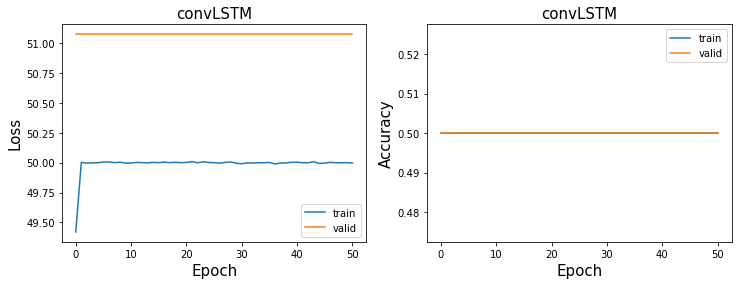

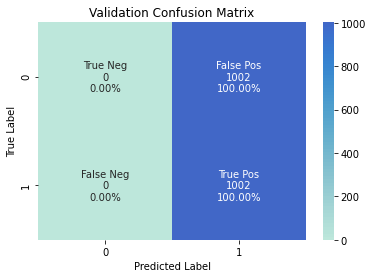

validation loss:51.07421875 accuracy:0.5 F1:0.6666666666666666


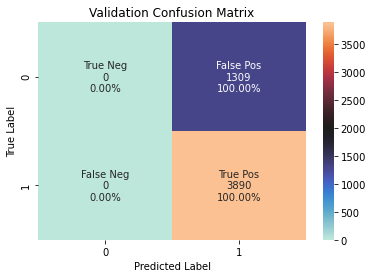

test loss:25.21466636657715 accuracy:0.7482208116945567 F1:0.8559797557487072
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD56_EPOCH21_balanced.pt
best epoch training accuracy:  0.964207112243716


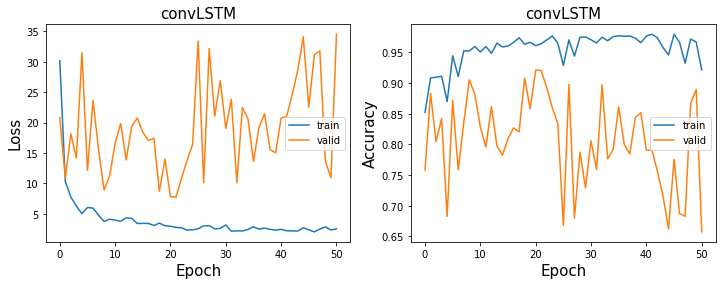

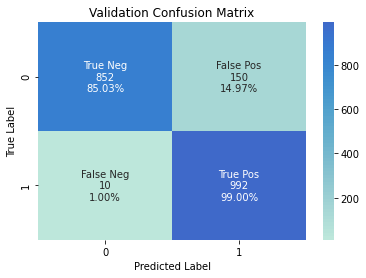

validation loss:7.950694561004639 accuracy:0.9201596806387226 F1:0.9253731343283582


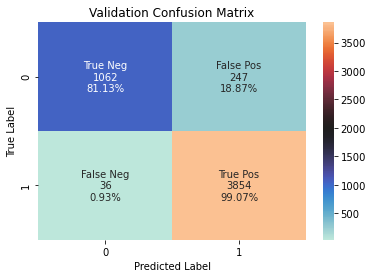

test loss:5.092404842376709 accuracy:0.9455664550875168 F1:0.964585158303091
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD56_EPOCH9_balanced.pt
best epoch training accuracy:  0.9629329317734275


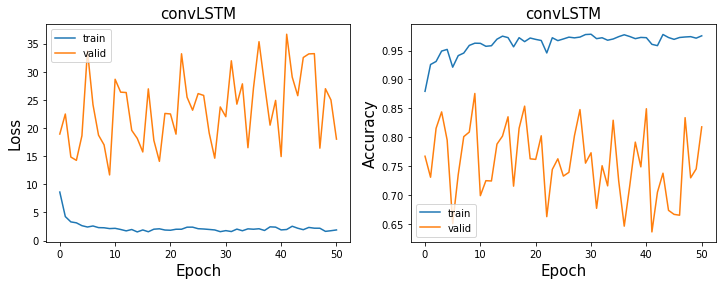

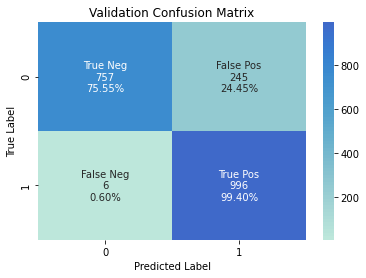

validation loss:11.853781700134277 accuracy:0.874750499001996 F1:0.8880962995987517


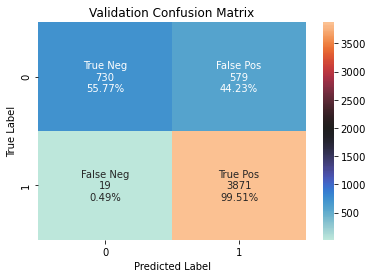

test loss:10.45465087890625 accuracy:0.884977880361608 F1:0.9282973621103118


In [94]:
for i,(index,row) in enumerate(best_results.iterrows()):

    best_epoch = int(row)
    hidden = int(index[0])
    dropout = index[1]
    alpha = 0
    
    
    # load best model
    model = convLSTM(input_dim = 62, hidden_dim = hidden).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
    model.load_state_dict(torch.load('{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}_balanced.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden,best_epoch)))
    
    print('{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}_balanced.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, dropout, hidden,best_epoch))
    
    ## Plot training result
    plot_train_result_file(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden, best_epoch)
    
    ## Calculate validation accuracy and validation loss
    val_loss, val_acc, val_preds, val_F1, val_labels = evaluate(model, optimizer, criterion, val_loader_bal, device='cuda', collect_result = True)
    print('validation loss:{} accuracy:{} F1:{}'.format(val_loss, val_acc, val_F1))
    
    ## Calculate test accuracy and test loss
    test_loss, test_acc, test_preds, test_F1, test_labels = evaluate(model, optimizer, criterion, test_loader, device='cuda', collect_result = True)
    print('test loss:{} accuracy:{} F1:{}'.format(test_loss, test_acc, test_F1))
#     print(np.mean(np.concatenate(test_labels)))
    
#     ## Confusion matrix-validation
#     predictions_val = np.concatenate(val_preds)
#     labels_val = np.concatenate(val_labels)
    
#     val_cm_filename = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_balanced_valcm.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout,hidden)
#     print(val_cm_filename)
#     val_cm_result = {'predictions_val': predictions_val, 'labels_val' : labels_val}

#     pickle.dump( val_cm_result, open( val_cm_filename, "wb" ) )
    
    
#     df_val = pd.DataFrame({'predictions': predictions_val, 'labels': labels_val})

#     cm_val = confusion_matrix(labels_val, predictions_val)
#     ax = plt.axes()
#     group_names = ['True Neg','False Pos','False Neg','True Pos']
#     group_counts = ["{0:0.0f}".format(value) for value in
#                     cm_val.flatten()]

#     TNR = int(group_counts[0]) / (int(group_counts[0])+int(group_counts[1]))
#     FPR = 1 - TNR
#     TPR = int(group_counts[3]) / (int(group_counts[3])+int(group_counts[2]))
#     FNR = 1-TPR
#     group_percentages =[TNR, FPR, FNR, TPR]

#     group_percentages = ["{0:.2%}".format(value) for value in
#                          group_percentages]
#     labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
#               zip(group_names,group_counts,group_percentages)]
#     labels = np.asarray(labels).reshape(2,2)
#     sn.heatmap(cm_val, annot=labels, fmt='', center = 2000)
#     ax.set_title('Validation Confusion Matrix')
#     ax.set_xlabel('Predicted Label')
#     ax.set_ylabel('True Label')
#     plt.show()
    
#     ## Confusion matrix-test
#     predictions_test = np.concatenate(test_preds)
#     labels_test = np.concatenate(test_labels)

#     test_cm_filename = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_balanced_testcm.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout,hidden)
#     print(test_cm_filename)
#     test_cm_result = {'predictions_test': predictions_test, 'labels_val' : labels_test}

#     pickle.dump( test_cm_result, open( test_cm_filename, "wb" ) )

#     df_test = pd.DataFrame({'predictions': predictions_test, 'labels': labels_test})

#     cm_test = confusion_matrix(labels_test, predictions_test)
#     ax = plt.axes()
#     group_names = ['True Neg','False Pos','False Neg','True Pos']
#     group_counts = ["{0:0.0f}".format(value) for value in
#                     cm_test.flatten()]

#     TNR = int(group_counts[0]) / (int(group_counts[0])+int(group_counts[1]))
#     FPR = 1 - TNR
#     TPR = int(group_counts[3]) / (int(group_counts[3])+int(group_counts[2]))
#     FNR = 1-TPR
#     group_percentages =[TNR, FPR, FNR, TPR]

#     group_percentages = ["{0:.2%}".format(value) for value in
#                          group_percentages]
#     labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
#               zip(group_names,group_counts,group_percentages)]
#     labels = np.asarray(labels).reshape(2,2)
#     sn.heatmap(cm_test, annot=labels, fmt='', center = 2000)
#     ax.set_title('Test Confusion Matrix')
#     ax.set_xlabel('Predicted Label')
#     ax.set_ylabel('True Label')
#     plt.show()
    


### No balanced results

In [95]:
device = torch.device('cuda')

tol = 0.01
learning_rate = 0.01
num_epochs = 51
alpha = 0
model_type = 'convLSTM'
loss_type = 'bce'
reg_type = 'none'
alpha = 0
timewindow = 10
ch = 'all'
dropout = [0.1,0.3,0.5]
hidden_dim = [10,15,48,56]
# verbose = False

T_length = 3

criterion = nn.BCELoss() # BCE loss

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)


<ipython-input-15-894d578093d0>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  outputs = torch.tensor(outputs).to(device)


0
Train loss for epoch 0: 7.419012546539307
Val loss for epoch 0: 5.542507648468018
1
Train loss for epoch 1: 2.821688652038574
Val loss for epoch 1: 3.884211301803589
2
Train loss for epoch 2: 1.8372633457183838
Val loss for epoch 2: 2.994175910949707
Train loss for epoch 3: 1.588913083076477
Val loss for epoch 3: 3.3624582290649414
Train loss for epoch 4: 1.3044403791427612
Val loss for epoch 4: 3.6299028396606445
Train loss for epoch 5: 1.686810851097107
Val loss for epoch 5: 10.093743324279785
Train loss for epoch 6: 0.9504109621047974
Val loss for epoch 6: 7.761244297027588
Train loss for epoch 7: 0.959551215171814
Val loss for epoch 7: 5.561123847961426
Train loss for epoch 8: 1.0011440515518188
Val loss for epoch 8: 5.383641242980957
Train loss for epoch 9: 0.8436964750289917
Val loss for epoch 9: 11.093457221984863
Train loss for epoch 10: 1.0139552354812622
Val loss for epoch 10: 8.816211700439453
Train loss for epoch 11: 1.4527612924575806
Val loss for epoch 11: 6.51452827453

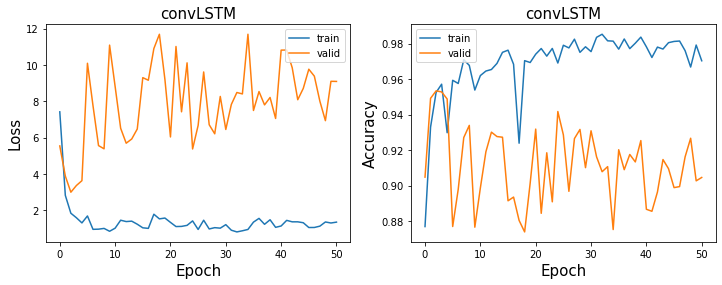

In [34]:
for i in hidden_dim:
    for d in dropout:
        model = convLSTM(input_dim = 62, hidden_dim = i, dropout = d).to(device)
        print(model)
        optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
        criterion = nn.BCELoss() # BCE loss
        train_losses, train_accs, val_losses, val_accs, parameter_history = [], [], [], [],[]

        for epoch in range(num_epochs):
            train_loss, train_acc, parameter_history = train(model, optimizer, criterion, train_loader,  device='cuda')
            val_loss, val_acc = evaluate(model, optimizer, criterion, val_loader, device='cuda')
            train_losses.append(train_loss)
            train_accs.append(train_acc)
            val_losses.append(val_loss)
            val_accs.append(val_acc)
            if epoch == 0:
                torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch))

            if val_loss <= min(val_losses):
                best_epoch = epoch
                print(epoch)
                print('Train loss for epoch {}: {}'.format(epoch, train_loss))
                print('Val loss for epoch {}: {}'.format(epoch, val_loss))
                torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch))
            else:
                print('Train loss for epoch {}: {}'.format(epoch, train_loss))
                print('Val loss for epoch {}: {}'.format(epoch, val_loss))

        #     if epoch == num_epochs-1:
        #         torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_EPOCH{}.pt'.format(model_saving_path, model_type, CH, loss_type, reg_type, alpha, timewindow, epoch))

        train_result_filename =  '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}_trainresult.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch)
        train_result = {'model_type': model_type, 'train_losses' : train_losses, 'val_losses' : val_losses, 'train_accs': train_accs, 'val_accs': val_accs}
        pickle.dump( train_result, open( train_result_filename, "wb" ) )
        plot_loss_acc(train_losses, val_losses, train_accs, val_accs, model_type)

In [96]:
results = []
for h in hidden_dim:
    for d in dropout:
        model_convLSTM = os.listdir(model_saving_path)

        best_result = 0
        reg_alpha = 'REG'+reg_type+str(alpha)+'_'
        dropout_type = 'DO'+str(d)
        hidden_type = 'HD'+str(h)
        t_len = 'TLEN'+str(T_length)
        for i, s in enumerate(model_convLSTM):
            if 'convLSTM_CHall_' in s and reg_alpha in s and dropout_type in s and hidden_type in s and t_len in s and 'trainresult' not in s and 'valcm' not in s and 'testcm' not in s and '_balanced' not in s:
                model_name = model_convLSTM[i].split('_')
                epoch_name = [ind for ind,item in enumerate(np.array(model_name)) if "EPOCH" in item]
                res = [int(i) for i in model_name[epoch_name[0]] if i.isdigit()]
                if len(res) > 1:
                    epoch_result = res[0]*10+res[1]
                else:
                    epoch_result = res[0]
                if epoch_result>best_result and epoch_result != 50:
                    best_result = epoch_result

        results.append([h,d,best_result])

results = pd.DataFrame(np.array(results), columns=['hidden','dropout', 'epoch'])
best_results = results.groupby(['hidden','dropout']).max('epoch')
print(best_results)


                epoch
hidden dropout       
10.0   0.1        0.0
       0.3        0.0
       0.5        0.0
15.0   0.1        0.0
       0.3        0.0
       0.5        0.0
48.0   0.1        1.0
       0.3       34.0
       0.5        2.0
56.0   0.1       49.0
       0.3       20.0
       0.5        5.0


In [97]:
def plot_train_result_file(model_saving_path, model_type, num_channel, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden, best_epoch):
    fb = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH50_trainresult.pt'.format(model_saving_path, model_type, num_channel, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden)
    file = open(fb,'rb')
    train_result = pickle.load(file)
    train_losses = train_result['train_losses']
    val_losses = train_result['val_losses']
    train_accs = train_result['train_accs']
    val_accs = train_result['val_accs']
    model_type = train_result['model_type']
    print('best epoch training accuracy: ', train_accs[best_epoch])
    plot_loss_acc(train_losses, val_losses, train_accs, val_accs, model_type)


/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD10_EPOCH0.pt
best epoch training accuracy:  0.9641491949496119


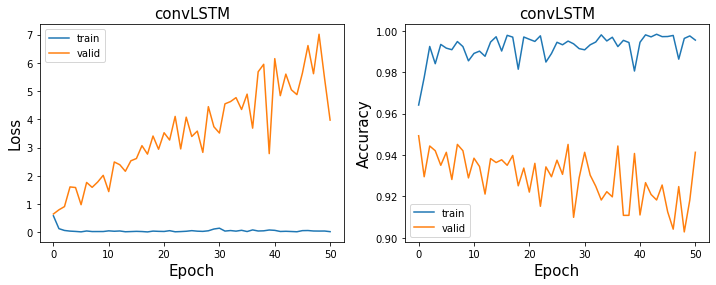

<ipython-input-88-894d578093d0>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  outputs = torch.tensor(outputs).to(device)


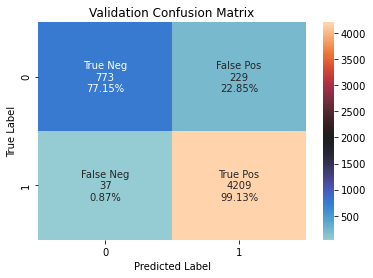

validation loss:0.6495885848999023 accuracy:0.9493140243902439 F1:0.9693689543988945


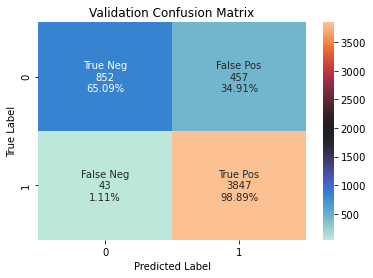

test loss:0.6089267730712891 accuracy:0.9038276591652241 F1:0.938979741274103
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD10_EPOCH0.pt
best epoch training accuracy:  0.9252287733117108


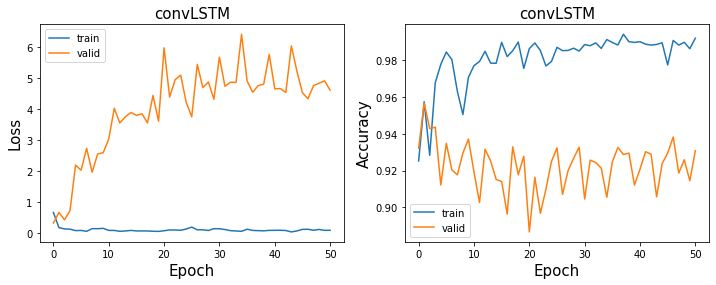

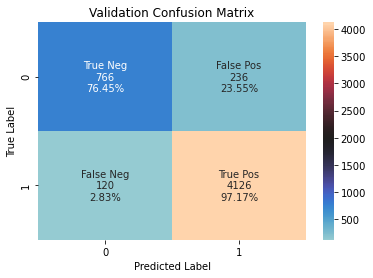

validation loss:0.3214156925678253 accuracy:0.9321646341463414 F1:0.9586431226765799


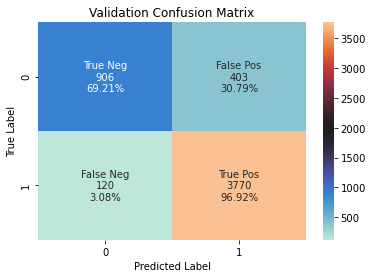

test loss:0.3735739290714264 accuracy:0.8994037314868244 F1:0.9351358055314399
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD10_EPOCH0.pt
best epoch training accuracy:  0.8820803892042164


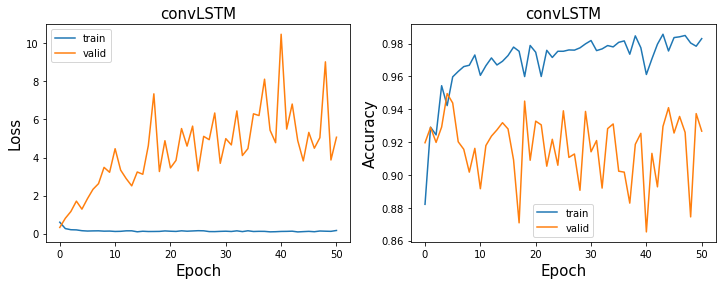

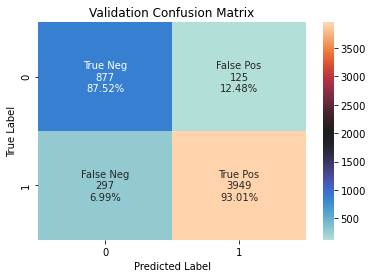

validation loss:0.3198528587818146 accuracy:0.9195884146341463 F1:0.9492788461538462


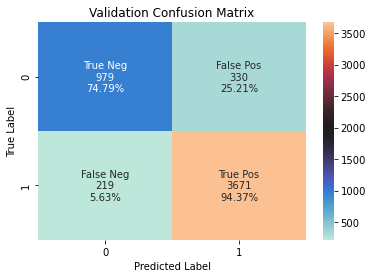

test loss:0.3560243844985962 accuracy:0.894402769763416 F1:0.9304270688125713
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD15_EPOCH0.pt
best epoch training accuracy:  0.9580099617745859


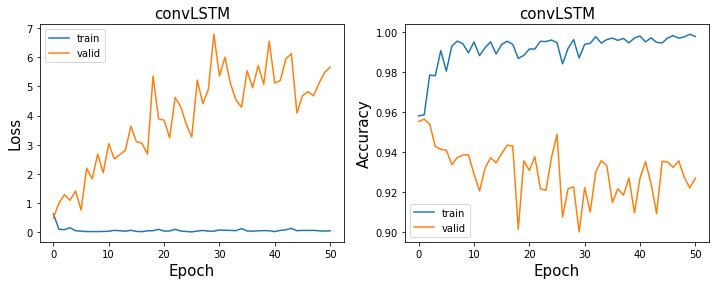

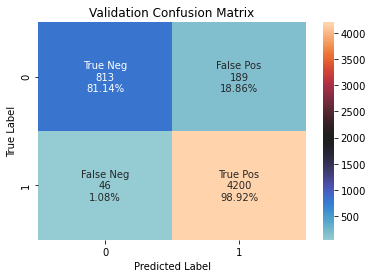

validation loss:0.4969392418861389 accuracy:0.9552210365853658 F1:0.9727851766068326


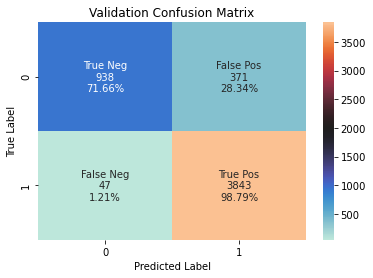

test loss:0.3119429349899292 accuracy:0.9195999230621273 F1:0.9484205330700889
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD15_EPOCH0.pt
best epoch training accuracy:  0.925692111664543


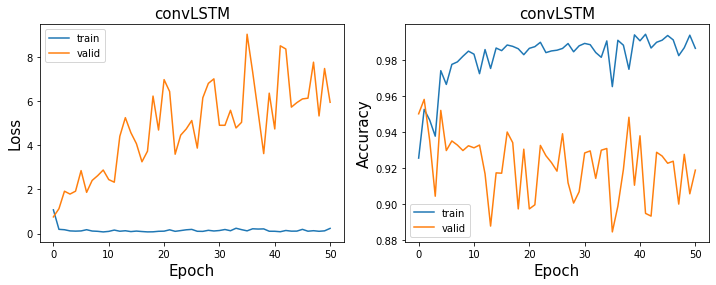

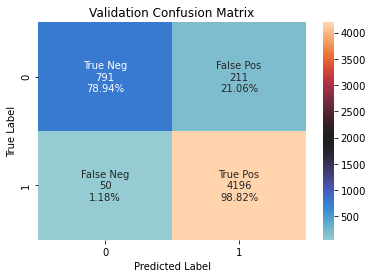

validation loss:0.751356303691864 accuracy:0.950266768292683 F1:0.9698370507338495


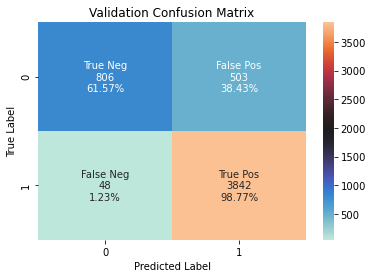

test loss:0.6978777050971985 accuracy:0.8940180804000769 F1:0.933090467516697
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD15_EPOCH0.pt
best epoch training accuracy:  0.8787791034402873


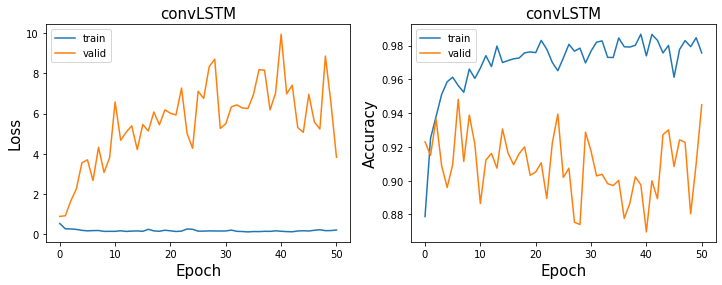

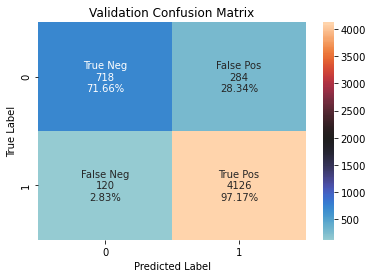

validation loss:0.8824561834335327 accuracy:0.9230182926829268 F1:0.9533271719038817


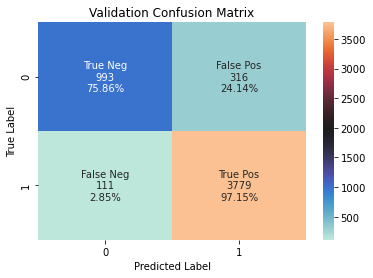

test loss:0.42035162448883057 accuracy:0.9178688209271013 F1:0.9465247338760175
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD48_EPOCH1.pt
best epoch training accuracy:  0.9265608710761033


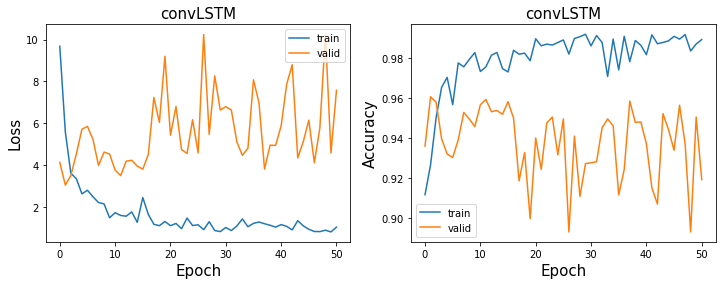

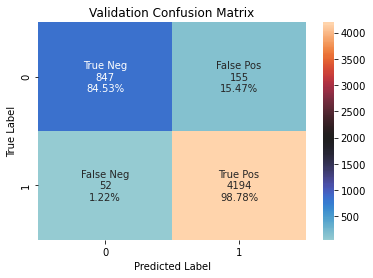

validation loss:3.0552632808685303 accuracy:0.9605564024390244 F1:0.9759162303664921


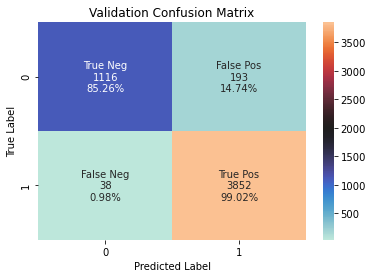

test loss:3.363283395767212 accuracy:0.9555683785343335 F1:0.9708884688090738
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD48_EPOCH34.pt
best epoch training accuracy:  0.9777597590640565


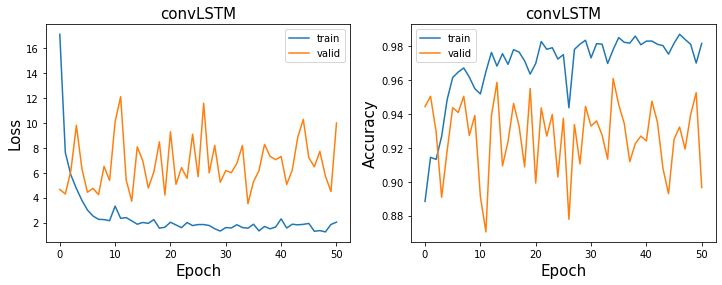

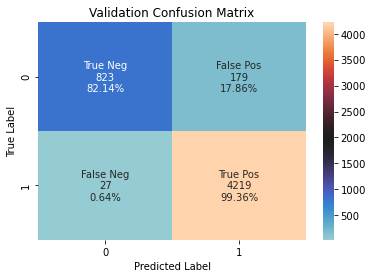

validation loss:3.508070707321167 accuracy:0.9607469512195121 F1:0.9761684405367885


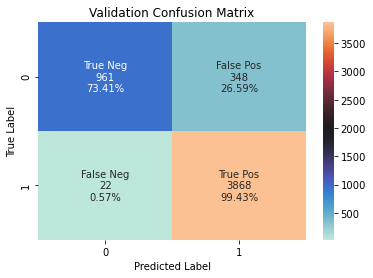

test loss:6.462376594543457 accuracy:0.9288324677822658 F1:0.9543547989143845
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD48_EPOCH2.pt
best epoch training accuracy:  0.9524499015406


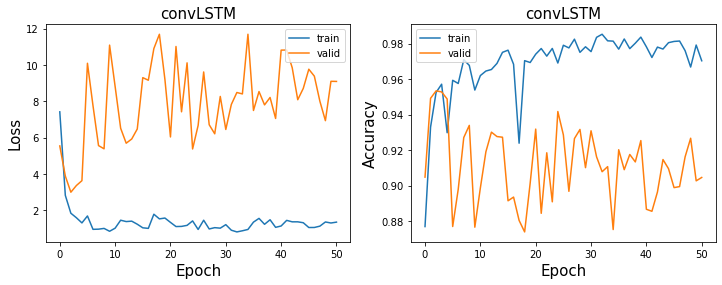

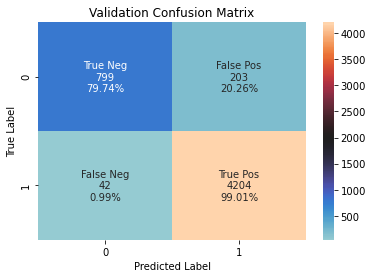

validation loss:2.994175434112549 accuracy:0.9533155487804879 F1:0.9716861204206634


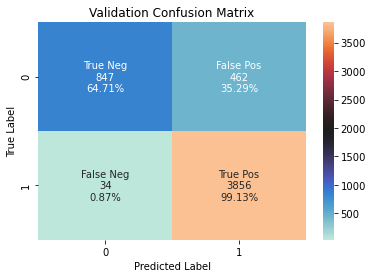

test loss:5.837405681610107 accuracy:0.9045970378919023 F1:0.9395711500974658
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD56_EPOCH49.pt
best epoch training accuracy:  0.5


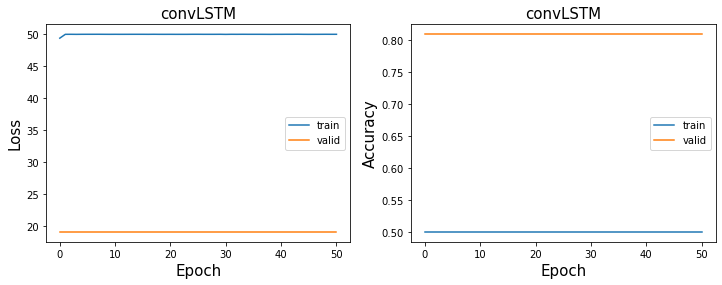

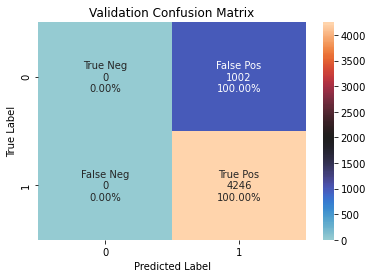

validation loss:19.092987060546875 accuracy:0.8090701219512195 F1:0.8944596587318306


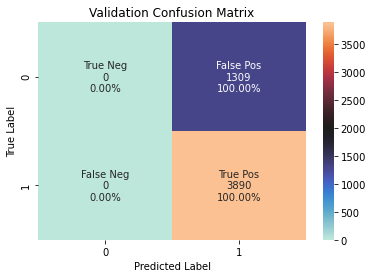

test loss:25.21466636657715 accuracy:0.7482208116945567 F1:0.8559797557487072
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD56_EPOCH20.pt
best epoch training accuracy:  0.9657708791845245


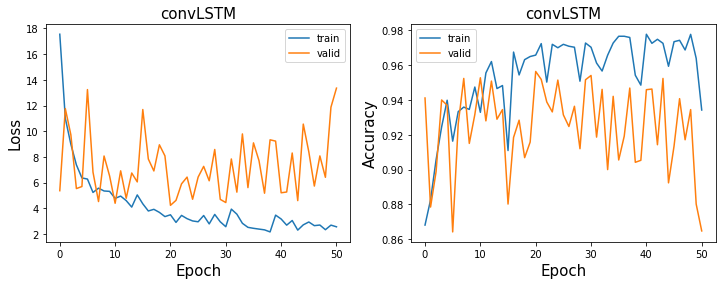

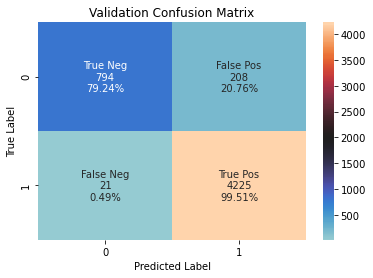

validation loss:4.230355262756348 accuracy:0.9563643292682927 F1:0.973614471713331


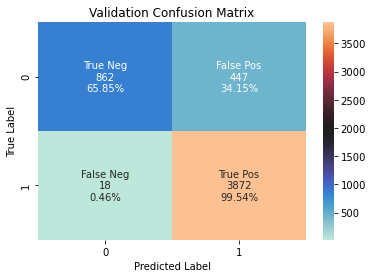

test loss:8.665327072143555 accuracy:0.9105597230236584 F1:0.9433548544280668
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD56_EPOCH5.pt
best epoch training accuracy:  0.9402293524846519


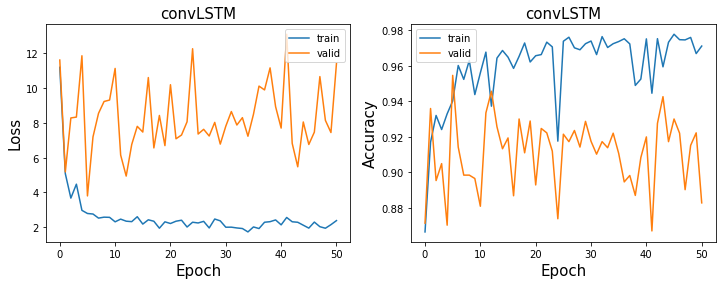

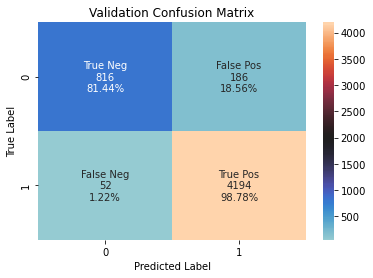

validation loss:3.8023509979248047 accuracy:0.9546493902439024 F1:0.972408996058428


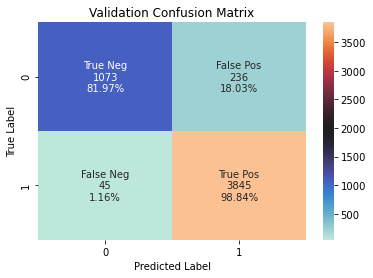

test loss:4.316523551940918 accuracy:0.9459511444508559 F1:0.9647472086312884


In [98]:
for i,(index,row) in enumerate(best_results.iterrows()):

    best_epoch = int(row)
    hidden = int(index[0])
    dropout = index[1]
    alpha = 0
    
    
    # load best model
    model = convLSTM(input_dim = 62, hidden_dim = hidden).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
    model.load_state_dict(torch.load('{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden,best_epoch)))
    
    print('{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, dropout, hidden,best_epoch))
    
#     ## Plot training result
    plot_train_result_file(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden, best_epoch)
    
#     ## Calculate validation accuracy and validation loss
#     val_loss, val_acc, val_preds, val_labels = evaluate(model, optimizer, criterion, val_loader, device='cuda', collect_result = True)
#     print('validation loss:{} accuracy:{}'.format(val_loss, val_acc))
    
#     ## Calculate test accuracy and test loss
#     test_loss, test_acc, test_preds, test_labels = evaluate(model, optimizer, criterion, test_loader, device='cuda', collect_result = True)
#     print('test loss:{} accuracy:{}'.format(test_loss, test_acc))
# #     print(np.mean(np.concatenate(test_labels)))

    ## Calculate validation accuracy and validation loss
    val_loss, val_acc, val_preds, val_F1, val_labels = evaluate(model, optimizer, criterion, val_loader, device='cuda', collect_result = True)
    print('validation loss:{} accuracy:{} F1:{}'.format(val_loss, val_acc, val_F1))
    
    ## Calculate test accuracy and test loss
    test_loss, test_acc, test_preds, test_F1, test_labels = evaluate(model, optimizer, criterion, test_loader, device='cuda', collect_result = True)
    print('test loss:{} accuracy:{} F1:{}'.format(test_loss, test_acc, test_F1))

    
#     ## Confusion matrix-validation
#     predictions_val = np.concatenate(val_preds)
#     labels_val = np.concatenate(val_labels)
    
#     val_cm_filename = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_valcm.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout,hidden)
#     print(val_cm_filename)
#     val_cm_result = {'predictions_val': predictions_val, 'labels_val' : labels_val}

#     pickle.dump( val_cm_result, open( val_cm_filename, "wb" ) )
    
    
#     df_val = pd.DataFrame({'predictions': predictions_val, 'labels': labels_val})

#     cm_val = confusion_matrix(labels_val, predictions_val)
#     ax = plt.axes()
#     group_names = ['True Neg','False Pos','False Neg','True Pos']
#     group_counts = ["{0:0.0f}".format(value) for value in
#                     cm_val.flatten()]

#     TNR = int(group_counts[0]) / (int(group_counts[0])+int(group_counts[1]))
#     FPR = 1 - TNR
#     TPR = int(group_counts[3]) / (int(group_counts[3])+int(group_counts[2]))
#     FNR = 1-TPR
#     group_percentages =[TNR, FPR, FNR, TPR]

#     group_percentages = ["{0:.2%}".format(value) for value in
#                          group_percentages]
#     labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
#               zip(group_names,group_counts,group_percentages)]
#     labels = np.asarray(labels).reshape(2,2)
#     sn.heatmap(cm_val, annot=labels, fmt='', center = 2000)
#     ax.set_title('Validation Confusion Matrix')
#     ax.set_xlabel('Predicted Label')
#     ax.set_ylabel('True Label')
#     plt.show()
    
#     ## Confusion matrix-test
#     predictions_test = np.concatenate(test_preds)
#     labels_test = np.concatenate(test_labels)

#     test_cm_filename = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_testcm.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout,hidden)
#     print(test_cm_filename)
#     test_cm_result = {'predictions_test': predictions_test, 'labels_val' : labels_test}

#     pickle.dump( test_cm_result, open( test_cm_filename, "wb" ) )

#     df_test = pd.DataFrame({'predictions': predictions_test, 'labels': labels_test})

#     cm_test = confusion_matrix(labels_test, predictions_test)
#     ax = plt.axes()
#     group_names = ['True Neg','False Pos','False Neg','True Pos']
#     group_counts = ["{0:0.0f}".format(value) for value in
#                     cm_test.flatten()]

#     TNR = int(group_counts[0]) / (int(group_counts[0])+int(group_counts[1]))
#     FPR = 1 - TNR
#     TPR = int(group_counts[3]) / (int(group_counts[3])+int(group_counts[2]))
#     FNR = 1-TPR
#     group_percentages =[TNR, FPR, FNR, TPR]

#     group_percentages = ["{0:.2%}".format(value) for value in
#                          group_percentages]
#     labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
#               zip(group_names,group_counts,group_percentages)]
#     labels = np.asarray(labels).reshape(2,2)
#     sn.heatmap(cm_test, annot=labels, fmt='', center = 2000)
#     ax.set_title('Test Confusion Matrix')
#     ax.set_xlabel('Predicted Label')
#     ax.set_ylabel('True Label')
#     plt.show()
    


## T-length = 5

In [99]:
time_window = 10
## Load files
move_files, sleep_files = create_files_new(load_path, bad_dates, T_length=5, proceed=1)
train_files, val_files, test_files = [], [], []

## Put files in val, test, and train
for f in move_files+sleep_files:
    if f:
        if f[0][1][3] in val_dates:
            val_files.extend(f)
        elif f[0][1][3] in test_dates:
            test_files.extend(f)
        else:
            train_files.extend(f)           

In [100]:
## Randomly shuffle inside train, val, and test
random.shuffle(train_files)
random.shuffle(val_files)
random.shuffle(test_files)

In [101]:
## Upsample train
train_files = upsample(train_files)

In [102]:
## Balance val 
sleep_files = []
move_files = []
for t in range(len(val_files)):
    if 'sleep' in val_files[t][0]:
        sleep_files.append(val_files[t])
    if 'move' in val_files[t][0]:
        move_files.append(val_files[t])

sleep_sample = sample(sleep_files, len(move_files))
val_2_files = sleep_sample+move_files

In [103]:
len(train_files), len(val_files), len(test_files), len(val_2_files)

(15492, 4561, 4531, 1568)

In [104]:
## Load files to dataloader
T_length = 5

train_dataset = SpectrogramDatasetAtt(files=train_files, load_path=load_path, T_length=T_length, all_label=True)
valid_dataset_bal = SpectrogramDatasetAtt(files=val_2_files, load_path=load_path, T_length=T_length, all_label=True)
test_dataset = SpectrogramDatasetAtt(files=test_files, load_path=load_path, T_length=T_length, all_label=True)

# train_dataset = SpectrogramDatasetAtt(files=train_files, load_path=load_path, T_length=T_length, all_label=True)
valid_dataset = SpectrogramDatasetAtt(files=val_files, load_path=load_path, T_length=T_length, all_label=True)
# test_dataset = SpectrogramDatasetAtt(files=test_files, load_path=load_path, T_length=T_length, all_label=True)

train_loader = DataLoader(dataset=train_dataset, batch_size=128, shuffle = True)
val_loader = DataLoader(dataset=valid_dataset, batch_size=128, shuffle = False)
test_loader = DataLoader(dataset=test_dataset, batch_size=128, shuffle = False)
val_loader_bal = DataLoader(dataset=valid_dataset_bal, batch_size=128, shuffle = False)

### Training

In [105]:
device = torch.device('cuda')

tol = 0.01
learning_rate = 0.01
num_epochs = 51
alpha = 0
model_type = 'convLSTM'
loss_type = 'bce'
reg_type = 'none'
alpha = 0
timewindow = 10
ch = 'all'
# verbose = False
dropout = [0.1,0.3,0.5]
hidden_dim = [10,15,48,56]




convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)


<ipython-input-14-894d578093d0>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  outputs = torch.tensor(outputs).to(device)


0
Train loss for epoch 0: 0.4738466739654541
Val loss for epoch 0: 0.473998486995697
Train loss for epoch 1: 0.09949690103530884
Val loss for epoch 1: 0.910383939743042
Train loss for epoch 2: 0.053127650171518326
Val loss for epoch 2: 2.3345236778259277
Train loss for epoch 3: 0.0363888144493103
Val loss for epoch 3: 1.6556341648101807
Train loss for epoch 4: 0.03170296549797058
Val loss for epoch 4: 2.279994249343872
Train loss for epoch 5: 0.027592677623033524
Val loss for epoch 5: 3.9838123321533203
Train loss for epoch 6: 0.018662597984075546
Val loss for epoch 6: 4.191172122955322
Train loss for epoch 7: 0.017682095989584923
Val loss for epoch 7: 4.52448034286499
Train loss for epoch 8: 0.024966107681393623
Val loss for epoch 8: 3.934100866317749
Train loss for epoch 9: 0.017044195905327797
Val loss for epoch 9: 5.4978179931640625
Train loss for epoch 10: 0.02955705299973488
Val loss for epoch 10: 5.311940670013428
Train loss for epoch 11: 0.033963002264499664
Val loss for epoch 

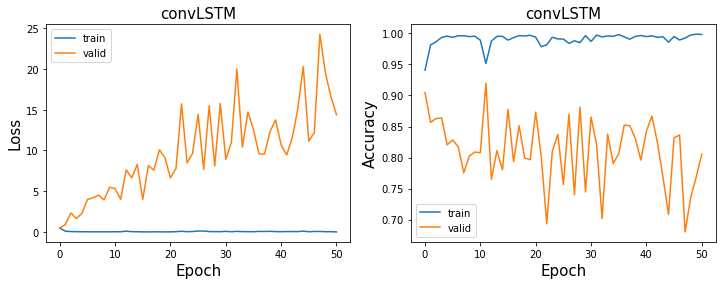

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.6269077062606812
Val loss for epoch 0: 2.1239678859710693
1
Train loss for epoch 1: 0.18038751184940338
Val loss for epoch 1: 0.7436690926551819
Train loss for epoch 2: 0.15813583135604858
Val loss for epoch 2: 4.0150041580200195
Train loss for epoch 3: 0.1432584971189499
Val loss for epoch 3: 3.461256265640259
Train loss for epoch 4: 0.12191145122051239
Val loss for epoch 4: 4.707818508148193
Train loss for epoch 5: 0.09301605075597763
Val loss for epoch 5: 5.673708438873291
Train loss for epoch 6: 0.06785854697227478
Val loss for epoch 6: 4.407378673553467
Train loss for epoch 7: 0.06032858043909073
Val loss for epoch 7: 6.183072566986084
Train loss for epoch 

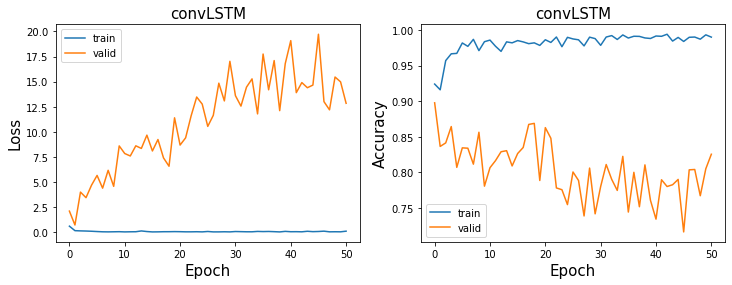

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.44241032004356384
Val loss for epoch 0: 1.1391371488571167
Train loss for epoch 1: 0.23533321917057037
Val loss for epoch 1: 2.685713052749634
Train loss for epoch 2: 0.1696748435497284
Val loss for epoch 2: 4.267205715179443
Train loss for epoch 3: 0.15386421978473663
Val loss for epoch 3: 3.9713642597198486
Train loss for epoch 4: 0.17569757997989655
Val loss for epoch 4: 4.993535995483398
Train loss for epoch 5: 0.19159767031669617
Val loss for epoch 5: 6.902743816375732
Train loss for epoch 6: 0.15395991504192352
Val loss for epoch 6: 5.780043601989746
Train loss for epoch 7: 0.13777020573616028
Val loss for epoch 7: 8.17287826538086
Train loss for epoch 8: 

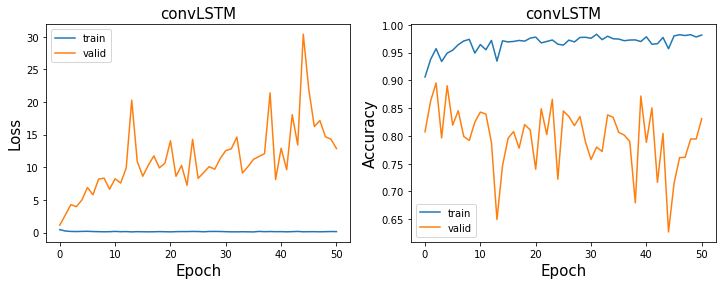

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 1.994946002960205
Val loss for epoch 0: 1.3713642358779907
Train loss for epoch 1: 0.16178105771541595
Val loss for epoch 1: 2.6819047927856445
2
Train loss for epoch 2: 0.06652424484491348
Val loss for epoch 2: 1.1962623596191406
Train loss for epoch 3: 0.07254359871149063
Val loss for epoch 3: 3.0014030933380127
Train loss for epoch 4: 0.048034053295850754
Val loss for epoch 4: 5.596449851989746
Train loss for epoch 5: 0.0305585078895092
Val loss for epoch 5: 4.865520000457764
Train loss for epoch 6: 0.020849647000432014
Val loss for epoch 6: 4.562838077545166
Train loss for epoch 7: 0.035690661519765854
Val loss for epoch 7: 5.406867504119873
Train loss for epo

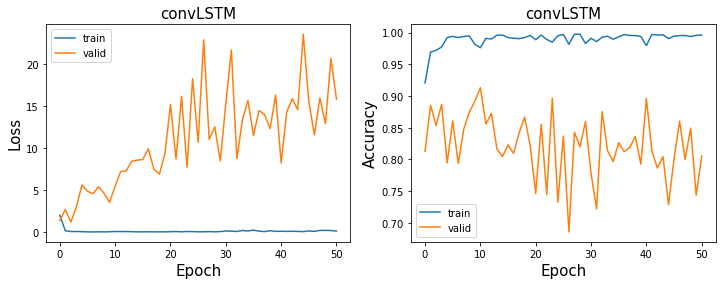

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 1.244544267654419
Val loss for epoch 0: 0.9741383194923401
Train loss for epoch 1: 0.1544109284877777
Val loss for epoch 1: 4.345027923583984
Train loss for epoch 2: 0.13279400765895844
Val loss for epoch 2: 4.134133338928223
Train loss for epoch 3: 0.09077366441488266
Val loss for epoch 3: 4.732274055480957
Train loss for epoch 4: 0.11203427612781525
Val loss for epoch 4: 7.877725601196289
Train loss for epoch 5: 0.06563548743724823
Val loss for epoch 5: 5.712469100952148
Train loss for epoch 6: 0.0980093851685524
Val loss for epoch 6: 6.747678756713867
Train loss for epoch 7: 0.08193739503622055
Val loss for epoch 7: 7.736614227294922
Train loss for epoch 8: 0.0

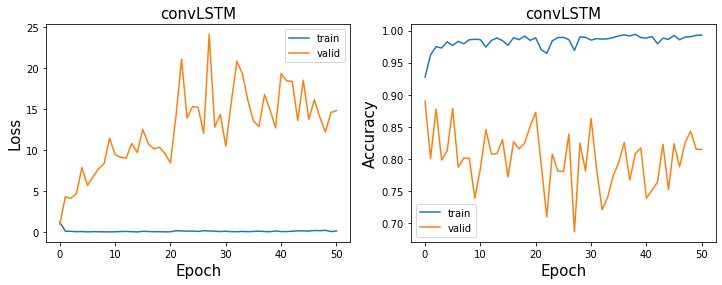

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.5496591925621033
Val loss for epoch 0: 1.573740005493164
1
Train loss for epoch 1: 0.2594066858291626
Val loss for epoch 1: 1.2090741395950317
Train loss for epoch 2: 0.18536244332790375
Val loss for epoch 2: 3.469508409500122
Train loss for epoch 3: 0.20636001229286194
Val loss for epoch 3: 6.640750408172607
Train loss for epoch 4: 0.1871103048324585
Val loss for epoch 4: 6.324026584625244
Train loss for epoch 5: 0.1551220566034317
Val loss for epoch 5: 6.333606719970703
Train loss for epoch 6: 0.16779421269893646
Val loss for epoch 6: 4.8117570877075195
Train loss for epoch 7: 0.2096680849790573
Val loss for epoch 7: 7.562652587890625
Train loss for epoch 8: 0

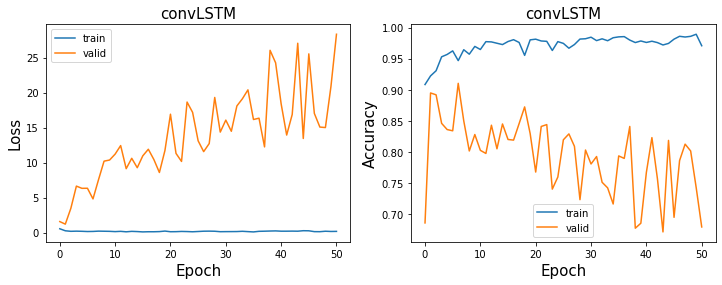

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 22.77760887145996
Val loss for epoch 0: 9.976189613342285
Train loss for epoch 1: 10.924396514892578
Val loss for epoch 1: 21.568904876708984
Train loss for epoch 2: 8.213014602661133
Val loss for epoch 2: 13.106690406799316
Train loss for epoch 3: 5.607724189758301
Val loss for epoch 3: 26.343032836914062
Train loss for epoch 4: 4.907330513000488
Val loss for epoch 4: 10.309956550598145
Train loss for epoch 5: 4.213253498077393
Val loss for epoch 5: 12.45576286315918
Train loss for epoch 6: 4.030125141143799
Val loss for epoch 6: 16.094844818115234
7
Train loss for epoch 7: 3.7099180221557617
Val loss for epoch 7: 9.109556198120117
8
Train loss for epoch 8: 3.0

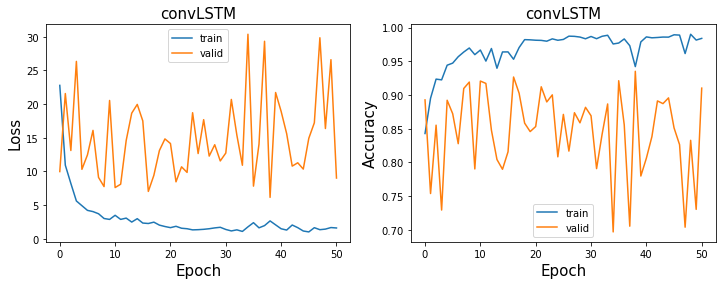

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 6.106112480163574
Val loss for epoch 0: 5.079744338989258
Train loss for epoch 1: 2.857966661453247
Val loss for epoch 1: 9.614114761352539
Train loss for epoch 2: 2.1430208683013916
Val loss for epoch 2: 12.441231727600098
Train loss for epoch 3: 2.0763566493988037
Val loss for epoch 3: 11.834484100341797
Train loss for epoch 4: 1.8332723379135132
Val loss for epoch 4: 10.33623218536377
Train loss for epoch 5: 1.5987498760223389
Val loss for epoch 5: 12.1190824508667
Train loss for epoch 6: 1.2730787992477417
Val loss for epoch 6: 11.445223808288574
Train loss for epoch 7: 1.2242701053619385
Val loss for epoch 7: 12.214700698852539
Train loss for epoch 8: 1.585

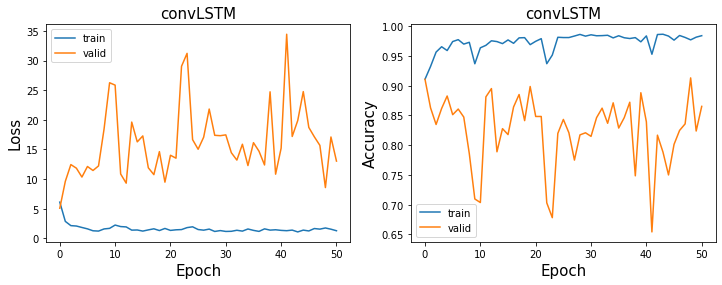

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 13.833935737609863
Val loss for epoch 0: 24.60116958618164
1
Train loss for epoch 1: 5.690497398376465
Val loss for epoch 1: 10.085341453552246
Train loss for epoch 2: 4.339750289916992
Val loss for epoch 2: 10.247262954711914
Train loss for epoch 3: 3.200946092605591
Val loss for epoch 3: 20.74728012084961
Train loss for epoch 4: 2.9138360023498535
Val loss for epoch 4: 27.17038917541504
Train loss for epoch 5: 2.7144243717193604
Val loss for epoch 5: 11.084630012512207
Train loss for epoch 6: 2.5186996459960938
Val loss for epoch 6: 17.469470977783203
7
Train loss for epoch 7: 2.12687611579895
Val loss for epoch 7: 8.974042892456055
Train loss for epoch 8: 1.8

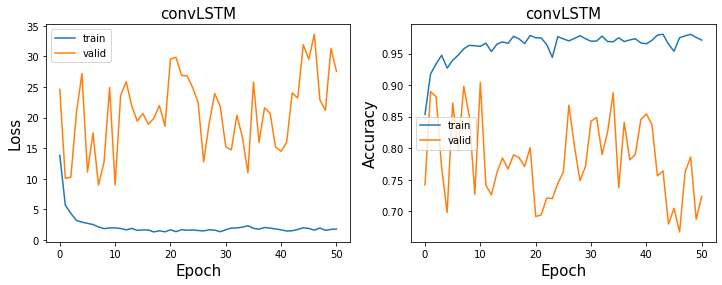

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 49.24004364013672
Val loss for epoch 0: 51.07421875
1
Train loss for epoch 1: 49.9015998840332
Val loss for epoch 1: 51.07421875
2
Train loss for epoch 2: 50.00141906738281
Val loss for epoch 2: 51.07421875
3
Train loss for epoch 3: 49.999290466308594
Val loss for epoch 3: 51.07421875
4
Train loss for epoch 4: 49.99573516845703
Val loss for epoch 4: 51.07421875
5
Train loss for epoch 5: 50.00141906738281
Val loss for epoch 5: 51.07421875
6
Train loss for epoch 6: 50.0035514831543
Val loss for epoch 6: 51.07421875
7
Train loss for epoch 7: 50.00212860107422
Val loss for epoch 7: 51.07421875
8
Train loss for epoch 8: 50.00923538208008
Val loss for epoch 8: 51.0742

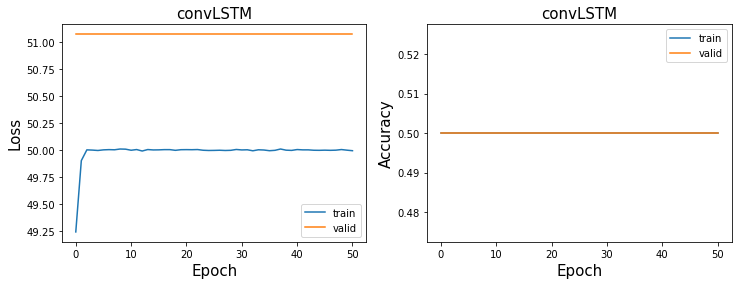

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 49.13225555419922
Val loss for epoch 0: 51.07421875
1
Train loss for epoch 1: 50.00568389892578
Val loss for epoch 1: 51.07421875
2
Train loss for epoch 2: 49.99573516845703
Val loss for epoch 2: 51.07421875
3
Train loss for epoch 3: 49.99857711791992
Val loss for epoch 3: 51.07421875
4
Train loss for epoch 4: 49.776329040527344
Val loss for epoch 4: 45.132286071777344
5
Train loss for epoch 5: 16.191070556640625
Val loss for epoch 5: 24.693490982055664
6
Train loss for epoch 6: 11.703934669494629
Val loss for epoch 6: 22.239246368408203
Train loss for epoch 7: 10.625798225402832
Val loss for epoch 7: 28.3431339263916
8
Train loss for epoch 8: 8.776468276977539


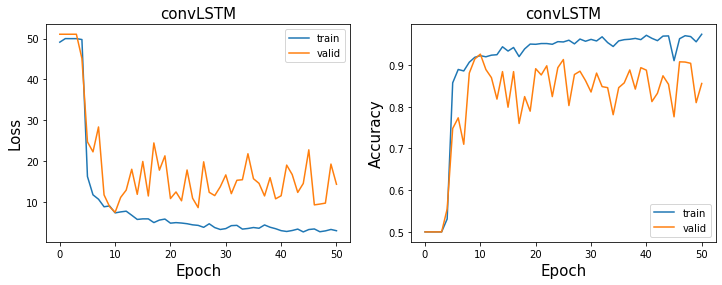

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 9.512767791748047
Val loss for epoch 0: 26.778993606567383
1
Train loss for epoch 1: 4.188620090484619
Val loss for epoch 1: 11.128798484802246
Train loss for epoch 2: 3.2376387119293213
Val loss for epoch 2: 12.832205772399902
Train loss for epoch 3: 2.291383981704712
Val loss for epoch 3: 12.432921409606934
Train loss for epoch 4: 1.9639872312545776
Val loss for epoch 4: 32.22980880737305
Train loss for epoch 5: 2.0043065547943115
Val loss for epoch 5: 17.886981964111328
6
Train loss for epoch 6: 2.197936534881592
Val loss for epoch 6: 11.0849609375
7
Train loss for epoch 7: 1.8945883512496948
Val loss for epoch 7: 9.969210624694824
Train loss for epoch 8: 1.6

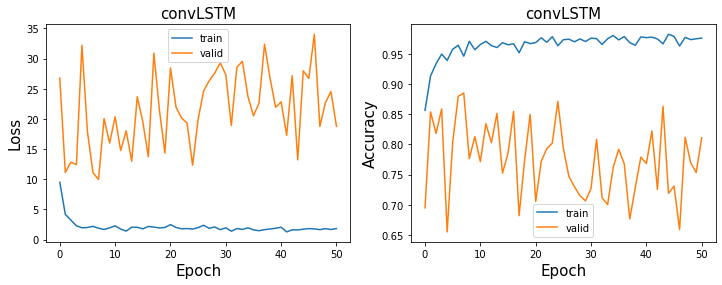

In [28]:
for i in hidden_dim:
    for d in dropout:
        model = convLSTM(input_dim = 62, hidden_dim = i, dropout = d).to(device)
        print(model)
        optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
        criterion = nn.BCELoss() # BCE loss
        train_losses, train_accs, val_losses, val_accs, parameter_history = [], [], [], [],[]

        for epoch in range(num_epochs):
            train_loss, train_acc, parameter_history = train(model, optimizer, criterion, train_loader,  device='cuda')
            val_loss, val_acc = evaluate(model, optimizer, criterion, val_loader, device='cuda')
            train_losses.append(train_loss)
            train_accs.append(train_acc)
            val_losses.append(val_loss)
            val_accs.append(val_acc)
            if epoch == 0:
                torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLENGTH{}_DO{}_HD{}_EPOCH{}_balanced.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length,d, i,epoch))
            if val_loss <= min(val_losses):
                best_epoch = epoch
                print(epoch)
                print('Train loss for epoch {}: {}'.format(epoch, train_loss))
                print('Val loss for epoch {}: {}'.format(epoch, val_loss))
                torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLENGTH{}_DO{}_HD{}_EPOCH{}_balanced.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length,d, i,epoch))
        #     elif verbose:
            else:
                print('Train loss for epoch {}: {}'.format(epoch, train_loss))
                print('Val loss for epoch {}: {}'.format(epoch, val_loss))

        #     if epoch == num_epochs-1:
        #         torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_EPOCH{}.pt'.format(model_saving_path, model_type, CH, loss_type, reg_type, alpha, timewindow, epoch))
        train_result_filename =  '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLENGTH{}_DO{}_HD{}_EPOCH{}_balanced_trainresult.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length,d, i,epoch)
        train_result = {'model_type': model_type, 'train_losses' : train_losses, 'val_losses' : val_losses, 'train_accs': train_accs, 'val_accs': val_accs}
        pickle.dump( train_result, open( train_result_filename, "wb" ) )
        plot_loss_acc(train_losses, val_losses, train_accs, val_accs, model_type)

### Balanced validation result

In [106]:
device = torch.device('cuda')

tol = 0.01
learning_rate = 0.01
num_epochs = 51
alpha = 0
model_type = 'convLSTM'
loss_type = 'bce'
reg_type = 'none'
alpha = 0
timewindow = 10
ch = 'all'
# verbose = False
dropout = [0.1,0.3,0.5]
hidden_dim = [10,15,48,56]




In [107]:
results = []
for h in hidden_dim:
    for d in dropout:
        model_convLSTM = os.listdir(model_saving_path)

        best_result = 0
        reg_alpha = 'REG'+reg_type+str(alpha)+'_'
        dropout_type = 'DO'+str(d)
        hidden_type = 'HD'+str(h)
        t_len = 'TLENGTH'+str(T_length)
        for i, s in enumerate(model_convLSTM):
            if 'convLSTM_CHall_' in s and reg_alpha in s and dropout_type in s and 'trainresult' not in s and hidden_type in s and t_len in s and 'valcm' not in s and 'testcm' not in s and 'balanced' in s:
                model_name = model_convLSTM[i].split('_')
                epoch_name = [ind for ind,item in enumerate(np.array(model_name)) if "EPOCH" in item]
                res = [int(i) for i in model_name[epoch_name[0]] if i.isdigit()]
                if len(res) > 1:
                    epoch_result = res[0]*10+res[1]
                else:
                    epoch_result = res[0]
                if epoch_result>best_result and epoch_result != 50:
                    best_result = epoch_result

        results.append([h,d,best_result])

results = pd.DataFrame(np.array(results), columns=['hidden','dropout', 'epoch'])
best_results = results.groupby(['hidden','dropout']).max('epoch')
print(best_results)


                epoch
hidden dropout       
10.0   0.1        0.0
       0.3        1.0
       0.5        0.0
15.0   0.1        2.0
       0.3        0.0
       0.5        1.0
48.0   0.1       38.0
       0.3        0.0
       0.5        7.0
56.0   0.1       49.0
       0.3       10.0
       0.5        7.0


In [108]:
def plot_train_result_file(model_saving_path, model_type, num_channel, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden, best_epoch):
    fb = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLENGTH{}_DO{}_HD{}_EPOCH50_balanced_trainresult.pt'.format(model_saving_path, model_type, num_channel, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden)
    file = open(fb,'rb')
    train_result = pickle.load(file)
    train_losses = train_result['train_losses']
    val_losses = train_result['val_losses']
    train_accs = train_result['train_accs']
    val_accs = train_result['val_accs']
    model_type = train_result['model_type']
    print('best epoch training accuracy: ', train_accs[best_epoch])
    plot_loss_acc(train_losses, val_losses, train_accs, val_accs, model_type)
    

/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.1_HD10_EPOCH0_balanced.pt
best epoch training accuracy:  0.9408085254256922


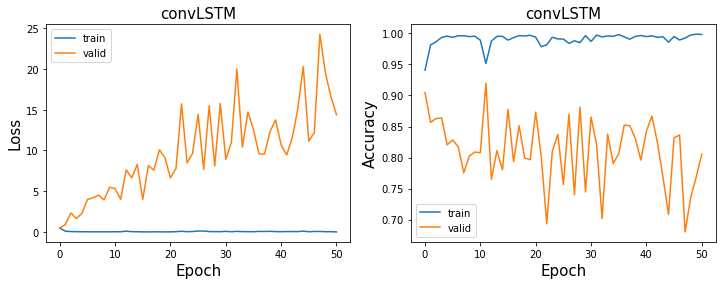

<ipython-input-88-894d578093d0>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  outputs = torch.tensor(outputs).to(device)


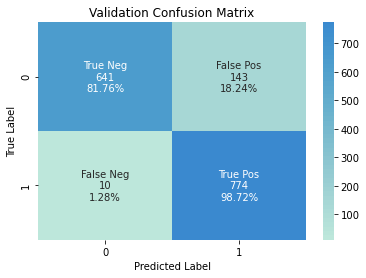

validation loss:0.5395494699478149 accuracy:0.9024234693877551 F1:0.91005291005291


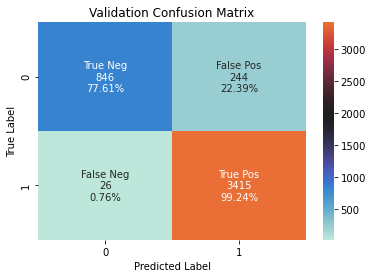

test loss:0.23463913798332214 accuracy:0.9404105054071948 F1:0.9619718309859155
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.3_HD10_EPOCH1_balanced.pt
best epoch training accuracy:  0.9160199235491718


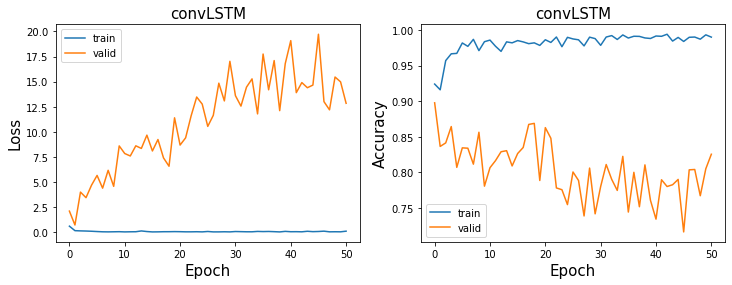

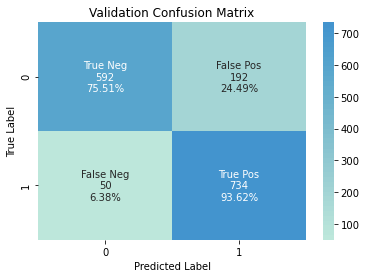

validation loss:0.6751607060432434 accuracy:0.8456632653061225 F1:0.8584795321637427


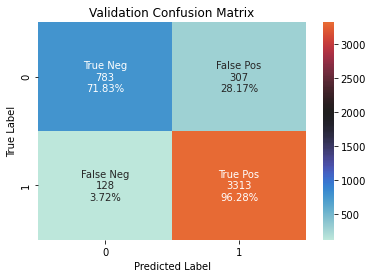

test loss:0.34112370014190674 accuracy:0.9039947031560363 F1:0.938393995184818
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.5_HD10_EPOCH0_balanced.pt
best epoch training accuracy:  0.9060002316691764


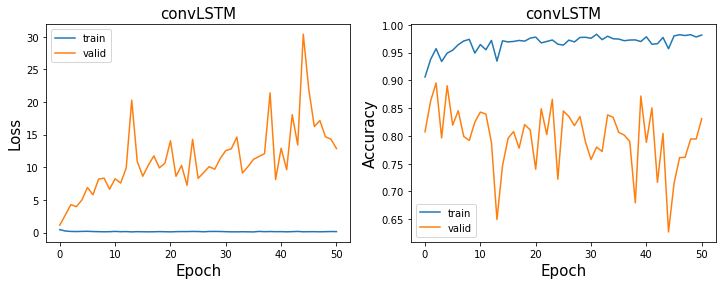

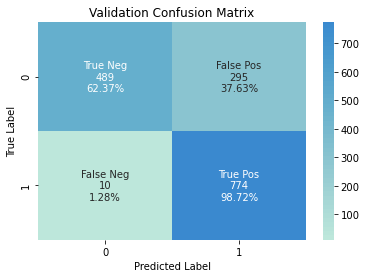

validation loss:1.0628124475479126 accuracy:0.8054846938775511 F1:0.8354020507285483


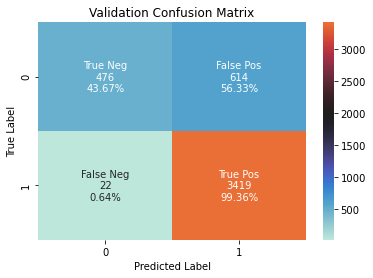

test loss:0.7033042907714844 accuracy:0.8596336349591701 F1:0.914905004013915
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.1_HD15_EPOCH2_balanced.pt
best epoch training accuracy:  0.9720259469477586


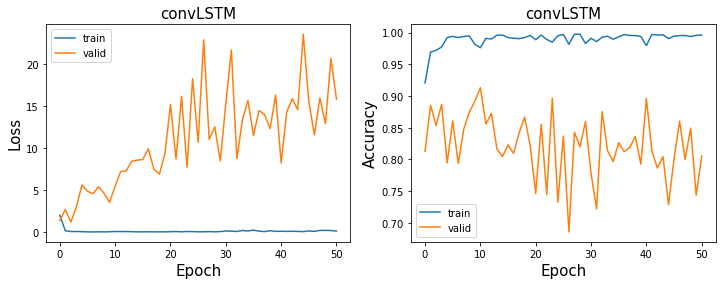

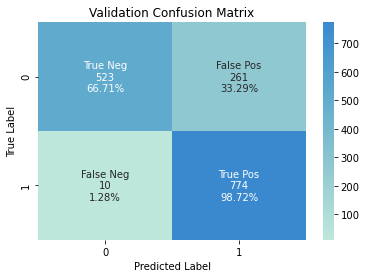

validation loss:1.9421597719192505 accuracy:0.8271683673469388 F1:0.8510170423309511


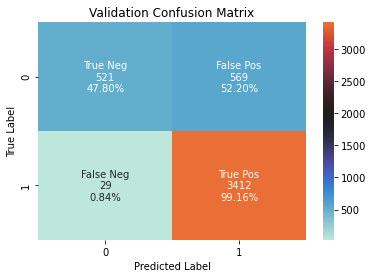

test loss:0.8676905035972595 accuracy:0.868020304568528 F1:0.9194287254109405
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.3_HD15_EPOCH0_balanced.pt
best epoch training accuracy:  0.9275454650758717


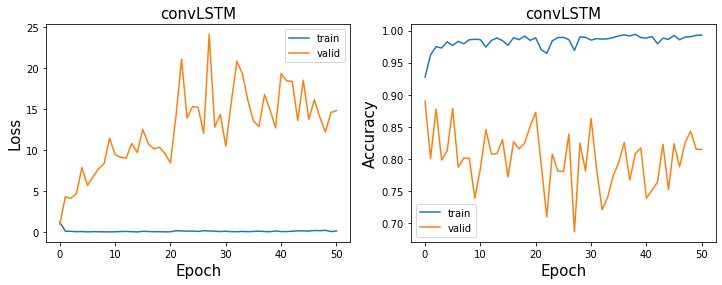

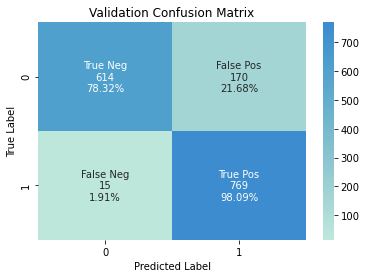

validation loss:0.9340993762016296 accuracy:0.8820153061224489 F1:0.8926291352292514


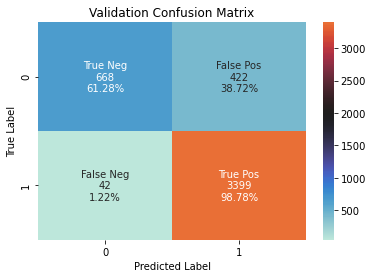

test loss:0.8413118720054626 accuracy:0.8975943500331053 F1:0.9361057559900854
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.5_HD15_EPOCH1_balanced.pt
best epoch training accuracy:  0.9221591567241978


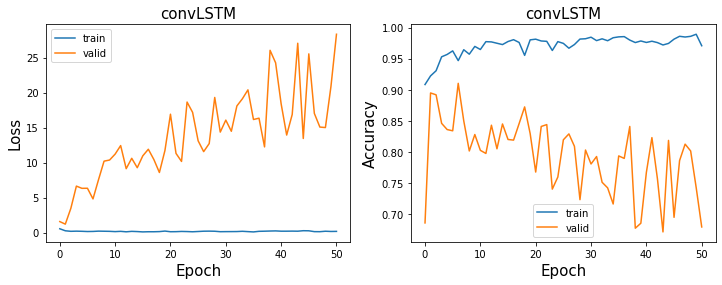

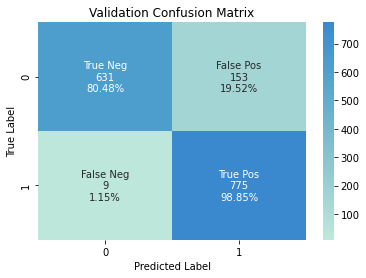

validation loss:1.801418662071228 accuracy:0.8966836734693877 F1:0.905373831775701


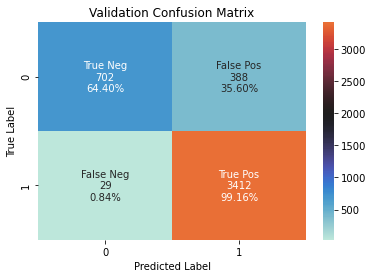

test loss:1.1174030303955078 accuracy:0.9079673361288899 F1:0.942411269161718
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.1_HD48_EPOCH38_balanced.pt
best epoch training accuracy:  0.9420827058959805


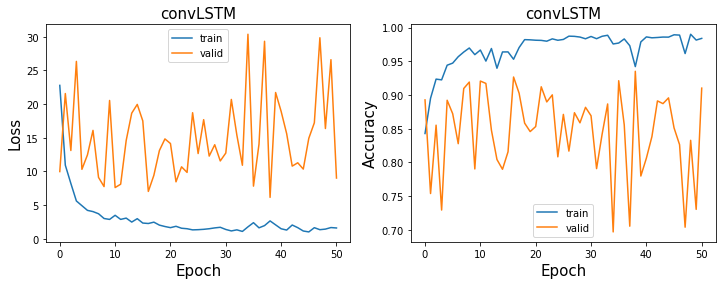

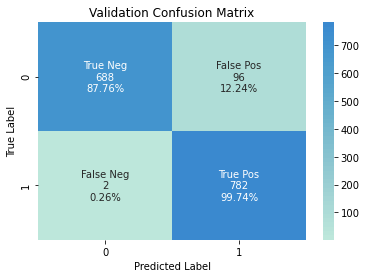

validation loss:6.323771953582764 accuracy:0.9375 F1:0.941034897713598


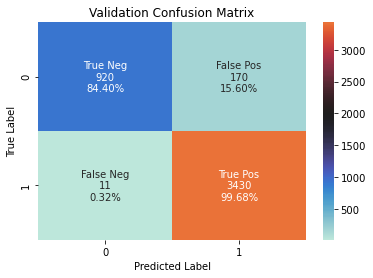

test loss:3.7792320251464844 accuracy:0.960052968439638 F1:0.9742934242295128
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.3_HD48_EPOCH0_balanced.pt
best epoch training accuracy:  0.9109811189621221


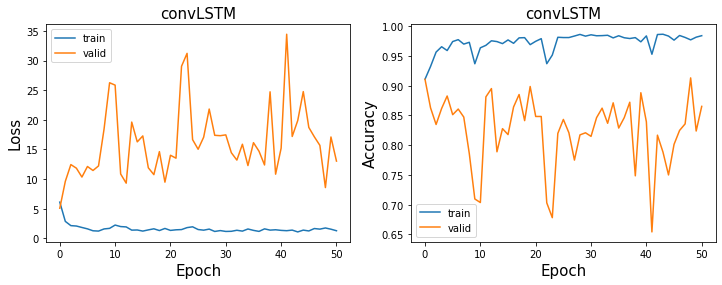

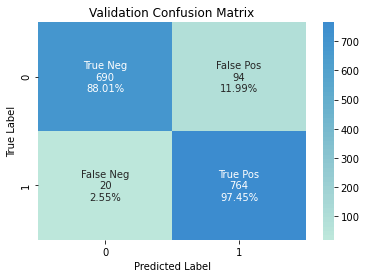

validation loss:4.290091037750244 accuracy:0.9272959183673469 F1:0.9305724725943971


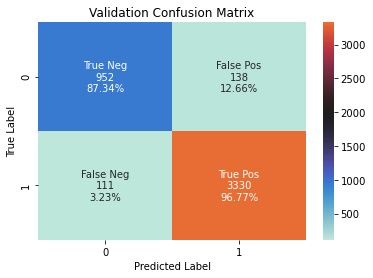

test loss:2.125511646270752 accuracy:0.9450452438755241 F1:0.9639600521059488
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.5_HD48_EPOCH7_balanced.pt
best epoch training accuracy:  0.9575466234217538


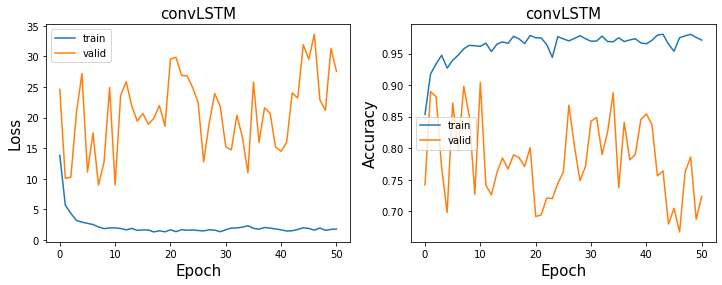

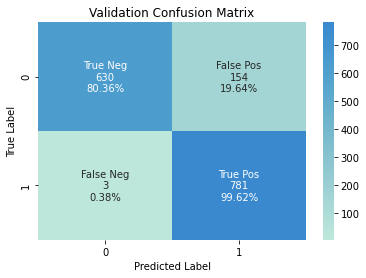

validation loss:9.210722923278809 accuracy:0.8998724489795918 F1:0.9086678301337987


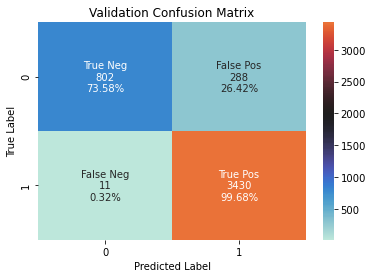

test loss:5.527282238006592 accuracy:0.934010152284264 F1:0.9582343902779717
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.1_HD56_EPOCH49_balanced.pt
best epoch training accuracy:  0.5


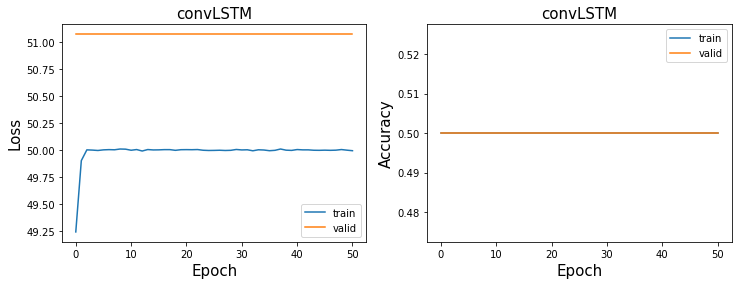

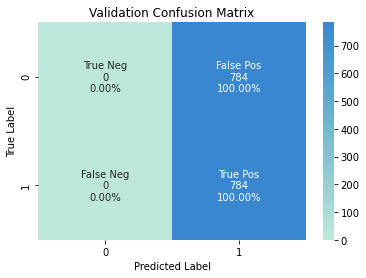

validation loss:52.88461685180664 accuracy:0.5 F1:0.6666666666666666


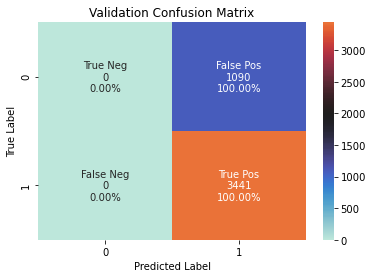

test loss:23.982162475585938 accuracy:0.7594350033105275 F1:0.8632714500752634
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.3_HD56_EPOCH10_balanced.pt
best epoch training accuracy:  0.9224487431947179


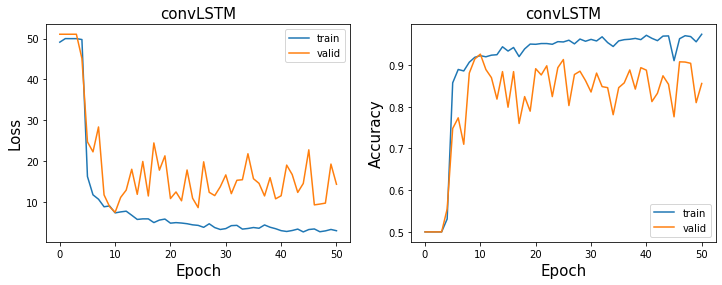

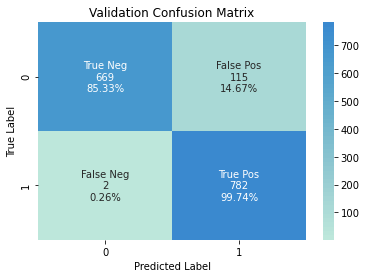

validation loss:7.8855366706848145 accuracy:0.9253826530612245 F1:0.9303985722784057


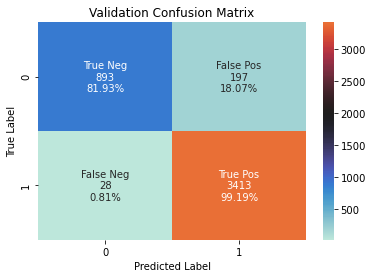

test loss:4.701375961303711 accuracy:0.950342087839329 F1:0.9680896326762162
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.5_HD56_EPOCH7_balanced.pt
best epoch training accuracy:  0.9462527510714699


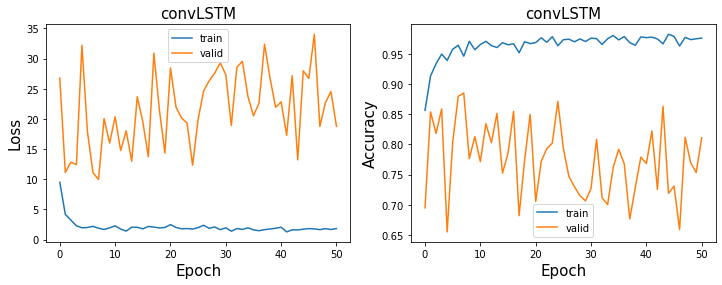

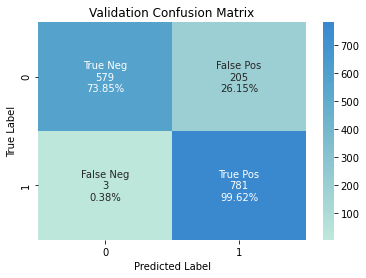

validation loss:12.945137023925781 accuracy:0.8673469387755102 F1:0.8824858757062147


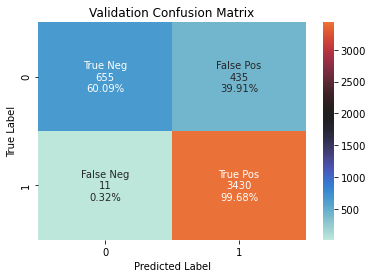

test loss:8.1725435256958 accuracy:0.9015669830059589 F1:0.9389542841500137


In [109]:
for i,(index,row) in enumerate(best_results.iterrows()):

    best_epoch = int(row)
    hidden = int(index[0])
    dropout = index[1]
    alpha = 0
    
    
    # load best model
    model = convLSTM(input_dim = 62, hidden_dim = hidden).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
    model.load_state_dict(torch.load('{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLENGTH{}_DO{}_HD{}_EPOCH{}_balanced.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden,best_epoch)))
    
    print('{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLENGTH{}_DO{}_HD{}_EPOCH{}_balanced.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, dropout, hidden,best_epoch))

    ## Plot training result
    plot_train_result_file(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden, best_epoch)
    
    ## Calculate validation accuracy and validation loss
    val_loss, val_acc, val_preds, val_F1, val_labels = evaluate(model, optimizer, criterion, val_loader_bal, device='cuda', collect_result = True)
    print('validation loss:{} accuracy:{} F1:{}'.format(val_loss, val_acc, val_F1))
    
    ## Calculate test accuracy and test loss
    test_loss, test_acc, test_preds, test_F1, test_labels = evaluate(model, optimizer, criterion, test_loader, device='cuda', collect_result = True)
    print('test loss:{} accuracy:{} F1:{}'.format(test_loss, test_acc, test_F1))
    
    
#     ## Calculate validation accuracy and validation loss
#     val_loss, val_acc, val_preds, val_labels = evaluate(model, optimizer, criterion, val_loader, device='cuda', collect_result = True)
#     print('validation loss:{} accuracy:{}'.format(val_loss, val_acc))
    
#     ## Calculate test accuracy and test loss
#     test_loss, test_acc, test_preds, test_labels = evaluate(model, optimizer, criterion, test_loader, device='cuda', collect_result = True)
#     print('test loss:{} accuracy:{}'.format(test_loss, test_acc))
#     print(np.mean(np.concatenate(test_labels)))
    
#     ## Confusion matrix-validation
#     predictions_val = np.concatenate(val_preds)
#     labels_val = np.concatenate(val_labels)
    
#     val_cm_filename = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLENGTH{}_DO{}_HD{}_balanced_valcm.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout,hidden)
#     print(val_cm_filename)
#     val_cm_result = {'predictions_val': predictions_val, 'labels_val' : labels_val}

#     pickle.dump( val_cm_result, open( val_cm_filename, "wb" ) )
    
    
#     df_val = pd.DataFrame({'predictions': predictions_val, 'labels': labels_val})

#     cm_val = confusion_matrix(labels_val, predictions_val)
#     ax = plt.axes()
#     group_names = ['True Neg','False Pos','False Neg','True Pos']
#     group_counts = ["{0:0.0f}".format(value) for value in
#                     cm_val.flatten()]

#     TNR = int(group_counts[0]) / (int(group_counts[0])+int(group_counts[1]))
#     FPR = 1 - TNR
#     TPR = int(group_counts[3]) / (int(group_counts[3])+int(group_counts[2]))
#     FNR = 1-TPR
#     group_percentages =[TNR, FPR, FNR, TPR]

#     group_percentages = ["{0:.2%}".format(value) for value in
#                          group_percentages]
#     labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
#               zip(group_names,group_counts,group_percentages)]
#     labels = np.asarray(labels).reshape(2,2)
#     sn.heatmap(cm_val, annot=labels, fmt='', center = 2000)
#     ax.set_title('Validation Confusion Matrix')
#     ax.set_xlabel('Predicted Label')
#     ax.set_ylabel('True Label')
#     plt.show()
    
#     ## Confusion matrix-test
#     predictions_test = np.concatenate(test_preds)
#     labels_test = np.concatenate(test_labels)

#     test_cm_filename = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLENGTH{}_DO{}_HD{}_balanced_testcm.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout,hidden)
#     print(test_cm_filename)
#     test_cm_result = {'predictions_test': predictions_test, 'labels_val' : labels_test}

#     pickle.dump( test_cm_result, open( test_cm_filename, "wb" ) )

#     df_test = pd.DataFrame({'predictions': predictions_test, 'labels': labels_test})

#     cm_test = confusion_matrix(labels_test, predictions_test)
#     ax = plt.axes()
#     group_names = ['True Neg','False Pos','False Neg','True Pos']
#     group_counts = ["{0:0.0f}".format(value) for value in
#                     cm_test.flatten()]

#     TNR = int(group_counts[0]) / (int(group_counts[0])+int(group_counts[1]))
#     FPR = 1 - TNR
#     TPR = int(group_counts[3]) / (int(group_counts[3])+int(group_counts[2]))
#     FNR = 1-TPR
#     group_percentages =[TNR, FPR, FNR, TPR]

#     group_percentages = ["{0:.2%}".format(value) for value in
#                          group_percentages]
#     labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
#               zip(group_names,group_counts,group_percentages)]
#     labels = np.asarray(labels).reshape(2,2)
#     sn.heatmap(cm_test, annot=labels, fmt='', center = 2000)
#     ax.set_title('Test Confusion Matrix')
#     ax.set_xlabel('Predicted Label')
#     ax.set_ylabel('True Label')
#     plt.show()
    


### Non balanced result

In [110]:
device = torch.device('cuda')

tol = 0.01
learning_rate = 0.01
num_epochs = 51
alpha = 0
model_type = 'convLSTM'
loss_type = 'bce'
reg_type = 'none'
alpha = 0
timewindow = 10
ch = 'all'
# verbose = False
dropout = [0.1,0.3,0.5]
hidden_dim = [10,15,48,56]




convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)


<ipython-input-15-894d578093d0>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  outputs = torch.tensor(outputs).to(device)


0
Train loss for epoch 0: 1.0060784816741943
Val loss for epoch 0: 0.1486615091562271
Train loss for epoch 1: 0.085830919444561
Val loss for epoch 1: 0.7592951655387878
Train loss for epoch 2: 0.04032764583826065
Val loss for epoch 2: 0.9238168001174927
Train loss for epoch 3: 0.02600403130054474
Val loss for epoch 3: 1.5330018997192383
Train loss for epoch 4: 0.01090177334845066
Val loss for epoch 4: 2.062804937362671
Train loss for epoch 5: 0.015519758686423302
Val loss for epoch 5: 0.9508756995201111
Train loss for epoch 6: 0.017322346568107605
Val loss for epoch 6: 1.312593698501587
Train loss for epoch 7: 0.017204077914357185
Val loss for epoch 7: 2.0145647525787354
Train loss for epoch 8: 0.017758483067154884
Val loss for epoch 8: 1.3995519876480103
Train loss for epoch 9: 0.02400936745107174
Val loss for epoch 9: 2.313868999481201
Train loss for epoch 10: 0.034313514828681946
Val loss for epoch 10: 2.275679349899292
Train loss for epoch 11: 0.0156327523291111
Val loss for epoch 

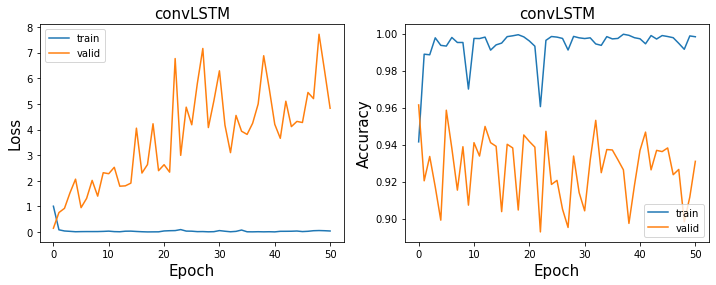

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.8406234383583069
Val loss for epoch 0: 1.1565924882888794
1
Train loss for epoch 1: 0.17688752710819244
Val loss for epoch 1: 0.9325301051139832
Train loss for epoch 2: 0.09379158914089203
Val loss for epoch 2: 1.0782400369644165
Train loss for epoch 3: 0.061674706637859344
Val loss for epoch 3: 1.1927868127822876
Train loss for epoch 4: 0.0809202641248703
Val loss for epoch 4: 1.2129420042037964
Train loss for epoch 5: 0.058846864849328995
Val loss for epoch 5: 1.8396602869033813
Train loss for epoch 6: 0.03923433646559715
Val loss for epoch 6: 1.6395268440246582
Train loss for epoch 7: 0.035162024199962616
Val loss for epoch 7: 6.157348155975342
Train loss for

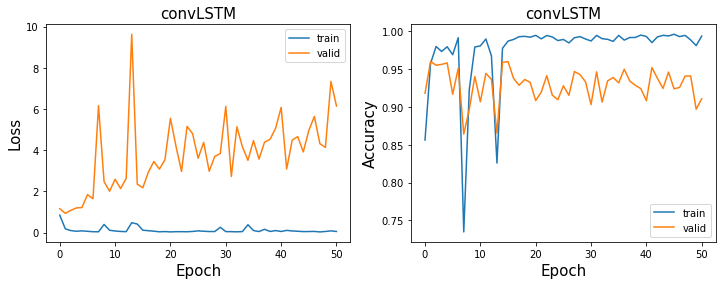

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.45857709646224976
Val loss for epoch 0: 0.8801737427711487
1
Train loss for epoch 1: 0.2379298359155655
Val loss for epoch 1: 0.40512654185295105
Train loss for epoch 2: 0.15523545444011688
Val loss for epoch 2: 1.8785523176193237
Train loss for epoch 3: 0.10544537007808685
Val loss for epoch 3: 2.0069844722747803
Train loss for epoch 4: 0.11835890263319016
Val loss for epoch 4: 2.8371098041534424
Train loss for epoch 5: 0.0784323513507843
Val loss for epoch 5: 2.054870367050171
Train loss for epoch 6: 0.09658787399530411
Val loss for epoch 6: 3.1194450855255127
Train loss for epoch 7: 0.0950874611735344
Val loss for epoch 7: 3.1041088104248047
Train loss for ep

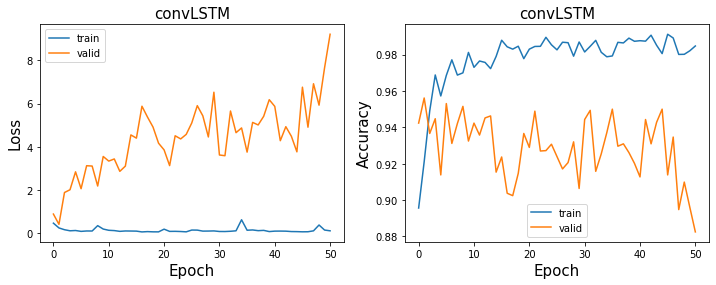

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 3.0343658924102783
Val loss for epoch 0: 1.163766860961914
Train loss for epoch 1: 0.13301587104797363
Val loss for epoch 1: 1.2494713068008423
Train loss for epoch 2: 0.05856218934059143
Val loss for epoch 2: 1.6895023584365845
Train loss for epoch 3: 0.09782560169696808
Val loss for epoch 3: 1.6456339359283447
Train loss for epoch 4: 0.04901394248008728
Val loss for epoch 4: 1.9703203439712524
Train loss for epoch 5: 0.024444695562124252
Val loss for epoch 5: 2.277362108230591
Train loss for epoch 6: 0.013904151506721973
Val loss for epoch 6: 2.579669237136841
Train loss for epoch 7: 0.02538645640015602
Val loss for epoch 7: 1.539605736732483
Train loss for epoc

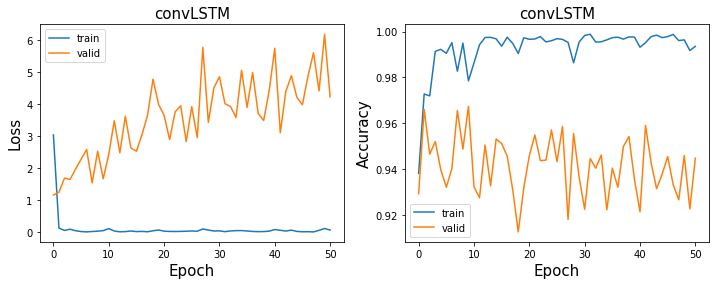

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 4.131488800048828
Val loss for epoch 0: 1.0150134563446045
1
Train loss for epoch 1: 0.16740283370018005
Val loss for epoch 1: 0.8443224430084229
Train loss for epoch 2: 0.07246553152799606
Val loss for epoch 2: 1.503919005393982
Train loss for epoch 3: 0.06572403013706207
Val loss for epoch 3: 1.901976227760315
Train loss for epoch 4: 0.0753655657172203
Val loss for epoch 4: 2.7599151134490967
Train loss for epoch 5: 0.05003538727760315
Val loss for epoch 5: 3.3571369647979736
Train loss for epoch 6: 0.048934344202280045
Val loss for epoch 6: 1.6957613229751587
Train loss for epoch 7: 0.07854682952165604
Val loss for epoch 7: 2.2831666469573975
Train loss for epo

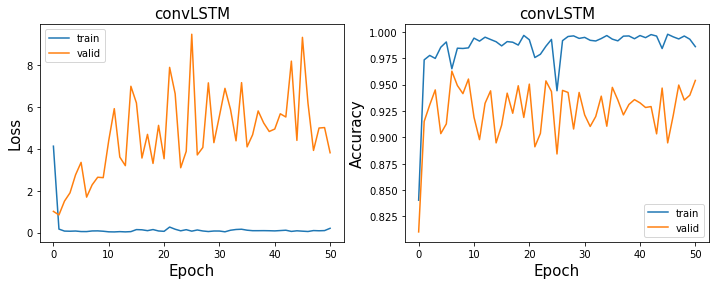

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.8644373416900635
Val loss for epoch 0: 0.4931505620479584
Train loss for epoch 1: 0.20777642726898193
Val loss for epoch 1: 1.6794006824493408
Train loss for epoch 2: 0.18510594964027405
Val loss for epoch 2: 1.8423722982406616
Train loss for epoch 3: 0.14495959877967834
Val loss for epoch 3: 1.9809333086013794
Train loss for epoch 4: 0.26157480478286743
Val loss for epoch 4: 2.3811280727386475
Train loss for epoch 5: 0.13031606376171112
Val loss for epoch 5: 3.673762083053589
Train loss for epoch 6: 0.13752956688404083
Val loss for epoch 6: 2.7324273586273193
Train loss for epoch 7: 0.17031230032444
Val loss for epoch 7: 3.2766776084899902
Train loss for epoch 

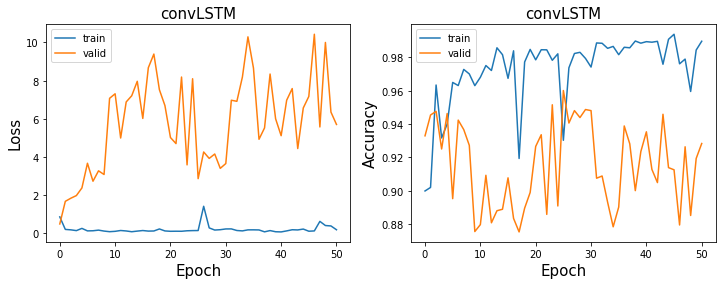

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 49.158607482910156
Val loss for epoch 0: 17.202770233154297
1
Train loss for epoch 1: 49.999996185302734
Val loss for epoch 1: 17.202770233154297
2
Train loss for epoch 2: 50.39702606201172
Val loss for epoch 2: 17.202770233154297
3
Train loss for epoch 3: 50.19851303100586
Val loss for epoch 3: 17.202770233154297
4
Train loss for epoch 4: 49.602970123291016
Val loss for epoch 4: 17.202770233154297
5
Train loss for epoch 5: 49.999996185302734
Val loss for epoch 5: 17.202770233154297
6
Train loss for epoch 6: 49.999996185302734
Val loss for epoch 6: 17.202770233154297
7
Train loss for epoch 7: 49.801483154296875
Val loss for epoch 7: 17.202770233154297
8
Train lo

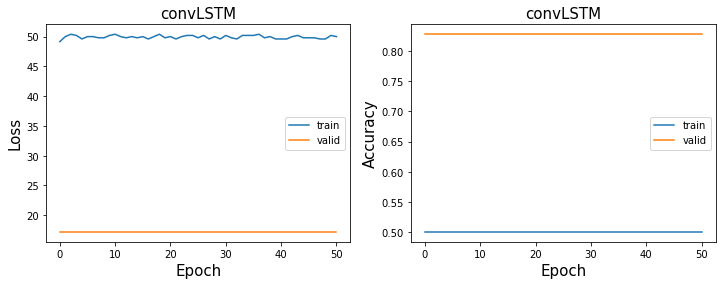

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 7.482602596282959
Val loss for epoch 0: 3.7557034492492676
Train loss for epoch 1: 4.602021217346191
Val loss for epoch 1: 13.964411735534668
Train loss for epoch 2: 3.489450693130493
Val loss for epoch 2: 4.72112512588501
Train loss for epoch 3: 3.053386926651001
Val loss for epoch 3: 7.512942790985107
Train loss for epoch 4: 2.488753080368042
Val loss for epoch 4: 5.3163886070251465
Train loss for epoch 5: 2.187849998474121
Val loss for epoch 5: 5.070120334625244
Train loss for epoch 6: 2.1672847270965576
Val loss for epoch 6: 9.410950660705566
Train loss for epoch 7: 1.7100993394851685
Val loss for epoch 7: 5.118109226226807
Train loss for epoch 8: 2.17678594

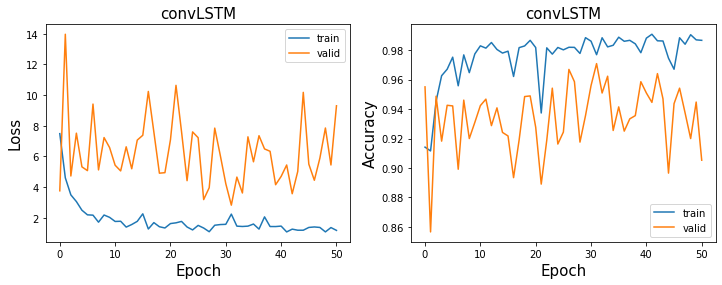

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 19.67786407470703
Val loss for epoch 0: 10.589300155639648
1
Train loss for epoch 1: 6.295057773590088
Val loss for epoch 1: 3.948125123977661
Train loss for epoch 2: 4.05784797668457
Val loss for epoch 2: 8.763044357299805
Train loss for epoch 3: 3.217690944671631
Val loss for epoch 3: 9.8606538772583
Train loss for epoch 4: 2.9310686588287354
Val loss for epoch 4: 6.822239875793457
Train loss for epoch 5: 2.4465816020965576
Val loss for epoch 5: 10.455804824829102
Train loss for epoch 6: 2.700810194015503
Val loss for epoch 6: 6.470771789550781
Train loss for epoch 7: 2.107625722885132
Val loss for epoch 7: 4.297425746917725
Train loss for epoch 8: 2.391993522

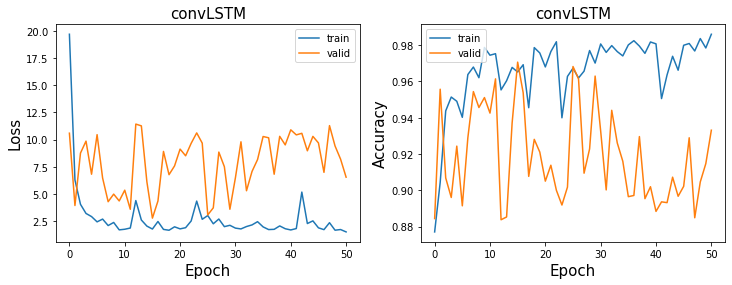

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 49.818321228027344
Val loss for epoch 0: 82.79722595214844
1
Train loss for epoch 1: 49.999996185302734
Val loss for epoch 1: 82.79722595214844
2
Train loss for epoch 2: 49.801483154296875
Val loss for epoch 2: 82.79722595214844
3
Train loss for epoch 3: 49.999996185302734
Val loss for epoch 3: 82.79722595214844
4
Train loss for epoch 4: 50.39702606201172
Val loss for epoch 4: 82.79722595214844
5
Train loss for epoch 5: 50.19851303100586
Val loss for epoch 5: 82.79722595214844
6
Train loss for epoch 6: 49.801483154296875
Val loss for epoch 6: 82.79722595214844
7
Train loss for epoch 7: 49.801483154296875
Val loss for epoch 7: 82.79722595214844
8
Train loss for e

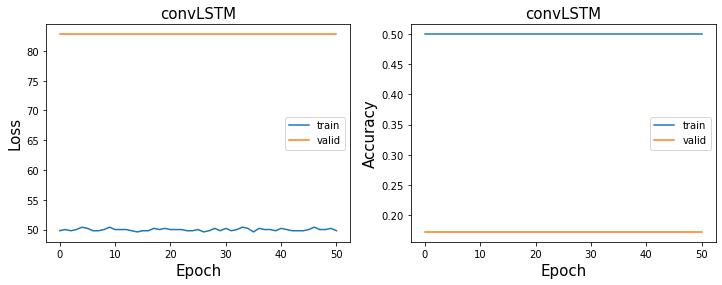

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 46.455318450927734
Val loss for epoch 0: 15.378416061401367
1
Train loss for epoch 1: 13.030202865600586
Val loss for epoch 1: 12.551326751708984
2
Train loss for epoch 2: 9.758213996887207
Val loss for epoch 2: 5.158755779266357
Train loss for epoch 3: 8.785652160644531
Val loss for epoch 3: 6.464941501617432
4
Train loss for epoch 4: 7.295980930328369
Val loss for epoch 4: 3.9426629543304443
5
Train loss for epoch 5: 6.582904815673828
Val loss for epoch 5: 3.4172842502593994
Train loss for epoch 6: 4.361076831817627
Val loss for epoch 6: 6.742767810821533
Train loss for epoch 7: 4.092846393585205
Val loss for epoch 7: 6.935682773590088
Train loss for epoch 8: 

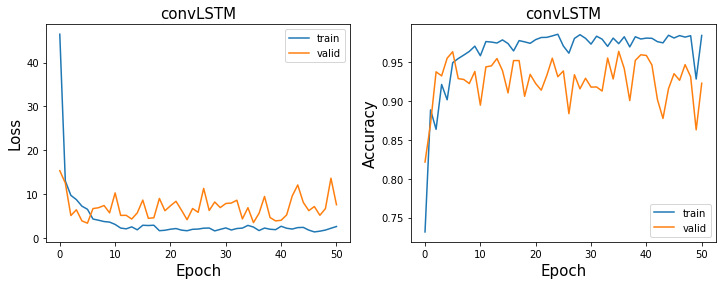

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 28.855058670043945
Val loss for epoch 0: 5.573577880859375
Train loss for epoch 1: 11.249462127685547
Val loss for epoch 1: 10.277134895324707
Train loss for epoch 2: 6.812231540679932
Val loss for epoch 2: 8.76607608795166
3
Train loss for epoch 3: 4.195690155029297
Val loss for epoch 3: 5.0883564949035645
Train loss for epoch 4: 4.250261306762695
Val loss for epoch 4: 5.103443622589111
Train loss for epoch 5: 5.137036323547363
Val loss for epoch 5: 11.112678527832031
Train loss for epoch 6: 3.534219264984131
Val loss for epoch 6: 9.879472732543945
7
Train loss for epoch 7: 3.328677177429199
Val loss for epoch 7: 4.259671688079834
Train loss for epoch 8: 2.7704

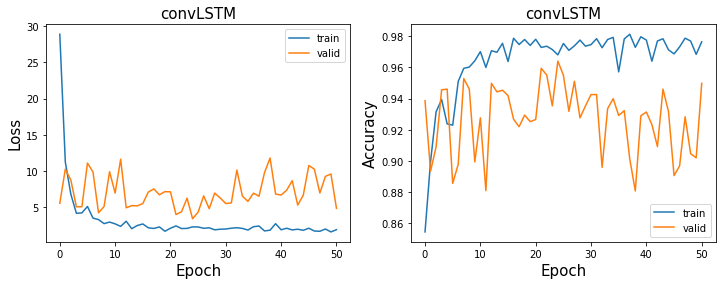

In [47]:
for i in hidden_dim:
    for d in dropout:
        model = convLSTM(input_dim = 62, hidden_dim = i, dropout = d).to(device)
        print(model)
        optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
        criterion = nn.BCELoss() # BCE loss
        train_losses, train_accs, val_losses, val_accs, parameter_history = [], [], [], [],[]

        for epoch in range(num_epochs):
            train_loss, train_acc, parameter_history = train(model, optimizer, criterion, train_loader,  device='cuda')
            val_loss, val_acc = evaluate(model, optimizer, criterion, val_loader, device='cuda')
            train_losses.append(train_loss)
            train_accs.append(train_acc)
            val_losses.append(val_loss)
            val_accs.append(val_acc)
            if epoch == 0:
                torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch))

            if val_loss <= min(val_losses):
                best_epoch = epoch
                print(epoch)
                print('Train loss for epoch {}: {}'.format(epoch, train_loss))
                print('Val loss for epoch {}: {}'.format(epoch, val_loss))
                torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch))
            else:
                print('Train loss for epoch {}: {}'.format(epoch, train_loss))
                print('Val loss for epoch {}: {}'.format(epoch, val_loss))

        #     if epoch == num_epochs-1:
        #         torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_EPOCH{}.pt'.format(model_saving_path, model_type, CH, loss_type, reg_type, alpha, timewindow, epoch))

        train_result_filename =  '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}_trainresult.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch)
        train_result = {'model_type': model_type, 'train_losses' : train_losses, 'val_losses' : val_losses, 'train_accs': train_accs, 'val_accs': val_accs}
        pickle.dump( train_result, open( train_result_filename, "wb" ) )
        plot_loss_acc(train_losses, val_losses, train_accs, val_accs, model_type)

In [111]:
results = []
for h in hidden_dim:
    for d in dropout:
        model_convLSTM = os.listdir(model_saving_path)

        best_result = 0
        reg_alpha = 'REG'+reg_type+str(alpha)+'_'
        dropout_type = 'DO'+str(d)
        hidden_type = 'HD'+str(h)
        t_len = 'TLEN'+str(T_length)
        for i, s in enumerate(model_convLSTM):
            if 'convLSTM_CHall_' in s and reg_alpha in s and dropout_type in s and t_len in s and hidden_type in s and '_balanced' not in s and 'trainresult' not in s and 'valcm' not in s and 'testcm' not in s:
                model_name = model_convLSTM[i].split('_')
                epoch_name = [ind for ind,item in enumerate(np.array(model_name)) if "EPOCH" in item]
                res = [int(i) for i in model_name[epoch_name[0]] if i.isdigit()]
                if len(res) > 1:
                    epoch_result = res[0]*10+res[1]
                else:
                    epoch_result = res[0]
                if epoch_result>best_result and epoch_result != 50:
                    best_result = epoch_result
#                 print(model_name)

        results.append([h,d,best_result])

results = pd.DataFrame(np.array(results), columns=['hidden','dropout', 'epoch'])
best_results = results.groupby(['hidden','dropout']).max('epoch')
print(best_results)


                epoch
hidden dropout       
10.0   0.1        0.0
       0.3        1.0
       0.5        1.0
15.0   0.1        0.0
       0.3        1.0
       0.5        0.0
48.0   0.1       49.0
       0.3       31.0
       0.5       15.0
56.0   0.1       49.0
       0.3        5.0
       0.5       24.0


In [112]:
def plot_train_result_file(model_saving_path, model_type, num_channel, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden, best_epoch):
    fb = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH50_trainresult.pt'.format(model_saving_path, model_type, num_channel, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden)
    file = open(fb,'rb')
    train_result = pickle.load(file)
    train_losses = train_result['train_losses']
    val_losses = train_result['val_losses']
    train_accs = train_result['train_accs']
    val_accs = train_result['val_accs']
    model_type = train_result['model_type']
    print('best epoch training accuracy: ', train_accs[best_epoch])
    plot_loss_acc(train_losses, val_losses, train_accs, val_accs, model_type)
    

/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.1_HD10_EPOCH0.pt
best epoch training accuracy:  0.9414536534985799


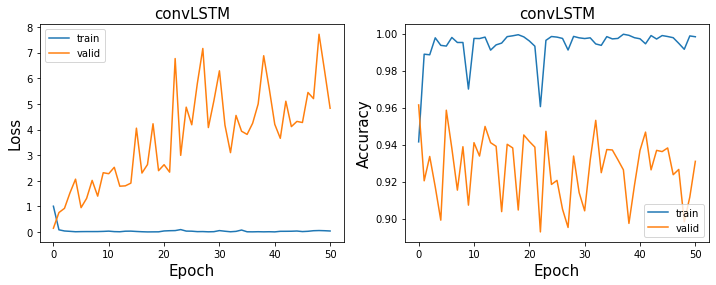

<ipython-input-88-894d578093d0>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  outputs = torch.tensor(outputs).to(device)


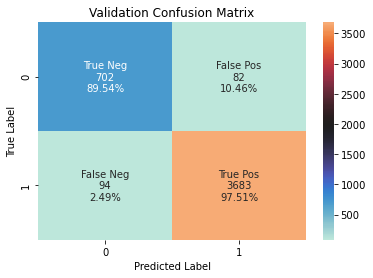

validation loss:0.1482890397310257 accuracy:0.9614119710589782 F1:0.9766640148501724


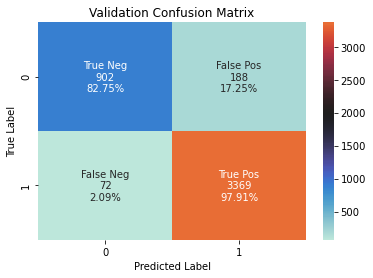

test loss:0.18822982907295227 accuracy:0.9426175237254469 F1:0.9628465275793083
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.3_HD10_EPOCH1.pt
best epoch training accuracy:  0.9573973663826492


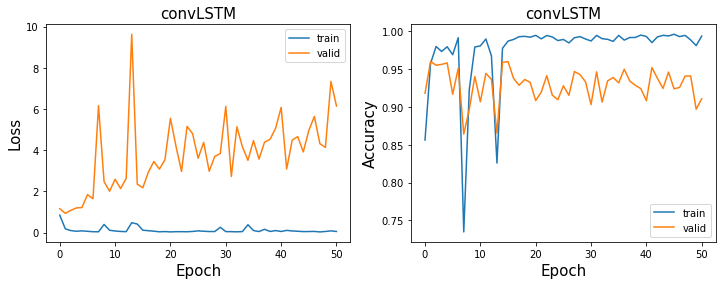

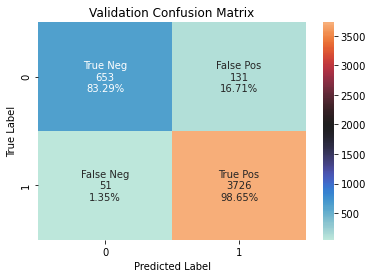

validation loss:0.9310176968574524 accuracy:0.9600964700723525 F1:0.9761592873984805


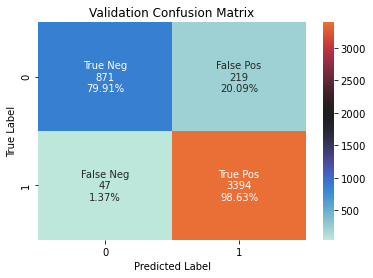

test loss:0.8276308178901672 accuracy:0.9412933127344957 F1:0.9622908987808335
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.5_HD10_EPOCH1.pt
best epoch training accuracy:  0.9211205783630261


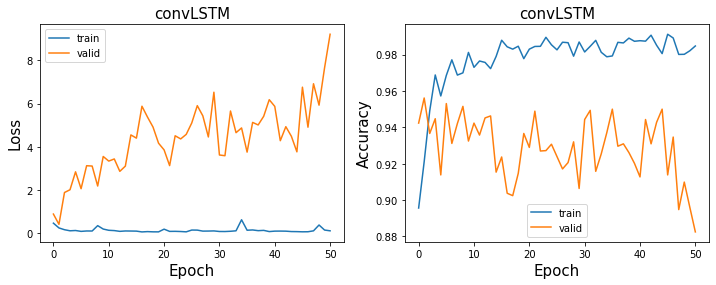

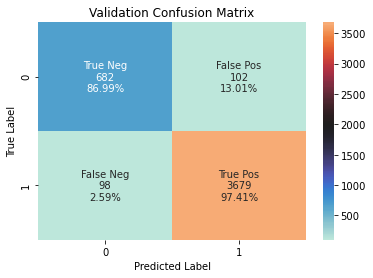

validation loss:0.4055192172527313 accuracy:0.9561499671124754 F1:0.9735379730087325


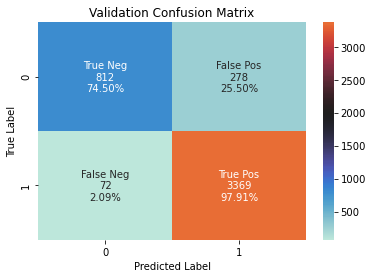

test loss:0.4329756796360016 accuracy:0.9227543588611785 F1:0.9506207674943566
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.1_HD15_EPOCH0.pt
best epoch training accuracy:  0.9380970823650917


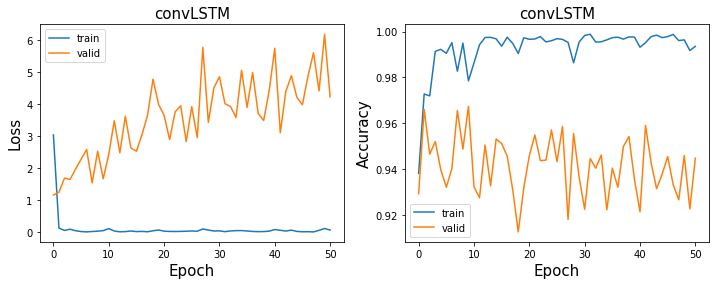

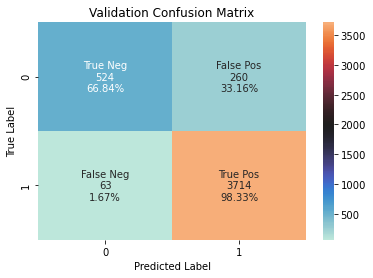

validation loss:1.1600887775421143 accuracy:0.9291821968866477 F1:0.9583279576828796


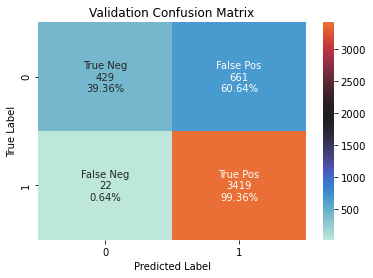

test loss:1.6082552671432495 accuracy:0.8492606488633856 F1:0.909187608030847
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.3_HD15_EPOCH1.pt
best epoch training accuracy:  0.9734701781564679


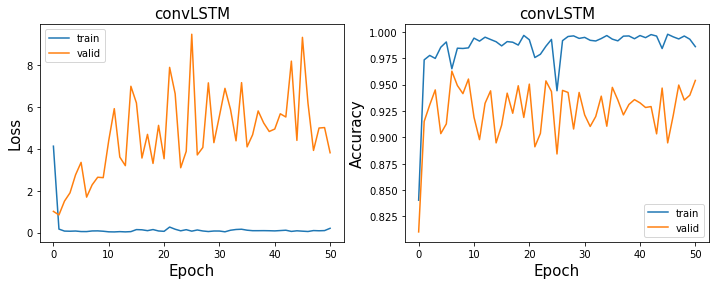

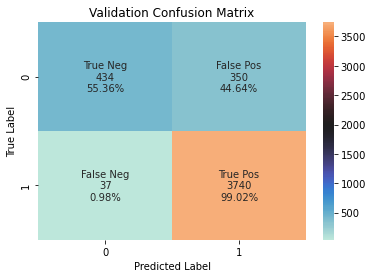

validation loss:0.8446467518806458 accuracy:0.9151501863626398 F1:0.9508071691877463


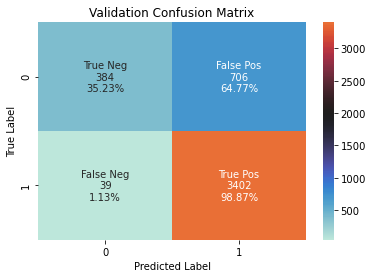

test loss:1.5778658390045166 accuracy:0.8355771352902229 F1:0.9013114319777454
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.5_HD15_EPOCH0.pt
best epoch training accuracy:  0.8998192615543507


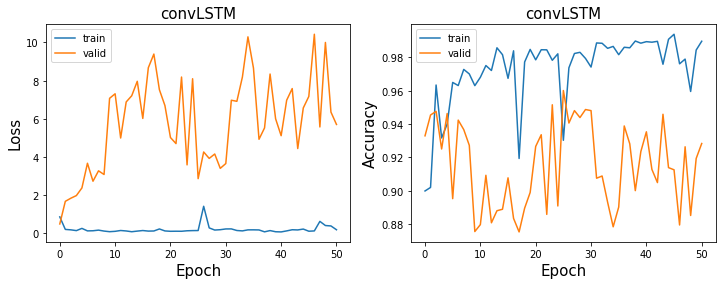

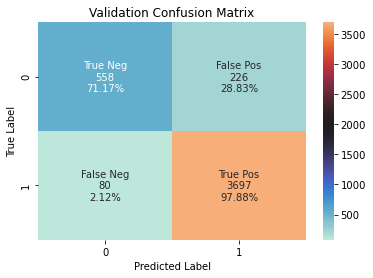

validation loss:0.49400588870048523 accuracy:0.9329094496820872 F1:0.9602597402597403


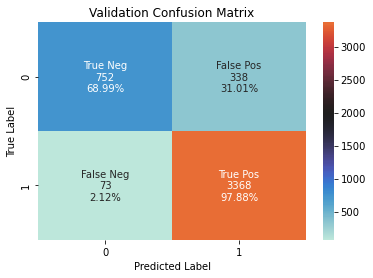

test loss:0.39784979820251465 accuracy:0.9092915471198411 F1:0.9424933538547642
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.1_HD48_EPOCH49.pt
best epoch training accuracy:  0.5


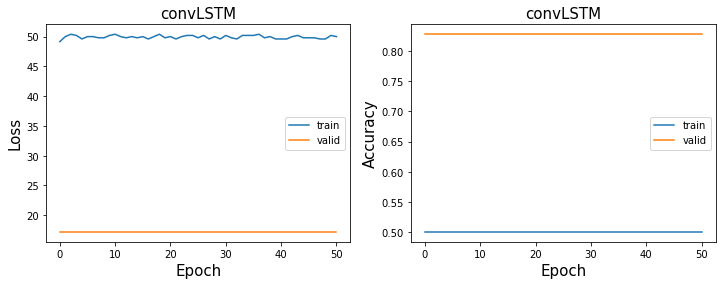

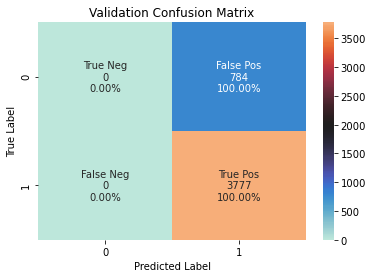

validation loss:17.240549087524414 accuracy:0.8281078710809033 F1:0.9059726553130247


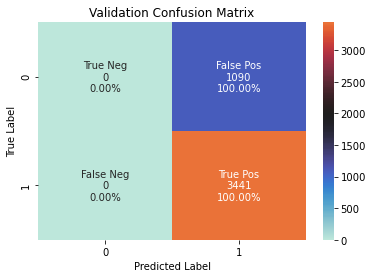

test loss:23.982162475585938 accuracy:0.7594350033105275 F1:0.8632714500752634
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.3_HD48_EPOCH31.pt
best epoch training accuracy:  0.9768912987348308


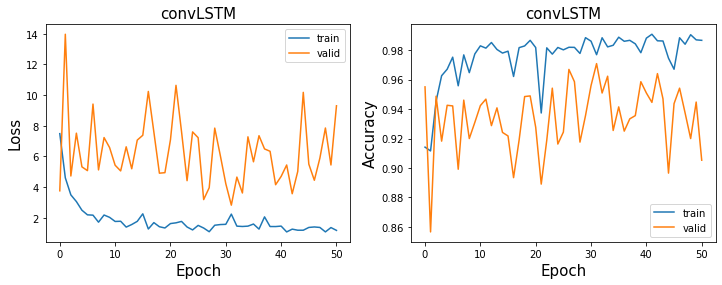

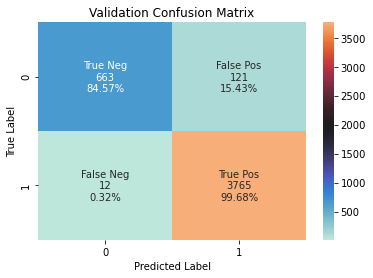

validation loss:2.7999215126037598 accuracy:0.9708397281297961 F1:0.9826438731567271


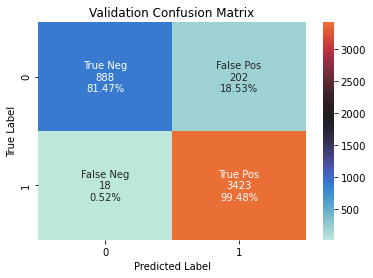

test loss:4.646190166473389 accuracy:0.9514455969984551 F1:0.9688649872629493
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.5_HD48_EPOCH15.pt
best epoch training accuracy:  0.9652078492124968


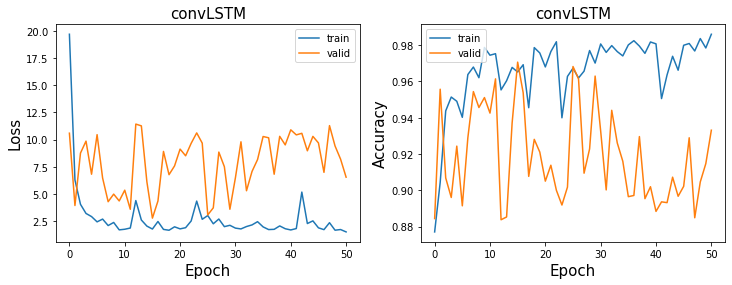

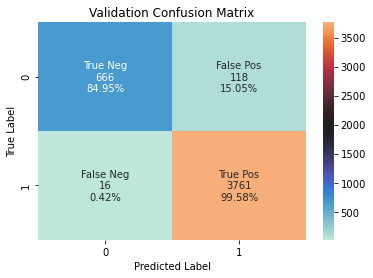

validation loss:2.751577854156494 accuracy:0.9706204779653584 F1:0.9824973876698014


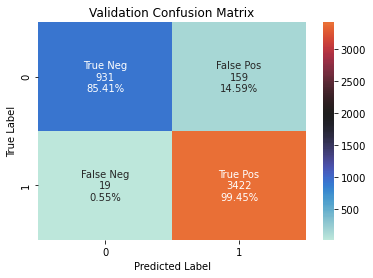

test loss:3.6611850261688232 accuracy:0.9607150739351137 F1:0.9746510965536884
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.1_HD56_EPOCH49.pt
best epoch training accuracy:  0.5


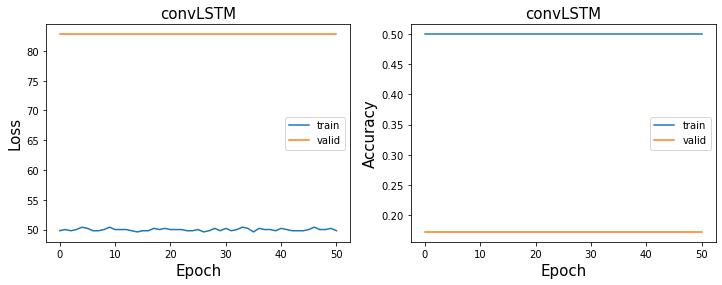

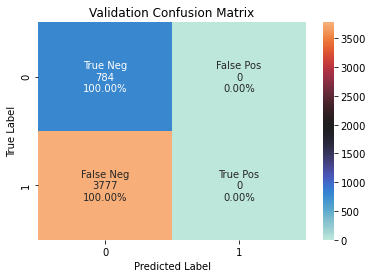

validation loss:82.75945281982422 accuracy:0.1718921289190967 F1:0.0


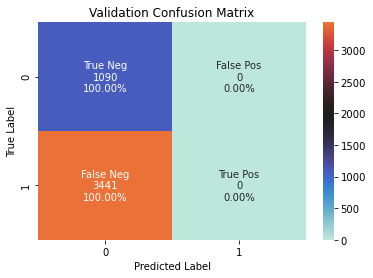

test loss:76.01783752441406 accuracy:0.2405649966894725 F1:0.0
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.3_HD56_EPOCH5.pt
best epoch training accuracy:  0.9494577846630519


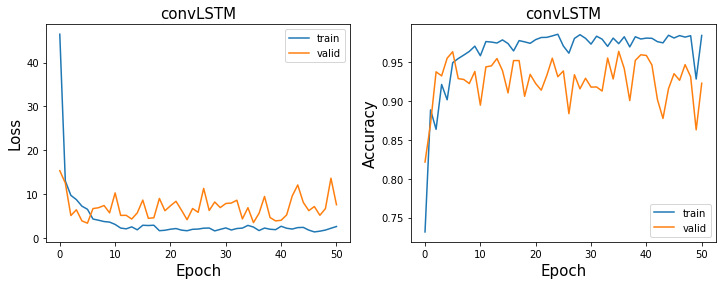

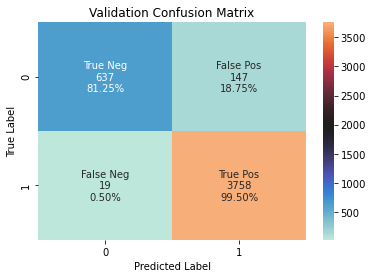

validation loss:3.4439337253570557 accuracy:0.9636044727033545 F1:0.9783910439989586


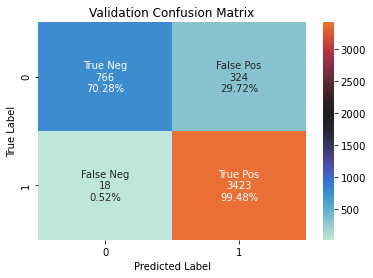

test loss:7.286566734313965 accuracy:0.9245199735157802 F1:0.9524207011686143
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.5_HD56_EPOCH24.pt
best epoch training accuracy:  0.9680480247869868


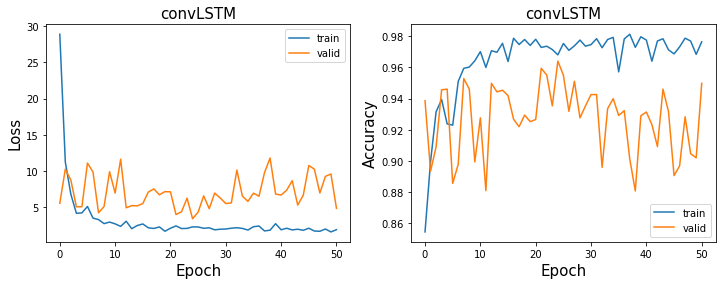

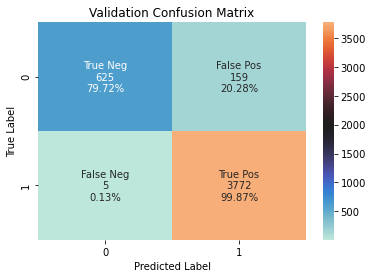

validation loss:3.406369924545288 accuracy:0.9640429730322297 F1:0.9787234042553191


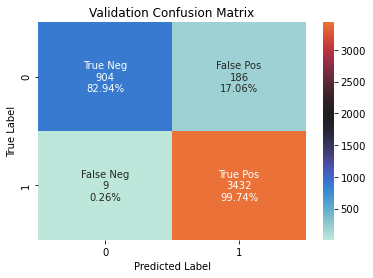

test loss:4.186097145080566 accuracy:0.9569631427940852 F1:0.9723756906077348


In [113]:
for i,(index,row) in enumerate(best_results.iterrows()):

    best_epoch = int(row)
    hidden = int(index[0])
    dropout = index[1]
    alpha = 0
    
    
    # load best model
    model = convLSTM(input_dim = 62, hidden_dim = hidden).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
    model.load_state_dict(torch.load('{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden,best_epoch)))
    
    print('{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, dropout, hidden,best_epoch))

    ## Plot training result
    plot_train_result_file(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden, best_epoch)

    ## Calculate validation accuracy and validation loss
    val_loss, val_acc, val_preds, val_F1, val_labels = evaluate(model, optimizer, criterion, val_loader, device='cuda', collect_result = True)
    print('validation loss:{} accuracy:{} F1:{}'.format(val_loss, val_acc, val_F1))
    
    ## Calculate test accuracy and test loss
    test_loss, test_acc, test_preds, test_F1, test_labels = evaluate(model, optimizer, criterion, test_loader, device='cuda', collect_result = True)
    print('test loss:{} accuracy:{} F1:{}'.format(test_loss, test_acc, test_F1))

    
#     ## Calculate validation accuracy and validation loss
#     val_loss, val_acc, val_preds, val_labels = evaluate(model, optimizer, criterion, val_loader, device='cuda', collect_result = True)
#     print('validation loss:{} accuracy:{}'.format(val_loss, val_acc))
    
#     ## Calculate test accuracy and test loss
#     test_loss, test_acc, test_preds, test_labels = evaluate(model, optimizer, criterion, test_loader, device='cuda', collect_result = True)
#     print('test loss:{} accuracy:{}'.format(test_loss, test_acc))
#     print(np.mean(np.concatenate(test_labels)))
    
#     ## Confusion matrix-validation
#     predictions_val = np.concatenate(val_preds)
#     labels_val = np.concatenate(val_labels)
    
#     val_cm_filename = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_valcm.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout,hidden)
#     print(val_cm_filename)
#     val_cm_result = {'predictions_val': predictions_val, 'labels_val' : labels_val}

#     pickle.dump( val_cm_result, open( val_cm_filename, "wb" ) )
    
    
#     df_val = pd.DataFrame({'predictions': predictions_val, 'labels': labels_val})

#     cm_val = confusion_matrix(labels_val, predictions_val)
#     ax = plt.axes()
#     group_names = ['True Neg','False Pos','False Neg','True Pos']
#     group_counts = ["{0:0.0f}".format(value) for value in
#                     cm_val.flatten()]

#     TNR = int(group_counts[0]) / (int(group_counts[0])+int(group_counts[1]))
#     FPR = 1 - TNR
#     TPR = int(group_counts[3]) / (int(group_counts[3])+int(group_counts[2]))
#     FNR = 1-TPR
#     group_percentages =[TNR, FPR, FNR, TPR]

#     group_percentages = ["{0:.2%}".format(value) for value in
#                          group_percentages]
#     labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
#               zip(group_names,group_counts,group_percentages)]
#     labels = np.asarray(labels).reshape(2,2)
#     sn.heatmap(cm_val, annot=labels, fmt='', center = 2000)
#     ax.set_title('Validation Confusion Matrix')
#     ax.set_xlabel('Predicted Label')
#     ax.set_ylabel('True Label')
#     plt.show()
    
#     ## Confusion matrix-test
#     predictions_test = np.concatenate(test_preds)
#     labels_test = np.concatenate(test_labels)

#     test_cm_filename = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_testcm.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout,hidden)
#     print(test_cm_filename)
#     test_cm_result = {'predictions_test': predictions_test, 'labels_val' : labels_test}

#     pickle.dump( test_cm_result, open( test_cm_filename, "wb" ) )

#     df_test = pd.DataFrame({'predictions': predictions_test, 'labels': labels_test})

#     cm_test = confusion_matrix(labels_test, predictions_test)
#     ax = plt.axes()
#     group_names = ['True Neg','False Pos','False Neg','True Pos']
#     group_counts = ["{0:0.0f}".format(value) for value in
#                     cm_test.flatten()]

#     TNR = int(group_counts[0]) / (int(group_counts[0])+int(group_counts[1]))
#     FPR = 1 - TNR
#     TPR = int(group_counts[3]) / (int(group_counts[3])+int(group_counts[2]))
#     FNR = 1-TPR
#     group_percentages =[TNR, FPR, FNR, TPR]

#     group_percentages = ["{0:.2%}".format(value) for value in
#                          group_percentages]
#     labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
#               zip(group_names,group_counts,group_percentages)]
#     labels = np.asarray(labels).reshape(2,2)
#     sn.heatmap(cm_test, annot=labels, fmt='', center = 2000)
#     ax.set_title('Test Confusion Matrix')
#     ax.set_xlabel('Predicted Label')
#     ax.set_ylabel('True Label')
#     plt.show()
    


## T-length = 10

In [114]:
time_window = 10
## Load files
move_files, sleep_files = create_files_new(load_path, bad_dates, T_length=3, proceed=1)
train_files, val_files, test_files = [], [], []

## Put files in val, test, and train
for f in move_files+sleep_files:
    if f:
        if f[0][1][3] in val_dates:
            val_files.extend(f)
        elif f[0][1][3] in test_dates:
            test_files.extend(f)
        else:
            train_files.extend(f)           

In [115]:
## Randomly shuffle inside train, val, and test
random.shuffle(train_files)
random.shuffle(val_files)
random.shuffle(test_files)

In [116]:
## Upsample train
train_files = upsample(train_files)

In [117]:
## Balance val 
sleep_files = []
move_files = []
for t in range(len(val_files)):
    if 'sleep' in val_files[t][0]:
        sleep_files.append(val_files[t])
    if 'move' in val_files[t][0]:
        move_files.append(val_files[t])

sleep_sample = sample(sleep_files, len(move_files))
val_2_files = sleep_sample+move_files

In [118]:
len(train_files), len(val_files), len(test_files)

(17266, 5248, 5199)

In [119]:
## Load files to dataloader
T_length = 10

# train_dataset = SpectrogramDatasetAtt(files=train_files, load_path=load_path, T_length=T_length, all_label=True)
valid_dataset_bal = SpectrogramDatasetAtt(files=val_2_files, load_path=load_path, T_length=T_length, all_label=True)
# test_dataset = SpectrogramDatasetAtt(files=test_files, load_path=load_path, T_length=T_length, all_label=True)

train_dataset = SpectrogramDatasetAtt(files=train_files, load_path=load_path, T_length=T_length, all_label=True)
valid_dataset = SpectrogramDatasetAtt(files=val_files, load_path=load_path, T_length=T_length, all_label=True)
test_dataset = SpectrogramDatasetAtt(files=test_files, load_path=load_path, T_length=T_length, all_label=True)

train_loader = DataLoader(dataset=train_dataset, batch_size=128, shuffle = True)
val_loader = DataLoader(dataset=valid_dataset, batch_size=128, shuffle = False)
test_loader = DataLoader(dataset=test_dataset, batch_size=128, shuffle = False)
val_loader_bal = DataLoader(dataset=valid_dataset_bal, batch_size=128, shuffle = False)

### Training

In [120]:
device = torch.device('cuda')

tol = 0.01
learning_rate = 0.01
num_epochs = 51
alpha = 0
model_type = 'convLSTM'
loss_type = 'bce'
reg_type = 'none'
alpha = 0
timewindow = 10
ch = 'all'
dropout = [0.1,0.3,0.5]
hidden_dim = [10,15,48,56]
T_length = 10



convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)


<ipython-input-14-894d578093d0>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  outputs = torch.tensor(outputs).to(device)


0
Train loss for epoch 0: 1.4346089363098145
Val loss for epoch 0: 0.9539974331855774
Train loss for epoch 1: 0.1903858482837677
Val loss for epoch 1: 2.769028425216675
Train loss for epoch 2: 0.10744813084602356
Val loss for epoch 2: 2.646392345428467
Train loss for epoch 3: 0.04293837770819664
Val loss for epoch 3: 3.174126386642456
Train loss for epoch 4: 0.05377131327986717
Val loss for epoch 4: 4.138644218444824
Train loss for epoch 5: 0.030844345688819885
Val loss for epoch 5: 4.8455352783203125
Train loss for epoch 6: 0.04080044478178024
Val loss for epoch 6: 4.634006500244141
Train loss for epoch 7: 0.03650057688355446
Val loss for epoch 7: 5.675363540649414
Train loss for epoch 8: 0.11572394520044327
Val loss for epoch 8: 7.865302085876465
Train loss for epoch 9: 0.06678764522075653
Val loss for epoch 9: 6.87512731552124
Train loss for epoch 10: 0.03624458611011505
Val loss for epoch 10: 7.351159572601318
Train loss for epoch 11: 0.026217391714453697
Val loss for epoch 11: 7.0

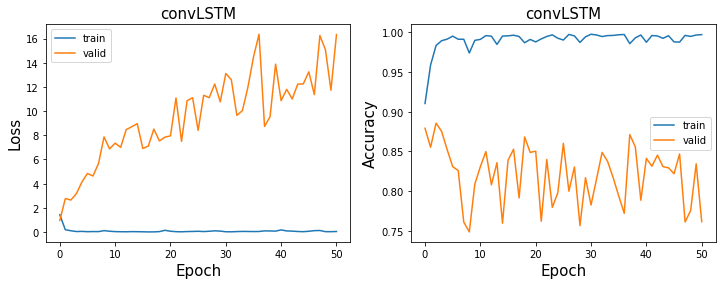

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.5772038698196411
Val loss for epoch 0: 2.237449884414673
Train loss for epoch 1: 0.17978353798389435
Val loss for epoch 1: 4.198849678039551
Train loss for epoch 2: 0.11945157498121262
Val loss for epoch 2: 4.810962200164795
Train loss for epoch 3: 0.11282654106616974
Val loss for epoch 3: 3.9092166423797607
Train loss for epoch 4: 0.114488884806633
Val loss for epoch 4: 4.825644493103027
Train loss for epoch 5: 0.08867380768060684
Val loss for epoch 5: 6.493776798248291
Train loss for epoch 6: 0.09135372191667557
Val loss for epoch 6: 7.937626361846924
Train loss for epoch 7: 0.11654172837734222
Val loss for epoch 7: 6.687884330749512
Train loss for epoch 8: 0.

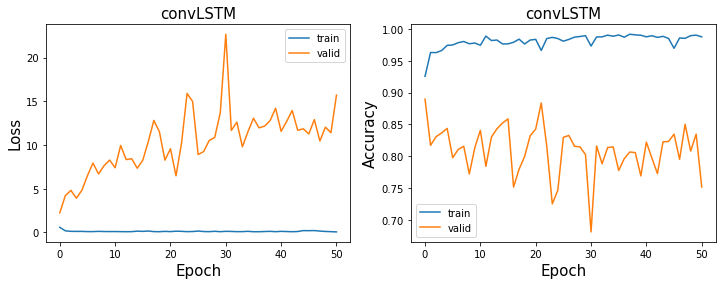

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.46422210335731506
Val loss for epoch 0: 1.341676950454712
Train loss for epoch 1: 0.2252780944108963
Val loss for epoch 1: 4.45499324798584
Train loss for epoch 2: 0.20678415894508362
Val loss for epoch 2: 5.205404281616211
Train loss for epoch 3: 0.1651049703359604
Val loss for epoch 3: 6.881609916687012
Train loss for epoch 4: 0.1587003767490387
Val loss for epoch 4: 10.218914985656738
Train loss for epoch 5: 0.13806860148906708
Val loss for epoch 5: 8.759634017944336
Train loss for epoch 6: 0.11320501565933228
Val loss for epoch 6: 9.46120834350586
Train loss for epoch 7: 0.10485510528087616
Val loss for epoch 7: 7.63971471786499
Train loss for epoch 8: 0.107

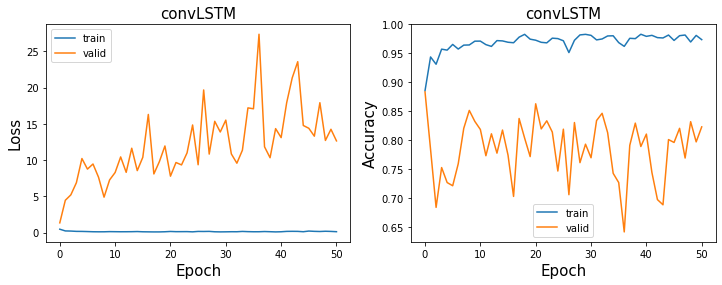

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.7, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.4621008336544037
Val loss for epoch 0: 2.4288885593414307
Train loss for epoch 1: 0.3248794674873352
Val loss for epoch 1: 4.935756683349609
Train loss for epoch 2: 0.2613101005554199
Val loss for epoch 2: 3.9681360721588135
Train loss for epoch 3: 0.218708336353302
Val loss for epoch 3: 5.425898551940918
Train loss for epoch 4: 0.20213501155376434
Val loss for epoch 4: 6.312778949737549
Train loss for epoch 5: 0.23544250428676605
Val loss for epoch 5: 9.949719429016113
Train loss for epoch 6: 0.1977795958518982
Val loss for epoch 6: 12.801386833190918
Train loss for epoch 7: 0.20362482964992523
Val loss for epoch 7: 9.323604583740234
Train loss for epoch 8: 0.2

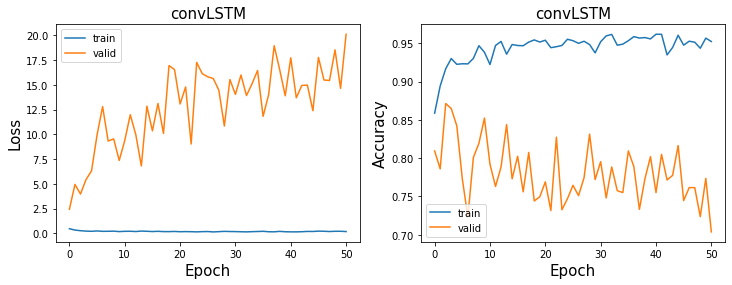

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.9, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.5464107990264893
Val loss for epoch 0: 2.881256103515625
1
Train loss for epoch 1: 0.49877431988716125
Val loss for epoch 1: 1.7447246313095093
Train loss for epoch 2: 0.450488805770874
Val loss for epoch 2: 4.877180099487305
Train loss for epoch 3: 0.4240734875202179
Val loss for epoch 3: 3.4287800788879395
Train loss for epoch 4: 0.4082486927509308
Val loss for epoch 4: 3.76552677154541
Train loss for epoch 5: 0.3837074935436249
Val loss for epoch 5: 5.504821300506592
Train loss for epoch 6: 0.3880307376384735
Val loss for epoch 6: 3.5045337677001953
Train loss for epoch 7: 0.3771546185016632
Val loss for epoch 7: 7.196810722351074
Train loss for epoch 8: 0.36

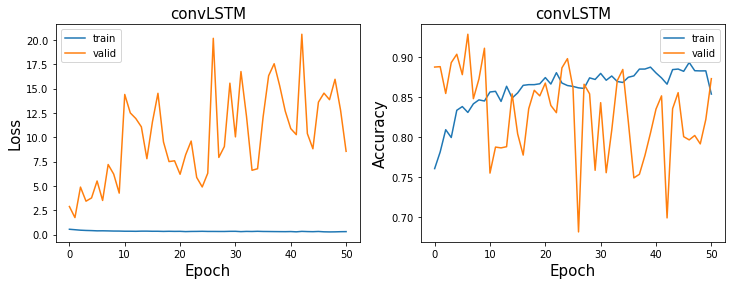

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 1.2349447011947632
Val loss for epoch 0: 0.7281534075737
Train loss for epoch 1: 0.11407148838043213
Val loss for epoch 1: 2.877748727798462
Train loss for epoch 2: 0.07069271057844162
Val loss for epoch 2: 2.515320062637329
Train loss for epoch 3: 0.04081212356686592
Val loss for epoch 3: 2.7801382541656494
Train loss for epoch 4: 0.03839327022433281
Val loss for epoch 4: 4.751755237579346
Train loss for epoch 5: 0.03252819925546646
Val loss for epoch 5: 4.850757598876953
Train loss for epoch 6: 0.031962305307388306
Val loss for epoch 6: 4.889583587646484
Train loss for epoch 7: 0.0419529527425766
Val loss for epoch 7: 5.249133110046387
Train loss for epoch 8: 0.

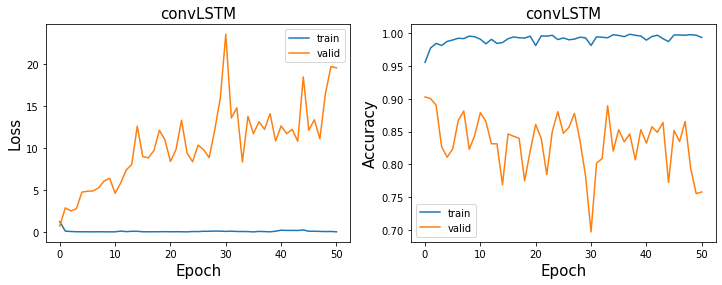

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.6480877995491028
Val loss for epoch 0: 1.5177370309829712
Train loss for epoch 1: 0.1792880743741989
Val loss for epoch 1: 4.978720664978027
Train loss for epoch 2: 0.17392520606517792
Val loss for epoch 2: 2.5207691192626953
Train loss for epoch 3: 0.13956692814826965
Val loss for epoch 3: 3.7218945026397705
Train loss for epoch 4: 0.0801064670085907
Val loss for epoch 4: 8.255953788757324
Train loss for epoch 5: 0.08006525039672852
Val loss for epoch 5: 6.769701957702637
Train loss for epoch 6: 0.08447180688381195
Val loss for epoch 6: 11.722628593444824
Train loss for epoch 7: 0.09531828761100769
Val loss for epoch 7: 7.789879322052002
Train loss for epoch 8:

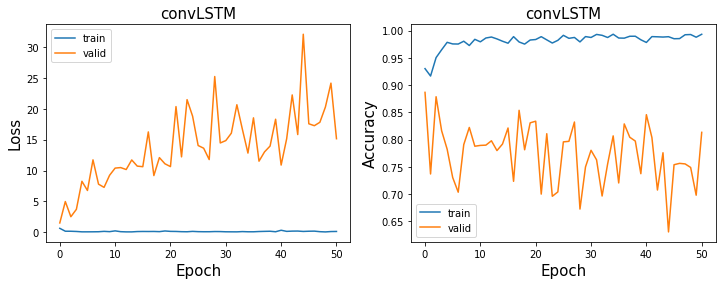

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.5238890647888184
Val loss for epoch 0: 1.3529906272888184
Train loss for epoch 1: 0.29901763796806335
Val loss for epoch 1: 4.175994396209717
Train loss for epoch 2: 0.23237508535385132
Val loss for epoch 2: 4.532291412353516
Train loss for epoch 3: 0.22808606922626495
Val loss for epoch 3: 4.456114768981934
Train loss for epoch 4: 0.22938698530197144
Val loss for epoch 4: 5.893514156341553
Train loss for epoch 5: 0.18401838839054108
Val loss for epoch 5: 6.192866325378418
Train loss for epoch 6: 0.15499044954776764
Val loss for epoch 6: 8.188677787780762
Train loss for epoch 7: 0.1841842532157898
Val loss for epoch 7: 8.33546257019043
Train loss for epoch 8: 0.

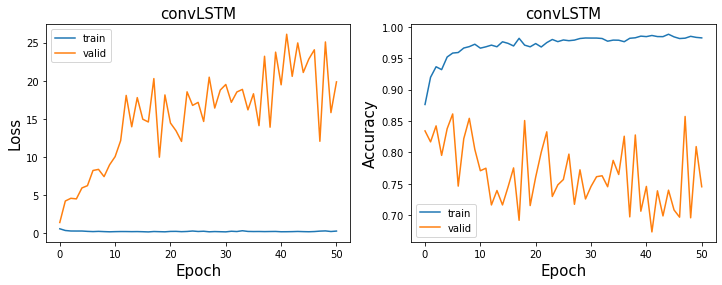

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.7, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.5280802249908447
Val loss for epoch 0: 3.0518672466278076
Train loss for epoch 1: 0.3049832582473755
Val loss for epoch 1: 3.1248819828033447
Train loss for epoch 2: 0.2793724834918976
Val loss for epoch 2: 6.246458530426025
Train loss for epoch 3: 0.2422572672367096
Val loss for epoch 3: 5.320127487182617
Train loss for epoch 4: 0.23415851593017578
Val loss for epoch 4: 7.145346641540527
Train loss for epoch 5: 0.2501589357852936
Val loss for epoch 5: 4.354788303375244
Train loss for epoch 6: 0.28861433267593384
Val loss for epoch 6: 7.194859504699707
Train loss for epoch 7: 0.23795868456363678
Val loss for epoch 7: 8.744234085083008
Train loss for epoch 8: 0.1

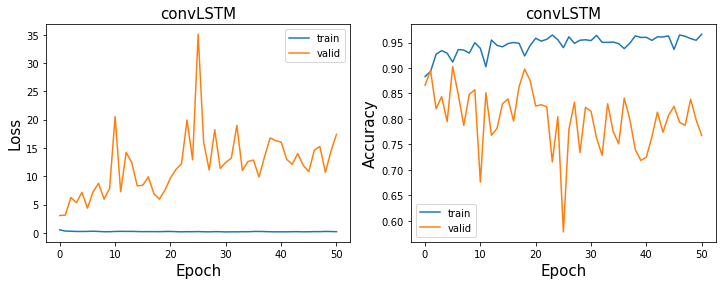

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.9, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.5378157496452332
Val loss for epoch 0: 4.072127342224121
Train loss for epoch 1: 0.4561094343662262
Val loss for epoch 1: 10.755128860473633
Train loss for epoch 2: 0.4287097454071045
Val loss for epoch 2: 4.303730487823486
Train loss for epoch 3: 0.4110468327999115
Val loss for epoch 3: 8.496042251586914
Train loss for epoch 4: 0.3946010172367096
Val loss for epoch 4: 5.773663520812988
Train loss for epoch 5: 0.38862136006355286
Val loss for epoch 5: 6.971471786499023
Train loss for epoch 6: 0.3844210207462311
Val loss for epoch 6: 6.394750595092773
Train loss for epoch 7: 0.39521658420562744
Val loss for epoch 7: 5.709468841552734
Train loss for epoch 8: 0.382

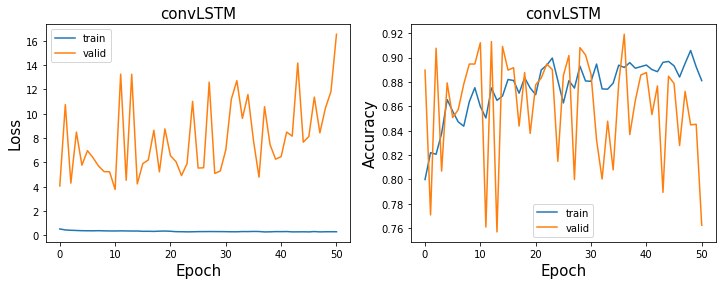

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 49.640968322753906
Val loss for epoch 0: 48.92578125
1
Train loss for epoch 1: 49.99573516845703
Val loss for epoch 1: 48.92578125
2
Train loss for epoch 2: 50.00141906738281
Val loss for epoch 2: 48.92578125
3
Train loss for epoch 3: 50.00141906738281
Val loss for epoch 3: 48.92578125
4
Train loss for epoch 4: 50.00568389892578
Val loss for epoch 4: 48.92578125
5
Train loss for epoch 5: 49.9964485168457
Val loss for epoch 5: 48.92578125
6
Train loss for epoch 6: 50.00141906738281
Val loss for epoch 6: 48.92578125
7
Train loss for epoch 7: 50.0
Val loss for epoch 7: 48.92578125
8
Train loss for epoch 8: 50.00212860107422
Val loss for epoch 8: 48.92578125
9
Train

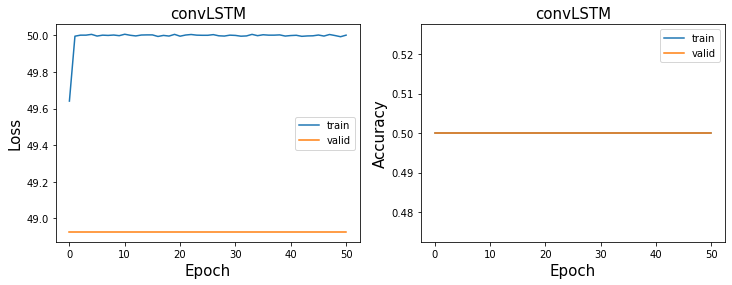

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 8.075974464416504
Val loss for epoch 0: 21.800004959106445
1
Train loss for epoch 1: 3.1503751277923584
Val loss for epoch 1: 7.747617244720459
2
Train loss for epoch 2: 2.08854603767395
Val loss for epoch 2: 7.652787208557129
Train loss for epoch 3: 1.869958519935608
Val loss for epoch 3: 9.875564575195312
Train loss for epoch 4: 1.763948678970337
Val loss for epoch 4: 17.694019317626953
Train loss for epoch 5: 2.145717144012451
Val loss for epoch 5: 18.97292709350586
Train loss for epoch 6: 1.8417824506759644
Val loss for epoch 6: 11.257411003112793
Train loss for epoch 7: 1.7028610706329346
Val loss for epoch 7: 22.340517044067383
Train loss for epoch 8: 1.53

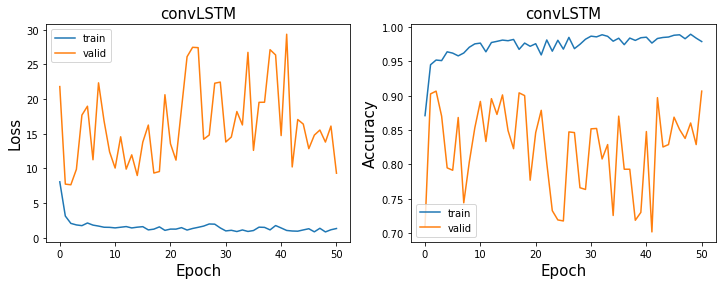

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 5.833428859710693
Val loss for epoch 0: 23.34543228149414
1
Train loss for epoch 1: 2.4786243438720703
Val loss for epoch 1: 21.37994956970215
Train loss for epoch 2: 1.4641436338424683
Val loss for epoch 2: 21.400014877319336
3
Train loss for epoch 3: 1.347581148147583
Val loss for epoch 3: 7.76521635055542
Train loss for epoch 4: 1.4918010234832764
Val loss for epoch 4: 15.191971778869629
Train loss for epoch 5: 1.5924885272979736
Val loss for epoch 5: 18.324813842773438
Train loss for epoch 6: 1.234419822692871
Val loss for epoch 6: 16.639150619506836
Train loss for epoch 7: 1.409160852432251
Val loss for epoch 7: 10.450835227966309
Train loss for epoch 8: 1.

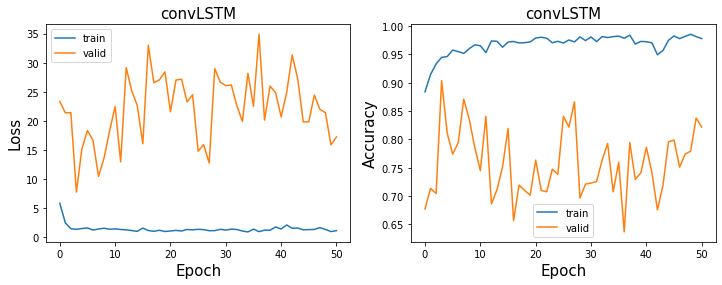

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.7, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 2.8221898078918457
Val loss for epoch 0: 7.503107070922852
Train loss for epoch 1: 0.8361517786979675
Val loss for epoch 1: 11.785902976989746
Train loss for epoch 2: 0.6920623779296875
Val loss for epoch 2: 19.546945571899414
Train loss for epoch 3: 0.7445685863494873
Val loss for epoch 3: 23.212379455566406
Train loss for epoch 4: 0.7262762784957886
Val loss for epoch 4: 11.758078575134277
Train loss for epoch 5: 0.6301542520523071
Val loss for epoch 5: 13.558460235595703
Train loss for epoch 6: 0.6188926100730896
Val loss for epoch 6: 17.347637176513672
Train loss for epoch 7: 0.6715987920761108
Val loss for epoch 7: 10.3975248336792
Train loss for epoch 8: 0

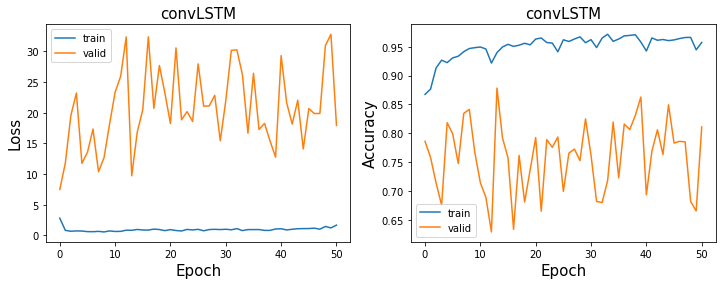

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.9, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.7671459913253784
Val loss for epoch 0: 4.000280380249023
1
Train loss for epoch 1: 0.6442819833755493
Val loss for epoch 1: 2.712000846862793
Train loss for epoch 2: 0.5929150581359863
Val loss for epoch 2: 2.7820615768432617
Train loss for epoch 3: 0.5222717523574829
Val loss for epoch 3: 6.708677291870117
Train loss for epoch 4: 0.5596842765808105
Val loss for epoch 4: 7.673722743988037
Train loss for epoch 5: 0.5252184271812439
Val loss for epoch 5: 6.110355854034424
Train loss for epoch 6: 0.47565504908561707
Val loss for epoch 6: 4.710415363311768
Train loss for epoch 7: 0.5607511401176453
Val loss for epoch 7: 5.966643333435059
Train loss for epoch 8: 0.

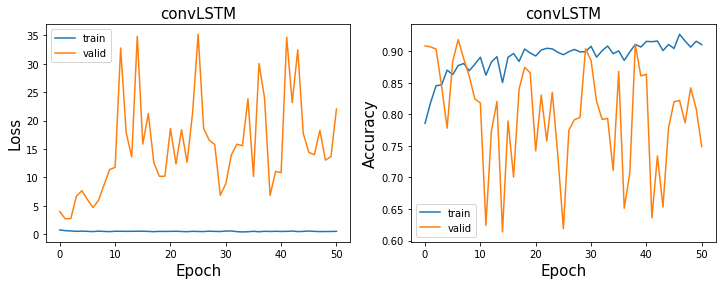

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 11.170653343200684
Val loss for epoch 0: 22.559886932373047
1
Train loss for epoch 1: 8.705160140991211
Val loss for epoch 1: 10.835417747497559
2
Train loss for epoch 2: 6.569531440734863
Val loss for epoch 2: 7.6291704177856445
Train loss for epoch 3: 5.18778657913208
Val loss for epoch 3: 17.827411651611328
Train loss for epoch 4: 5.060539722442627
Val loss for epoch 4: 10.83652114868164
Train loss for epoch 5: 4.001845836639404
Val loss for epoch 5: 12.458381652832031
Train loss for epoch 6: 4.112992286682129
Val loss for epoch 6: 24.101865768432617
Train loss for epoch 7: 4.4920172691345215
Val loss for epoch 7: 16.773269653320312
Train loss for epoch 8: 3.

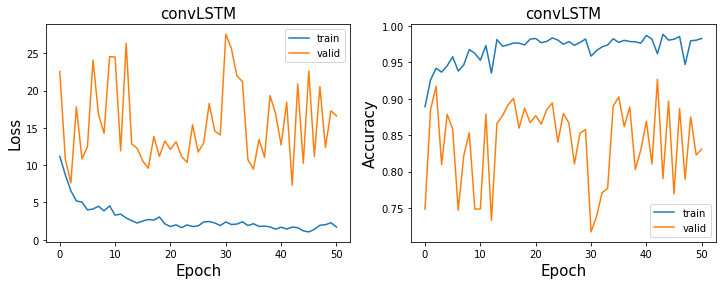

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 33.27708435058594
Val loss for epoch 0: 14.926773071289062
Train loss for epoch 1: 11.648216247558594
Val loss for epoch 1: 35.22268295288086
Train loss for epoch 2: 8.83329963684082
Val loss for epoch 2: 19.46830940246582
Train loss for epoch 3: 6.415477752685547
Val loss for epoch 3: 27.939800262451172
Train loss for epoch 4: 7.249359130859375
Val loss for epoch 4: 26.68541145324707
5
Train loss for epoch 5: 6.945443630218506
Val loss for epoch 5: 13.820100784301758
6
Train loss for epoch 6: 6.243640899658203
Val loss for epoch 6: 9.074313163757324
Train loss for epoch 7: 7.133883953094482
Val loss for epoch 7: 12.189536094665527
8
Train loss for epoch 8: 4.98

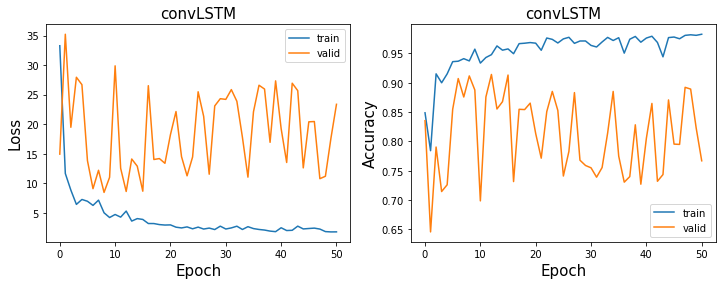

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 7.16613245010376
Val loss for epoch 0: 6.854198932647705
Train loss for epoch 1: 3.564951181411743
Val loss for epoch 1: 16.747547149658203
Train loss for epoch 2: 2.81782603263855
Val loss for epoch 2: 13.062620162963867
Train loss for epoch 3: 2.4421815872192383
Val loss for epoch 3: 15.371246337890625
Train loss for epoch 4: 2.8244259357452393
Val loss for epoch 4: 9.637240409851074
Train loss for epoch 5: 2.7903802394866943
Val loss for epoch 5: 14.35051155090332
Train loss for epoch 6: 2.425555944442749
Val loss for epoch 6: 11.80842399597168
Train loss for epoch 7: 3.0087339878082275
Val loss for epoch 7: 23.07512092590332
Train loss for epoch 8: 2.4063718

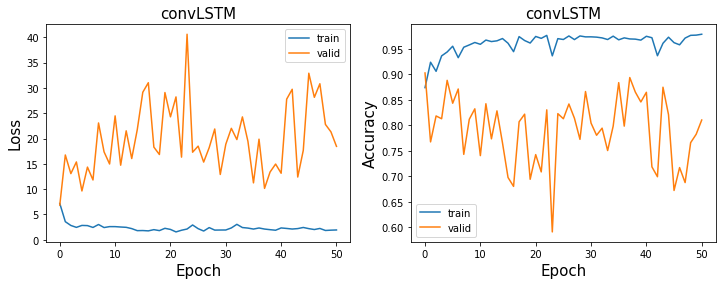

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.7, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 2.4695684909820557
Val loss for epoch 0: 13.613237380981445
1
Train loss for epoch 1: 0.9312874674797058
Val loss for epoch 1: 9.238256454467773
Train loss for epoch 2: 0.9796247482299805
Val loss for epoch 2: 12.455239295959473
Train loss for epoch 3: 0.8123079538345337
Val loss for epoch 3: 16.797269821166992
Train loss for epoch 4: 1.0043646097183228
Val loss for epoch 4: 32.13471221923828
Train loss for epoch 5: 0.9210039973258972
Val loss for epoch 5: 24.637489318847656
Train loss for epoch 6: 0.8775835037231445
Val loss for epoch 6: 25.960079193115234
Train loss for epoch 7: 0.9678722023963928
Val loss for epoch 7: 23.25725555419922
Train loss for epoch 8:

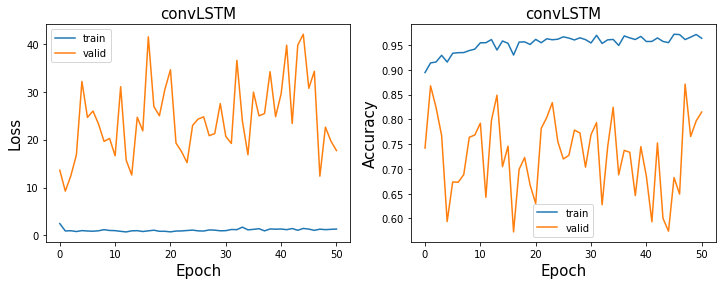

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.9, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.8669624328613281
Val loss for epoch 0: 4.555387496948242
1
Train loss for epoch 1: 0.7569406032562256
Val loss for epoch 1: 3.903001070022583
Train loss for epoch 2: 0.7218959927558899
Val loss for epoch 2: 7.11163330078125
Train loss for epoch 3: 0.643785834312439
Val loss for epoch 3: 7.106944561004639
Train loss for epoch 4: 0.6560308337211609
Val loss for epoch 4: 14.117908477783203
Train loss for epoch 5: 0.6050558686256409
Val loss for epoch 5: 27.080982208251953
Train loss for epoch 6: 0.6528857946395874
Val loss for epoch 6: 8.990275382995605
Train loss for epoch 7: 0.576116681098938
Val loss for epoch 7: 10.868304252624512
Train loss for epoch 8: 0.59

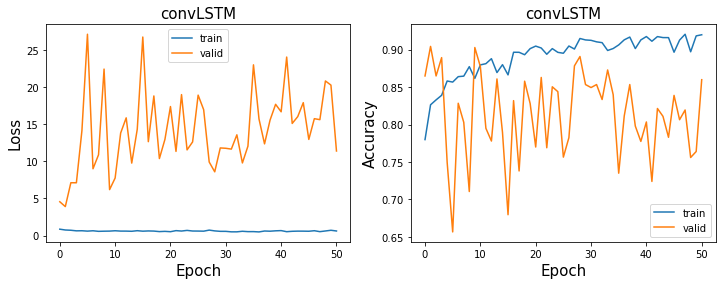

In [50]:
for i in hidden_dim:
    for d in dropout:
        model = convLSTM(input_dim = 62, hidden_dim = i, dropout = d).to(device)
        print(model)
        optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
        criterion = nn.BCELoss() # BCE loss
        train_losses, train_accs, val_losses, val_accs, parameter_history = [], [], [], [],[]

        for epoch in range(num_epochs):
            train_loss, train_acc, parameter_history = train(model, optimizer, criterion, train_loader,  device='cuda')
            val_loss, val_acc = evaluate(model, optimizer, criterion, val_loader, device='cuda')
            train_losses.append(train_loss)
            train_accs.append(train_acc)
            val_losses.append(val_loss)
            val_accs.append(val_acc)
            if epoch == 0:
                torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}_balanced.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch))
            if val_loss <= min(val_losses):
                best_epoch = epoch
                print(epoch)
                print('Train loss for epoch {}: {}'.format(epoch, train_loss))
                print('Val loss for epoch {}: {}'.format(epoch, val_loss))
                torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}_balanced.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length,d, i,epoch))
        #     elif verbose:
            else:
                print('Train loss for epoch {}: {}'.format(epoch, train_loss))
                print('Val loss for epoch {}: {}'.format(epoch, val_loss))

        #     if epoch == num_epochs-1:
        #         torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_EPOCH{}.pt'.format(model_saving_path, model_type, CH, loss_type, reg_type, alpha, timewindow, epoch))
        train_result_filename =  '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}_balanced_trainresult.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch)
        train_result = {'model_type': model_type, 'train_losses' : train_losses, 'val_losses' : val_losses, 'train_accs': train_accs, 'val_accs': val_accs}
        pickle.dump( train_result, open( train_result_filename, "wb" ) )
        plot_loss_acc(train_losses, val_losses, train_accs, val_accs, model_type)

### Balanced Result

In [121]:
results = []
for h in hidden_dim:
    for d in dropout:
        model_convLSTM = os.listdir(model_saving_path)

        best_result = 0
        reg_alpha = 'REG'+reg_type+str(alpha)+'_'
        dropout_type = 'DO'+str(d)
        hidden_type = 'HD'+str(h)
        t_len = 'TLEN'+str(T_length)
        for i, s in enumerate(model_convLSTM):
            if 'convLSTM_CHall_' in s and reg_alpha in s and dropout_type in s and 'trainresult' not in s and hidden_type in s and t_len in s and 'valcm' not in s and 'testcm' not in s and 'balanced' in s:
                model_name = model_convLSTM[i].split('_')
                epoch_name = [ind for ind,item in enumerate(np.array(model_name)) if "EPOCH" in item]
                res = [int(i) for i in model_name[epoch_name[0]] if i.isdigit()]
                if len(res) > 1:
                    epoch_result = res[0]*10+res[1]
                else:
                    epoch_result = res[0]
                if epoch_result>best_result and epoch_result != 50:
                    best_result = epoch_result

        results.append([h,d,best_result])

results = pd.DataFrame(np.array(results), columns=['hidden','dropout', 'epoch'])
best_results = results.groupby(['hidden','dropout']).max('epoch')
print(best_results)


                epoch
hidden dropout       
10.0   0.1        0.0
       0.3        0.0
       0.5        0.0
15.0   0.1        0.0
       0.3        0.0
       0.5        0.0
48.0   0.1       49.0
       0.3        2.0
       0.5        3.0
56.0   0.1       42.0
       0.3        8.0
       0.5        0.0


In [122]:
def plot_train_result_file(model_saving_path, model_type, num_channel, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden, best_epoch):
    fb = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH50_balanced_trainresult.pt'.format(model_saving_path, model_type, num_channel, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden)
    file = open(fb,'rb')
    train_result = pickle.load(file)
    train_losses = train_result['train_losses']
    val_losses = train_result['val_losses']
    train_accs = train_result['train_accs']
    val_accs = train_result['val_accs']
    model_type = train_result['model_type']
    print('best epoch training accuracy: ', train_accs[best_epoch])
    plot_loss_acc(train_losses, val_losses, train_accs, val_accs, model_type)
    

/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD10_EPOCH0_balanced.pt
best epoch training accuracy:  0.9104598633151859


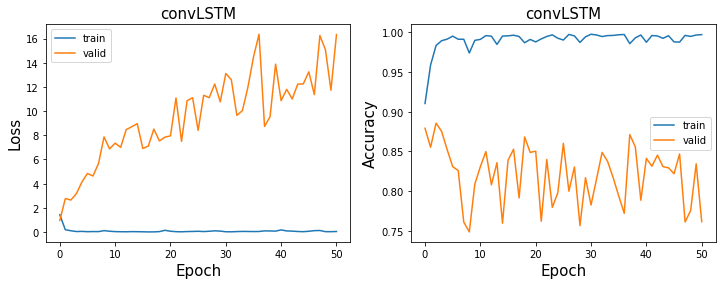

<ipython-input-88-894d578093d0>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  outputs = torch.tensor(outputs).to(device)


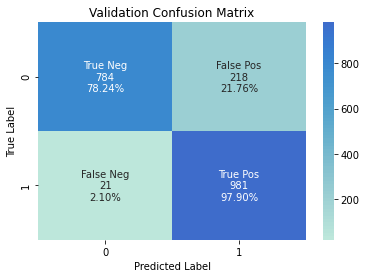

validation loss:0.9619030952453613 accuracy:0.8807385229540918 F1:0.8914129940935939


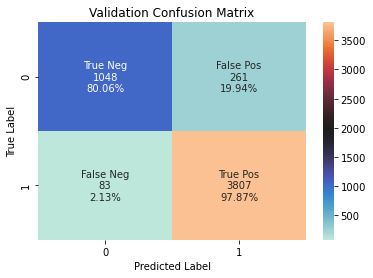

test loss:0.29872459173202515 accuracy:0.9338334295056742 F1:0.9567730585574264
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD10_EPOCH0_balanced.pt
best epoch training accuracy:  0.9254025251940229


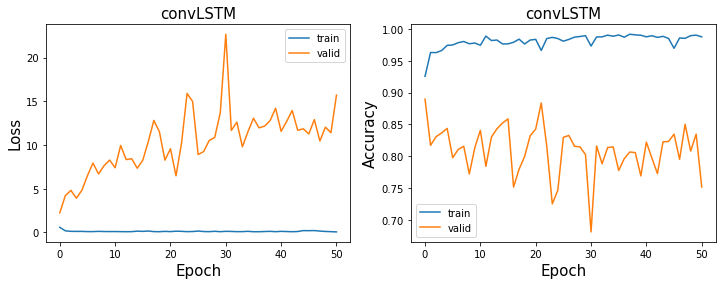

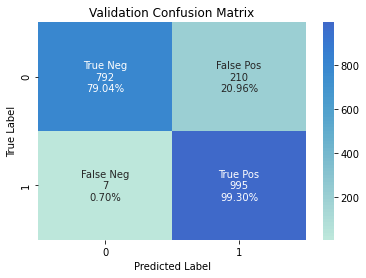

validation loss:2.2716832160949707 accuracy:0.8917165668662674 F1:0.9016764839148165


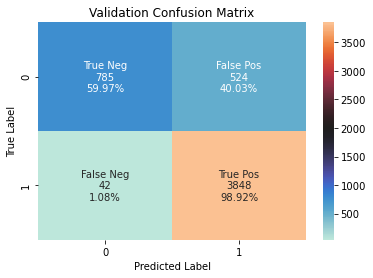

test loss:0.628545343875885 accuracy:0.8911329101750337 F1:0.9314935850883563
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD10_EPOCH0_balanced.pt
best epoch training accuracy:  0.8853816749681455


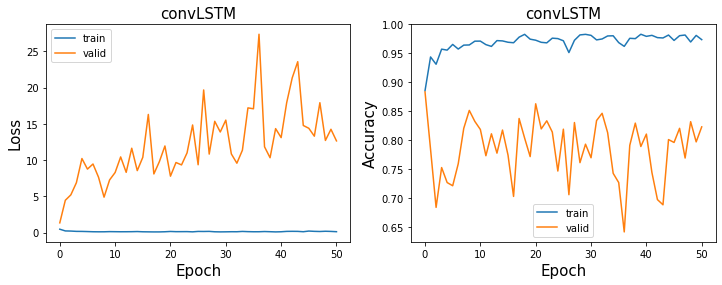

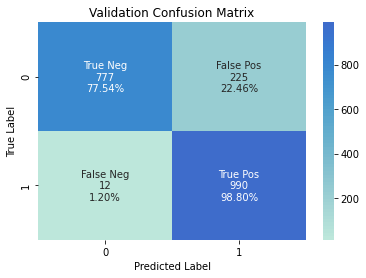

validation loss:1.3517704010009766 accuracy:0.8817365269461078 F1:0.8930987821380244


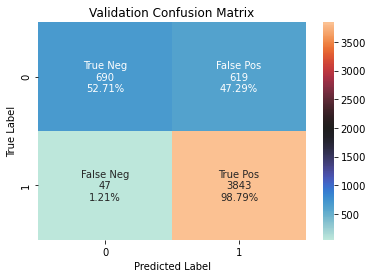

test loss:0.6142886281013489 accuracy:0.8718984420080784 F1:0.9202586206896551
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD15_EPOCH0_balanced.pt
best epoch training accuracy:  0.9552878489516969


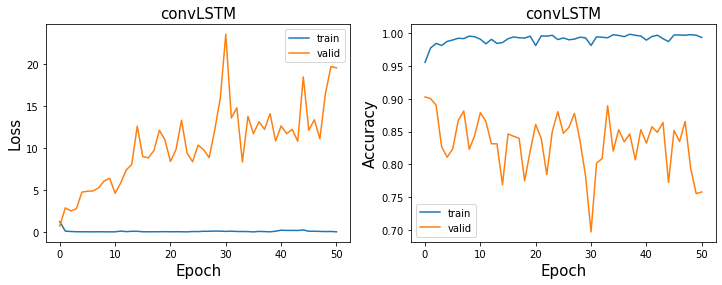

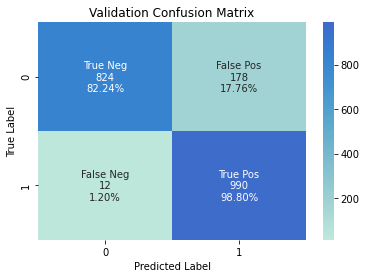

validation loss:0.7255857586860657 accuracy:0.9051896207584831 F1:0.9124423963133641


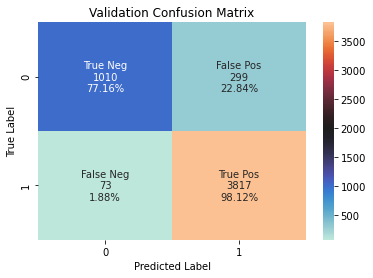

test loss:0.2784371078014374 accuracy:0.9284477784189267 F1:0.9535348488633525
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD15_EPOCH0_balanced.pt
best epoch training accuracy:  0.9302675778987606


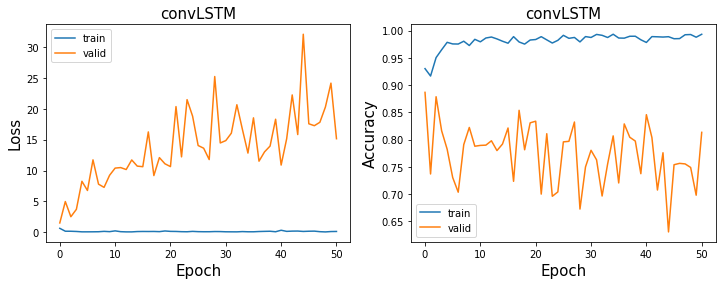

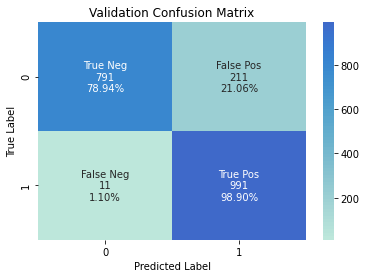

validation loss:1.5499310493469238 accuracy:0.8892215568862275 F1:0.8992740471869328


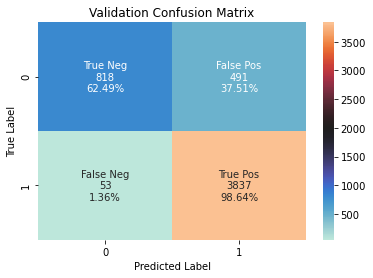

test loss:0.7623058557510376 accuracy:0.8953644931717638 F1:0.9338038452178146
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD15_EPOCH0_balanced.pt
best epoch training accuracy:  0.8763465770879184


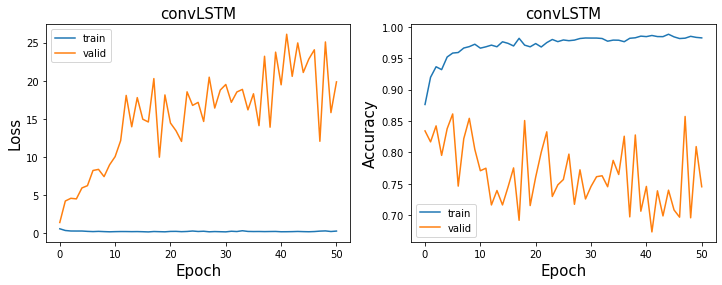

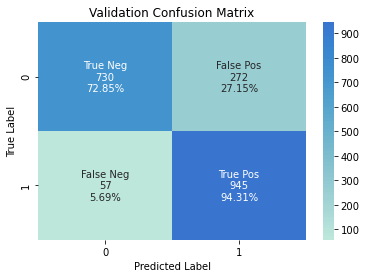

validation loss:1.3558988571166992 accuracy:0.8358283433133733 F1:0.8517350157728707


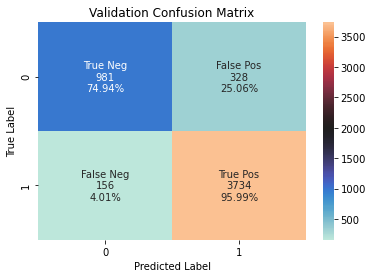

test loss:0.5718274116516113 accuracy:0.9069051740719369 F1:0.9391348088531187
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD48_EPOCH49_balanced.pt
best epoch training accuracy:  0.5


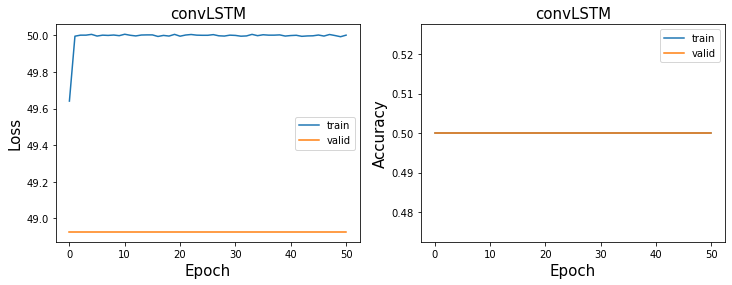

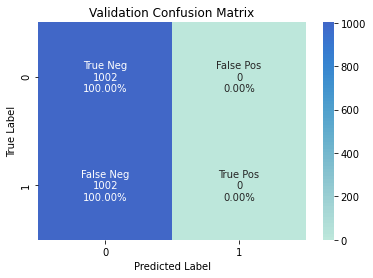

validation loss:48.92578125 accuracy:0.5 F1:0.0


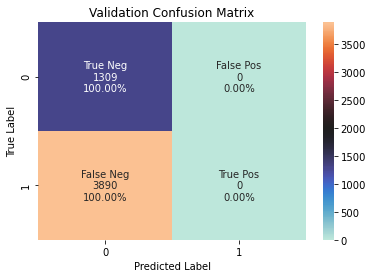

test loss:74.83260345458984 accuracy:0.2517791883054434 F1:0.0
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD48_EPOCH2_balanced.pt
best epoch training accuracy:  0.9519865631877679


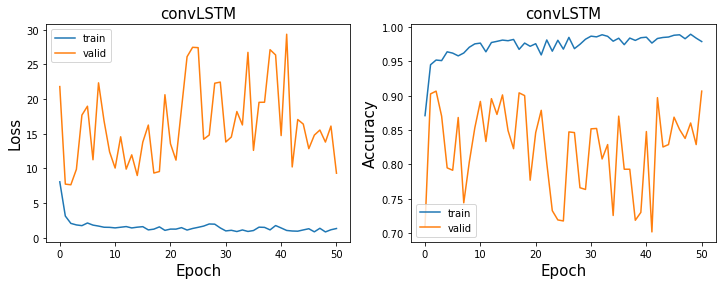

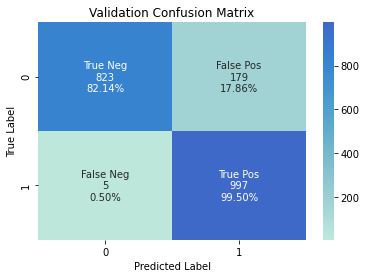

validation loss:7.752569198608398 accuracy:0.908183632734531 F1:0.9155188246097337


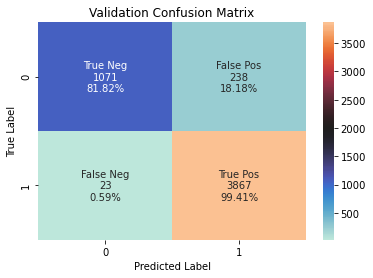

test loss:3.22316312789917 accuracy:0.949798038084247 F1:0.9673545966228893
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD48_EPOCH3_balanced.pt
best epoch training accuracy:  0.9449785706011815


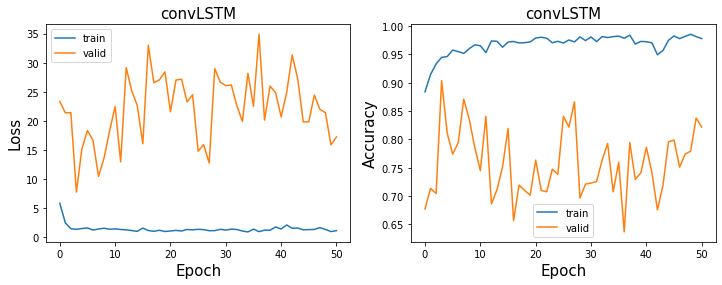

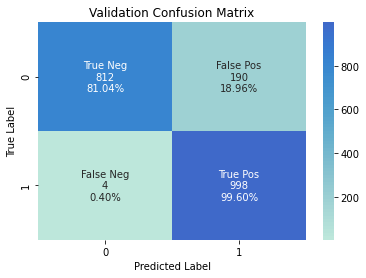

validation loss:8.009164810180664 accuracy:0.9031936127744511 F1:0.9114155251141552


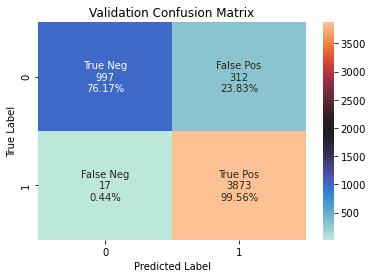

test loss:4.73482084274292 accuracy:0.9367185997307175 F1:0.9592569659442725
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD56_EPOCH42_balanced.pt
best epoch training accuracy:  0.9619483377736592


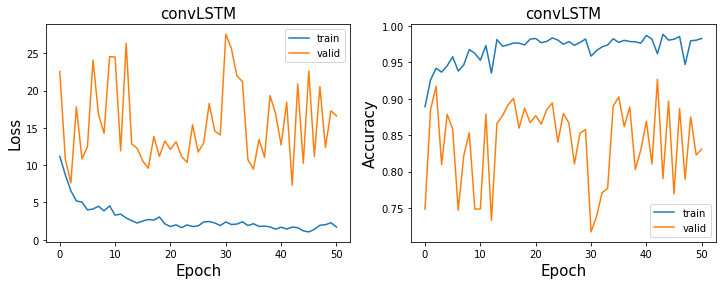

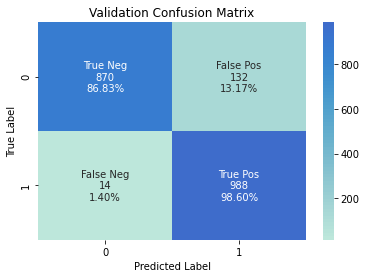

validation loss:7.295480728149414 accuracy:0.9271457085828343 F1:0.9311969839773798


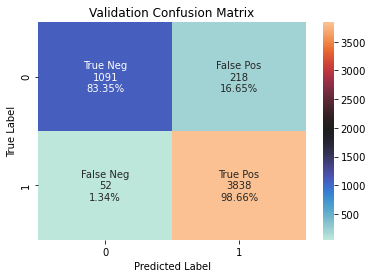

test loss:4.725142478942871 accuracy:0.948066935949221 F1:0.9660206393153788
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD56_EPOCH8_balanced.pt
best epoch training accuracy:  0.9372755704853469


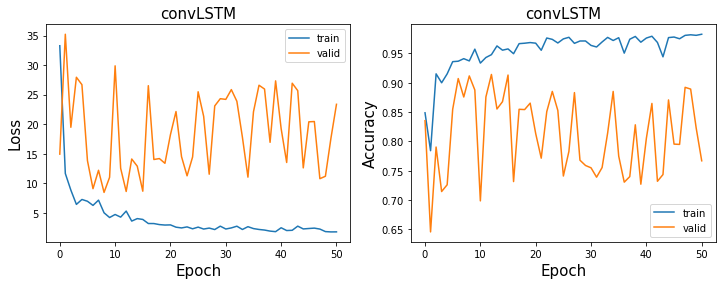

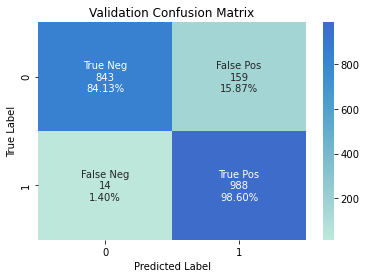

validation loss:8.364018440246582 accuracy:0.9136726546906188 F1:0.9194974406700791


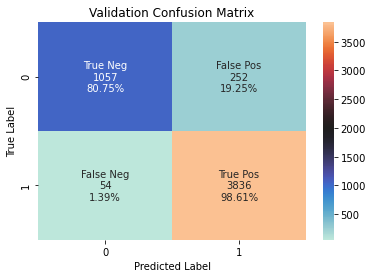

test loss:5.250781536102295 accuracy:0.9411425274091172 F1:0.961644522436701
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD56_EPOCH0_balanced.pt
best epoch training accuracy:  0.8739140507355496


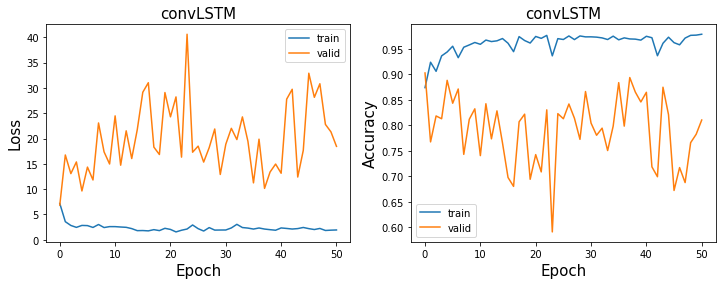

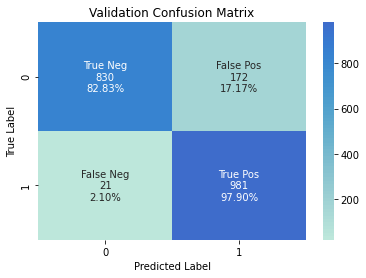

validation loss:6.940577983856201 accuracy:0.903692614770459 F1:0.9104408352668213


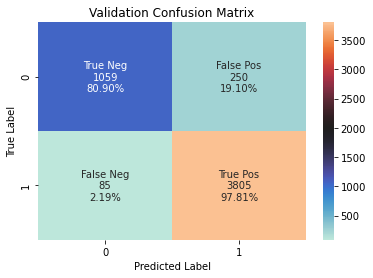

test loss:3.811429977416992 accuracy:0.9355645316407001 F1:0.9578351164254248


In [123]:
for i,(index,row) in enumerate(best_results.iterrows()):

    best_epoch = int(row)
    hidden = int(index[0])
    dropout = index[1]
    alpha = 0
    
    
    # load best model
    model = convLSTM(input_dim = 62, hidden_dim = hidden).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
    model.load_state_dict(torch.load('{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}_balanced.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden,best_epoch)))
    
    print('{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}_balanced.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, dropout, hidden,best_epoch))

    ## Print train accuracy
    plot_train_result_file(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden, best_epoch)

    ## Calculate validation accuracy and validation loss
    val_loss, val_acc, val_preds, val_F1, val_labels = evaluate(model, optimizer, criterion, val_loader_bal, device='cuda', collect_result = True)
    print('validation loss:{} accuracy:{} F1:{}'.format(val_loss, val_acc, val_F1))
    
    ## Calculate test accuracy and test loss
    test_loss, test_acc, test_preds, test_F1, test_labels = evaluate(model, optimizer, criterion, test_loader, device='cuda', collect_result = True)
    print('test loss:{} accuracy:{} F1:{}'.format(test_loss, test_acc, test_F1))
    
    
#     ## Calculate validation accuracy and validation loss
#     val_loss, val_acc, val_preds, val_labels = evaluate(model, optimizer, criterion, val_loader, device='cuda', collect_result = True)
#     print('validation loss:{} accuracy:{}'.format(val_loss, val_acc))
    
#     ## Calculate test accuracy and test loss
#     test_loss, test_acc, test_preds, test_labels = evaluate(model, optimizer, criterion, test_loader, device='cuda', collect_result = True)
#     print('test loss:{} accuracy:{}'.format(test_loss, test_acc))
#     print(np.mean(np.concatenate(test_labels)))
    
#     ## Confusion matrix-validation
#     predictions_val = np.concatenate(val_preds)
#     labels_val = np.concatenate(val_labels)
    
#     val_cm_filename = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_balanced_valcm.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout,hidden)
#     print(val_cm_filename)
#     val_cm_result = {'predictions_val': predictions_val, 'labels_val' : labels_val}

#     pickle.dump( val_cm_result, open( val_cm_filename, "wb" ) )
    
    
#     df_val = pd.DataFrame({'predictions': predictions_val, 'labels': labels_val})

#     cm_val = confusion_matrix(labels_val, predictions_val)
#     ax = plt.axes()
#     group_names = ['True Neg','False Pos','False Neg','True Pos']
#     group_counts = ["{0:0.0f}".format(value) for value in
#                     cm_val.flatten()]

#     TNR = int(group_counts[0]) / (int(group_counts[0])+int(group_counts[1]))
#     FPR = 1 - TNR
#     TPR = int(group_counts[3]) / (int(group_counts[3])+int(group_counts[2]))
#     FNR = 1-TPR
#     group_percentages =[TNR, FPR, FNR, TPR]

#     group_percentages = ["{0:.2%}".format(value) for value in
#                          group_percentages]
#     labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
#               zip(group_names,group_counts,group_percentages)]
#     labels = np.asarray(labels).reshape(2,2)
#     sn.heatmap(cm_val, annot=labels, fmt='', center = 2000)
#     ax.set_title('Validation Confusion Matrix')
#     ax.set_xlabel('Predicted Label')
#     ax.set_ylabel('True Label')
#     plt.show()
    
#     ## Confusion matrix-test
#     predictions_test = np.concatenate(test_preds)
#     labels_test = np.concatenate(test_labels)

#     test_cm_filename = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_balanced_testcm.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout,hidden)
#     print(test_cm_filename)
#     test_cm_result = {'predictions_test': predictions_test, 'labels_val' : labels_test}

#     pickle.dump( test_cm_result, open( test_cm_filename, "wb" ) )

#     df_test = pd.DataFrame({'predictions': predictions_test, 'labels': labels_test})

#     cm_test = confusion_matrix(labels_test, predictions_test)
#     ax = plt.axes()
#     group_names = ['True Neg','False Pos','False Neg','True Pos']
#     group_counts = ["{0:0.0f}".format(value) for value in
#                     cm_test.flatten()]

#     TNR = int(group_counts[0]) / (int(group_counts[0])+int(group_counts[1]))
#     FPR = 1 - TNR
#     TPR = int(group_counts[3]) / (int(group_counts[3])+int(group_counts[2]))
#     FNR = 1-TPR
#     group_percentages =[TNR, FPR, FNR, TPR]

#     group_percentages = ["{0:.2%}".format(value) for value in
#                          group_percentages]
#     labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
#               zip(group_names,group_counts,group_percentages)]
#     labels = np.asarray(labels).reshape(2,2)
#     sn.heatmap(cm_test, annot=labels, fmt='', center = 2000)
#     ax.set_title('Test Confusion Matrix')
#     ax.set_xlabel('Predicted Label')
#     ax.set_ylabel('True Label')
#     plt.show()
    


### Unbalanced Result

In [124]:
device = torch.device('cuda')

tol = 0.01
learning_rate = 0.01
num_epochs = 51
alpha = 0
model_type = 'convLSTM'
loss_type = 'bce'
reg_type = 'none'
alpha = 0
timewindow = 10
ch = 'all'
dropout = [0.1,0.3,0.5]
hidden_dim = [10,15,48,56]
T_length = 10



convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)


<ipython-input-15-894d578093d0>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  outputs = torch.tensor(outputs).to(device)


0
Train loss for epoch 0: 0.622279703617096
Val loss for epoch 0: 0.3146897852420807
Train loss for epoch 1: 0.1549646407365799
Val loss for epoch 1: 0.9925441145896912
Train loss for epoch 2: 0.0710543841123581
Val loss for epoch 2: 0.9788579940795898
Train loss for epoch 3: 0.06383781880140305
Val loss for epoch 3: 1.1830040216445923
Train loss for epoch 4: 0.043594200164079666
Val loss for epoch 4: 0.989503800868988
Train loss for epoch 5: 0.07162544876337051
Val loss for epoch 5: 1.9653987884521484
Train loss for epoch 6: 0.03961331024765968
Val loss for epoch 6: 1.8273804187774658
Train loss for epoch 7: 0.014357294887304306
Val loss for epoch 7: 1.4841800928115845
Train loss for epoch 8: 0.017923498526215553
Val loss for epoch 8: 1.485442042350769
Train loss for epoch 9: 0.03047538548707962
Val loss for epoch 9: 2.093559980392456
Train loss for epoch 10: 0.026961550116539
Val loss for epoch 10: 2.271435499191284
Train loss for epoch 11: 0.0501582995057106
Val loss for epoch 11: 2

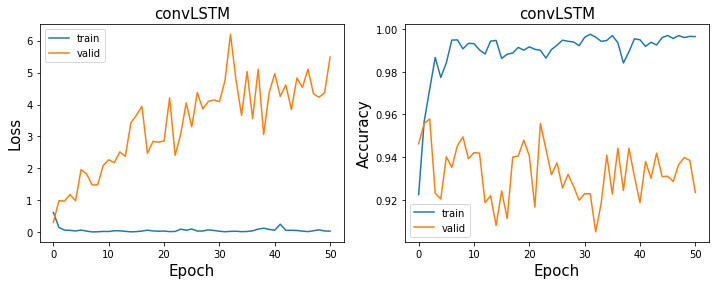

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.40488260984420776
Val loss for epoch 0: 0.5828971862792969
Train loss for epoch 1: 0.14136220514774323
Val loss for epoch 1: 1.053895354270935
Train loss for epoch 2: 0.12771174311637878
Val loss for epoch 2: 0.7283956408500671
Train loss for epoch 3: 0.09989142417907715
Val loss for epoch 3: 1.5707013607025146
Train loss for epoch 4: 0.08867402374744415
Val loss for epoch 4: 1.685520887374878
Train loss for epoch 5: 0.06826803833246231
Val loss for epoch 5: 1.7565706968307495
Train loss for epoch 6: 0.09484878927469254
Val loss for epoch 6: 2.127234697341919
Train loss for epoch 7: 0.11065167188644409
Val loss for epoch 7: 1.7986952066421509
Train loss for epoc

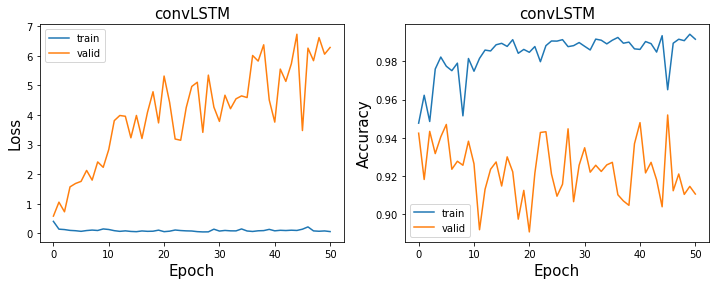

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.4179171323776245
Val loss for epoch 0: 0.8482866883277893
Train loss for epoch 1: 0.21563443541526794
Val loss for epoch 1: 1.857292652130127
Train loss for epoch 2: 0.21412621438503265
Val loss for epoch 2: 1.4421781301498413
Train loss for epoch 3: 0.1626906543970108
Val loss for epoch 3: 2.145404577255249
Train loss for epoch 4: 0.1380881518125534
Val loss for epoch 4: 2.608309268951416
Train loss for epoch 5: 0.14575953781604767
Val loss for epoch 5: 2.8083364963531494
Train loss for epoch 6: 0.14805597066879272
Val loss for epoch 6: 2.9881515502929688
Train loss for epoch 7: 0.12448985874652863
Val loss for epoch 7: 4.356109142303467
Train loss for epoch 8:

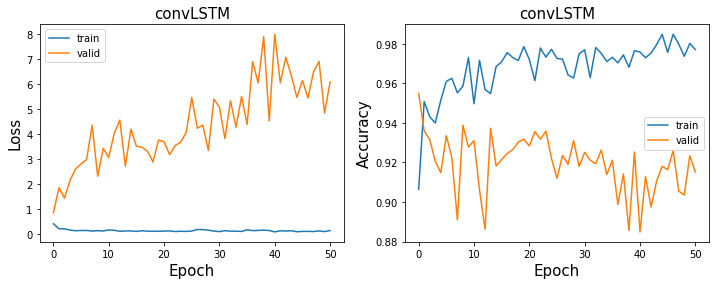

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 2.3269460201263428
Val loss for epoch 0: 0.40346670150756836
Train loss for epoch 1: 0.17283175885677338
Val loss for epoch 1: 0.8819708228111267
Train loss for epoch 2: 0.06815245747566223
Val loss for epoch 2: 1.4148836135864258
Train loss for epoch 3: 0.07802501320838928
Val loss for epoch 3: 1.2091772556304932
Train loss for epoch 4: 0.041359614580869675
Val loss for epoch 4: 1.63593327999115
Train loss for epoch 5: 0.05411596596240997
Val loss for epoch 5: 0.9418899416923523
Train loss for epoch 6: 0.05917105823755264
Val loss for epoch 6: 1.3366888761520386
Train loss for epoch 7: 0.030412103980779648
Val loss for epoch 7: 1.3274717330932617
Train loss for e

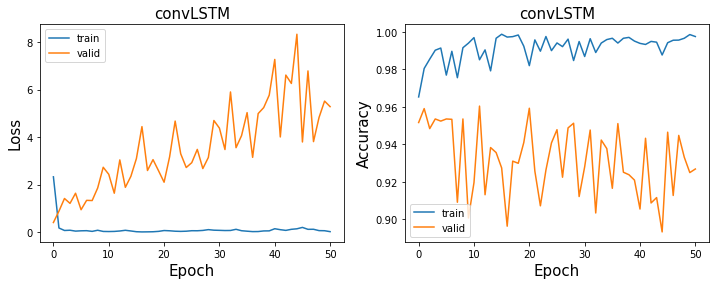

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 1.1239886283874512
Val loss for epoch 0: 0.8999717235565186
Train loss for epoch 1: 0.18979020416736603
Val loss for epoch 1: 1.2353901863098145
Train loss for epoch 2: 0.1529165357351303
Val loss for epoch 2: 1.3790781497955322
Train loss for epoch 3: 0.12415370345115662
Val loss for epoch 3: 2.368441343307495
Train loss for epoch 4: 0.12740972638130188
Val loss for epoch 4: 2.3458240032196045
Train loss for epoch 5: 0.11325745284557343
Val loss for epoch 5: 1.9874603748321533
Train loss for epoch 6: 0.0908748060464859
Val loss for epoch 6: 2.3954837322235107
Train loss for epoch 7: 0.06637635827064514
Val loss for epoch 7: 2.7664709091186523
Train loss for epoch

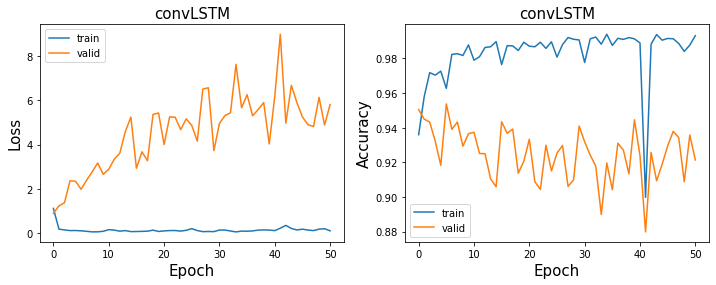

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.6357113122940063
Val loss for epoch 0: 0.905410647392273
Train loss for epoch 1: 0.2695757746696472
Val loss for epoch 1: 1.7431796789169312
Train loss for epoch 2: 0.21365706622600555
Val loss for epoch 2: 2.3491058349609375
Train loss for epoch 3: 0.20415367186069489
Val loss for epoch 3: 2.360124111175537
Train loss for epoch 4: 0.18936575949192047
Val loss for epoch 4: 3.248202323913574
Train loss for epoch 5: 0.18743067979812622
Val loss for epoch 5: 1.398934006690979
Train loss for epoch 6: 0.153952494263649
Val loss for epoch 6: 1.9195606708526611
Train loss for epoch 7: 0.195980966091156
Val loss for epoch 7: 2.818002223968506
Train loss for epoch 8: 0.1

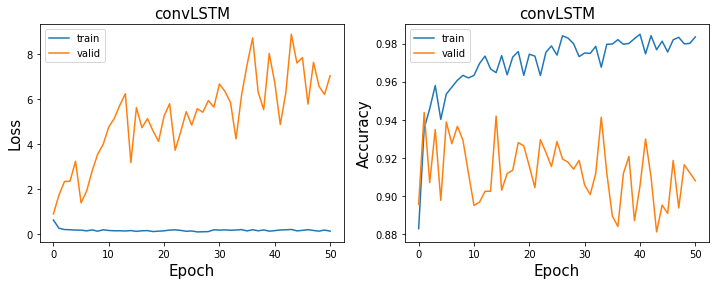

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 43.52908706665039
Val loss for epoch 0: 7.8212409019470215
1
Train loss for epoch 1: 10.431000709533691
Val loss for epoch 1: 5.0762224197387695
2
Train loss for epoch 2: 6.777753829956055
Val loss for epoch 2: 4.786139011383057
Train loss for epoch 3: 5.536024570465088
Val loss for epoch 3: 6.230097770690918
4
Train loss for epoch 4: 5.48602819442749
Val loss for epoch 4: 3.767524003982544
5
Train loss for epoch 5: 4.761693477630615
Val loss for epoch 5: 3.6967616081237793
Train loss for epoch 6: 4.138279914855957
Val loss for epoch 6: 5.694766998291016
Train loss for epoch 7: 3.5443103313446045
Val loss for epoch 7: 6.8221306800842285
Train loss for epoch 8: 3

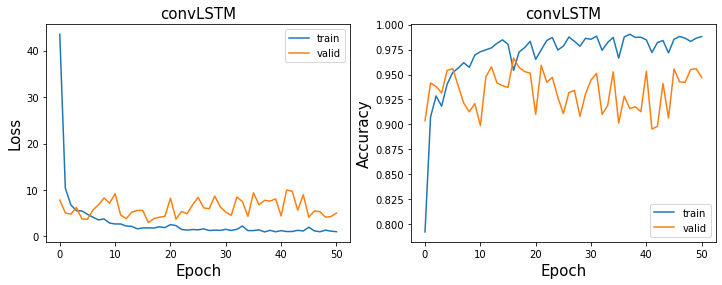

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 6.623347759246826
Val loss for epoch 0: 4.1626057624816895
1
Train loss for epoch 1: 2.822634696960449
Val loss for epoch 1: 2.4765379428863525
Train loss for epoch 2: 1.8564863204956055
Val loss for epoch 2: 7.836284160614014
Train loss for epoch 3: 1.5935347080230713
Val loss for epoch 3: 5.650496482849121
Train loss for epoch 4: 1.4577171802520752
Val loss for epoch 4: 3.4855151176452637
Train loss for epoch 5: 1.4202874898910522
Val loss for epoch 5: 4.651947975158691
Train loss for epoch 6: 1.6378618478775024
Val loss for epoch 6: 10.555255889892578
Train loss for epoch 7: 1.5217646360397339
Val loss for epoch 7: 5.062298774719238
Train loss for epoch 8: 1.

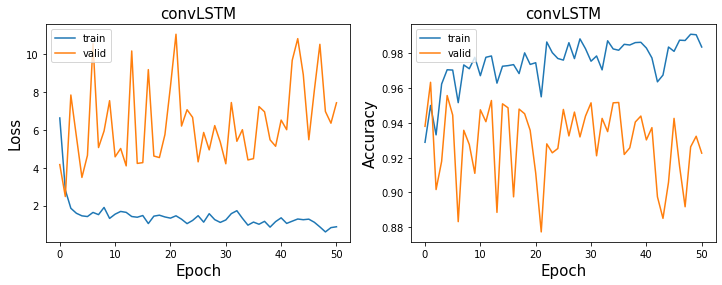

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 7.6912522315979
Val loss for epoch 0: 8.922311782836914
1
Train loss for epoch 1: 2.6469714641571045
Val loss for epoch 1: 5.5411272048950195
2
Train loss for epoch 2: 1.8677103519439697
Val loss for epoch 2: 4.828085899353027
Train loss for epoch 3: 1.5508251190185547
Val loss for epoch 3: 6.681435585021973
Train loss for epoch 4: 1.4784950017929077
Val loss for epoch 4: 8.173492431640625
Train loss for epoch 5: 1.3548939228057861
Val loss for epoch 5: 5.99570894241333
Train loss for epoch 6: 1.9473987817764282
Val loss for epoch 6: 6.325911998748779
Train loss for epoch 7: 1.5772463083267212
Val loss for epoch 7: 5.2980055809021
Train loss for epoch 8: 2.61935

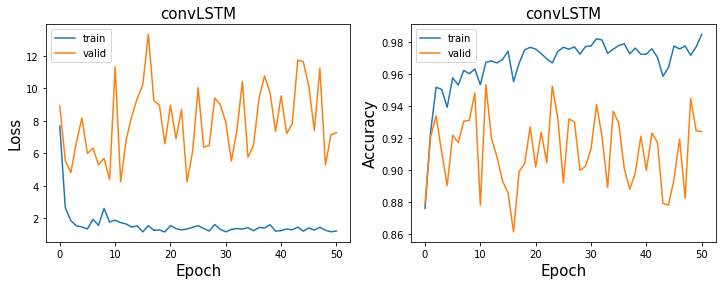

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 49.549686431884766
Val loss for epoch 0: 80.90701293945312
1
Train loss for epoch 1: 49.99857711791992
Val loss for epoch 1: 80.90701293945312
2
Train loss for epoch 2: 50.000709533691406
Val loss for epoch 2: 80.90701293945312
3
Train loss for epoch 3: 50.00284194946289
Val loss for epoch 3: 80.90701293945312
4
Train loss for epoch 4: 49.99573516845703
Val loss for epoch 4: 80.90701293945312
5
Train loss for epoch 5: 50.00284194946289
Val loss for epoch 5: 80.90701293945312
6
Train loss for epoch 6: 50.00497055053711
Val loss for epoch 6: 80.90701293945312
7
Train loss for epoch 7: 50.000709533691406
Val loss for epoch 7: 80.90701293945312
8
Train loss for epoc

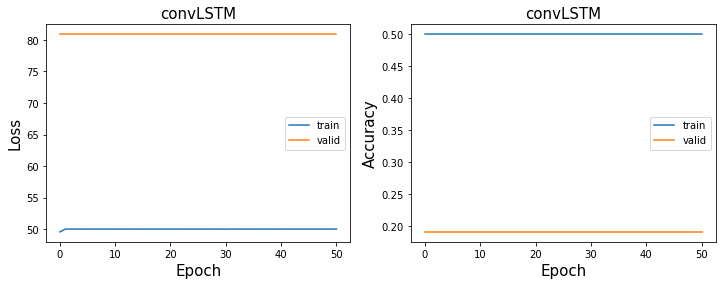

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 19.72340965270996
Val loss for epoch 0: 8.791303634643555
1
Train loss for epoch 1: 8.89928913116455
Val loss for epoch 1: 4.755686283111572
Train loss for epoch 2: 6.935579299926758
Val loss for epoch 2: 5.052857398986816
Train loss for epoch 3: 4.6241278648376465
Val loss for epoch 3: 6.695755958557129
4
Train loss for epoch 4: 3.935396671295166
Val loss for epoch 4: 4.336066246032715
Train loss for epoch 5: 4.479751110076904
Val loss for epoch 5: 7.872649669647217
Train loss for epoch 6: 4.5726318359375
Val loss for epoch 6: 5.971982955932617
Train loss for epoch 7: 3.3951892852783203
Val loss for epoch 7: 8.954041481018066
Train loss for epoch 8: 3.071741819

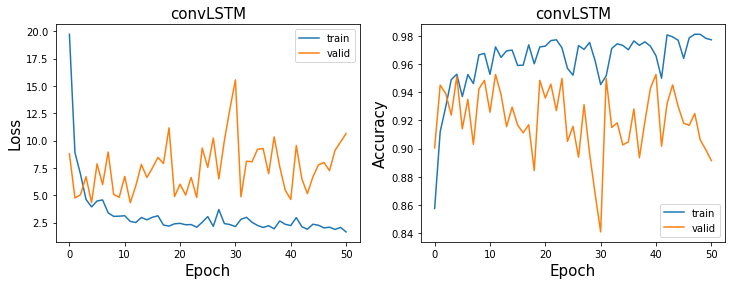

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 8.315835952758789
Val loss for epoch 0: 4.330199241638184
1
Train loss for epoch 1: 3.553738594055176
Val loss for epoch 1: 3.627209424972534
Train loss for epoch 2: 2.540576219558716
Val loss for epoch 2: 11.818397521972656
3
Train loss for epoch 3: 2.8936896324157715
Val loss for epoch 3: 3.3093535900115967
Train loss for epoch 4: 2.246853828430176
Val loss for epoch 4: 6.975737571716309
Train loss for epoch 5: 1.9217623472213745
Val loss for epoch 5: 10.252140045166016
Train loss for epoch 6: 2.3375184535980225
Val loss for epoch 6: 11.110445022583008
Train loss for epoch 7: 2.9159414768218994
Val loss for epoch 7: 4.66333532333374
Train loss for epoch 8: 2.2

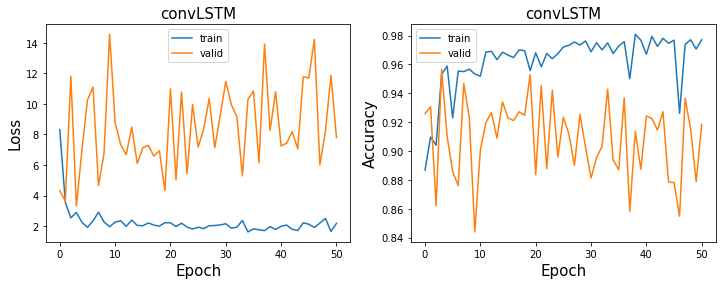

In [67]:
for i in hidden_dim:
    for d in dropout:
        model = convLSTM(input_dim = 62, hidden_dim = i, dropout = d).to(device)
        print(model)
        optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
        criterion = nn.BCELoss() # BCE loss
        train_losses, train_accs, val_losses, val_accs, parameter_history = [], [], [], [],[]

        for epoch in range(num_epochs):
            train_loss, train_acc, parameter_history = train(model, optimizer, criterion, train_loader,  device='cuda')
            val_loss, val_acc = evaluate(model, optimizer, criterion, val_loader, device='cuda')
            train_losses.append(train_loss)
            train_accs.append(train_acc)
            val_losses.append(val_loss)
            val_accs.append(val_acc)
            if epoch == 0:
                torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch))

            if val_loss <= min(val_losses):
                best_epoch = epoch
                print(epoch)
                print('Train loss for epoch {}: {}'.format(epoch, train_loss))
                print('Val loss for epoch {}: {}'.format(epoch, val_loss))
                torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch))
            else:
                print('Train loss for epoch {}: {}'.format(epoch, train_loss))
                print('Val loss for epoch {}: {}'.format(epoch, val_loss))

        #     if epoch == num_epochs-1:
        #         torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_EPOCH{}.pt'.format(model_saving_path, model_type, CH, loss_type, reg_type, alpha, timewindow, epoch))

        train_result_filename =  '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}_trainresult.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch)
        train_result = {'model_type': model_type, 'train_losses' : train_losses, 'val_losses' : val_losses, 'train_accs': train_accs, 'val_accs': val_accs}
        pickle.dump( train_result, open( train_result_filename, "wb" ) )
        plot_loss_acc(train_losses, val_losses, train_accs, val_accs, model_type)

In [125]:
results = []
for h in hidden_dim:
    for d in dropout:
        model_convLSTM = os.listdir(model_saving_path)

        best_result = 0
        reg_alpha = 'REG'+reg_type+str(alpha)+'_'
        dropout_type = 'DO'+str(d)
        hidden_type = 'HD'+str(h)
        t_len = 'TLEN'+str(T_length)
        for i, s in enumerate(model_convLSTM):
            if 'convLSTM_CHall_' in s and reg_alpha in s and dropout_type in s and hidden_type in s and t_len in s and 'trainresult' not in s and 'valcm' not in s and 'testcm' not in s and 'balanced' not in s:
                model_name = model_convLSTM[i].split('_')
                epoch_name = [ind for ind,item in enumerate(np.array(model_name)) if "EPOCH" in item]
                res = [int(i) for i in model_name[epoch_name[0]] if i.isdigit()]
                if len(res) > 1:
                    epoch_result = res[0]*10+res[1]
                else:
                    epoch_result = res[0]
                if epoch_result>best_result and epoch_result != 50:
                    best_result = epoch_result
                #print(model_name)

        results.append([h,d,best_result])

results = pd.DataFrame(np.array(results), columns=['hidden','dropout', 'epoch'])
best_results = results.groupby(['hidden','dropout']).max('epoch')
# print(best_results)


In [126]:
def plot_train_result_file(model_saving_path, model_type, num_channel, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden, best_epoch):
    fb = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH50_trainresult.pt'.format(model_saving_path, model_type, num_channel, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden)
    file = open(fb,'rb')
    train_result = pickle.load(file)
    train_losses = train_result['train_losses']
    val_losses = train_result['val_losses']
    train_accs = train_result['train_accs']
    val_accs = train_result['val_accs']
    model_type = train_result['model_type']
    print('best epoch training accuracy: ', train_accs[best_epoch])
    plot_loss_acc(train_losses, val_losses, train_accs, val_accs, model_type)
    

/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD10_EPOCH0.pt
best epoch training accuracy:  0.9224487431947179


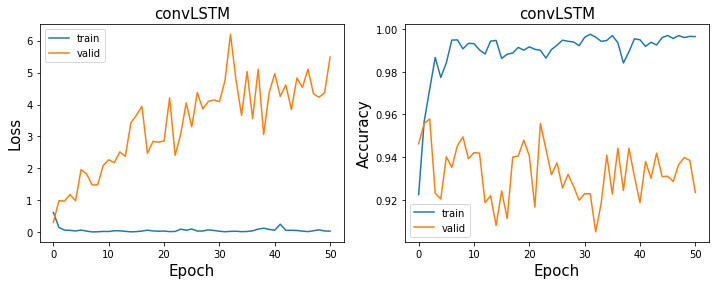

<ipython-input-88-894d578093d0>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  outputs = torch.tensor(outputs).to(device)


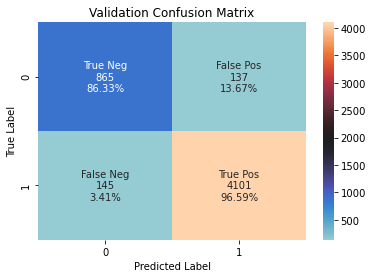

validation loss:0.3146898150444031 accuracy:0.946265243902439 F1:0.9667609618104668


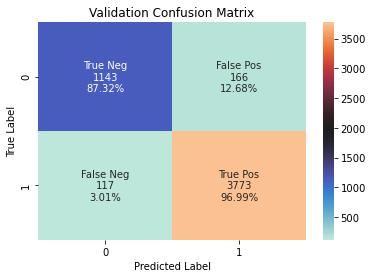

test loss:0.20468302071094513 accuracy:0.9455664550875168 F1:0.9638523438497892
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD10_EPOCH0.pt
best epoch training accuracy:  0.9477006834240704


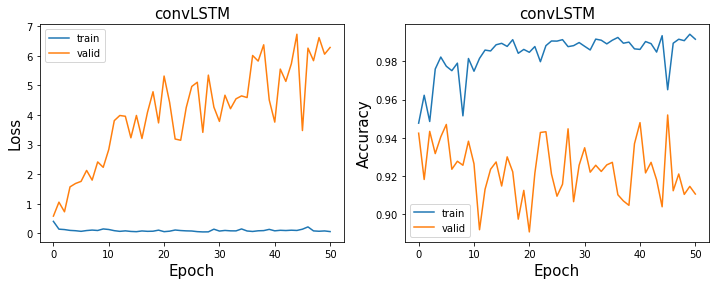

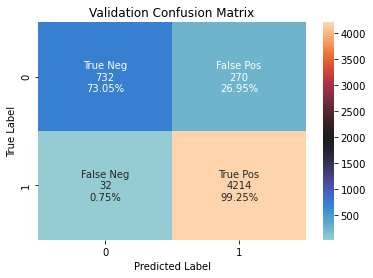

validation loss:0.5828971862792969 accuracy:0.942454268292683 F1:0.9654066437571592


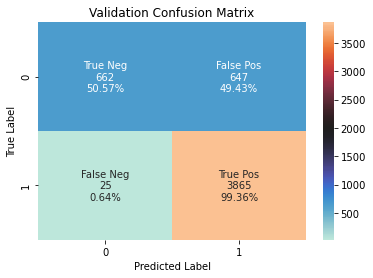

test loss:0.5407972931861877 accuracy:0.8707443739180611 F1:0.9200190430849797
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD10_EPOCH0.pt
best epoch training accuracy:  0.9064056527279045


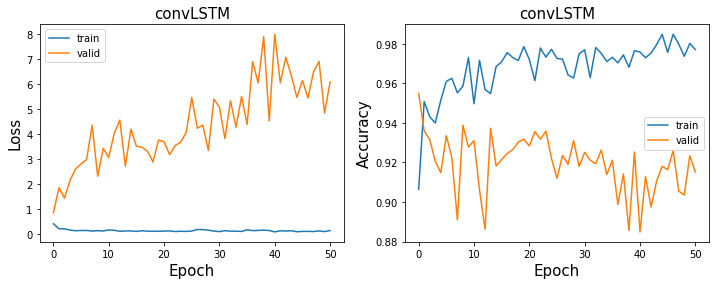

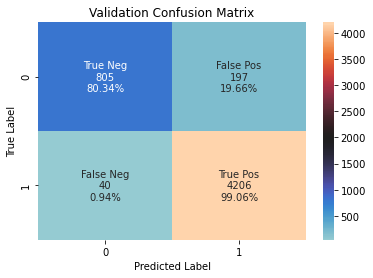

validation loss:0.8482868671417236 accuracy:0.9548399390243902 F1:0.972597988206729


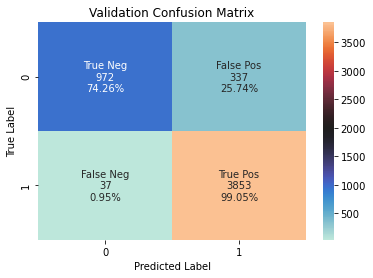

test loss:0.4869674742221832 accuracy:0.9280630890555877 F1:0.9537128712871287
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD15_EPOCH0.pt
best epoch training accuracy:  0.9652496235375884


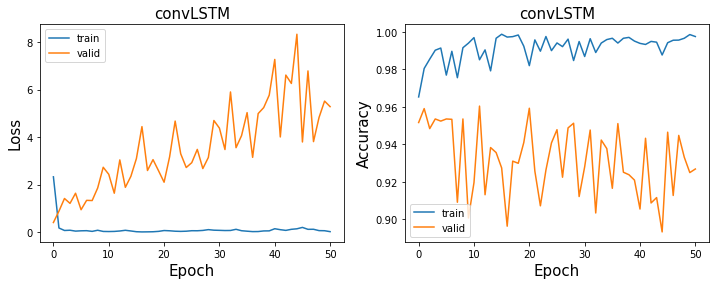

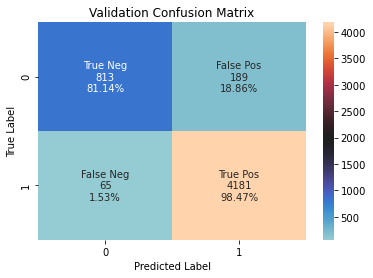

validation loss:0.40346673130989075 accuracy:0.9516006097560976 F1:0.9705199628597957


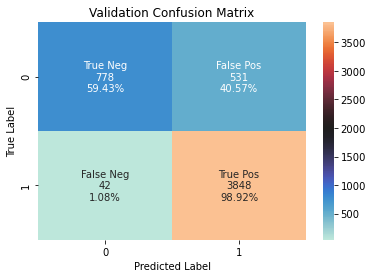

test loss:0.6762575507164001 accuracy:0.8897864974033468 F1:0.9307050429314306
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD15_EPOCH0.pt
best epoch training accuracy:  0.9359434727209545


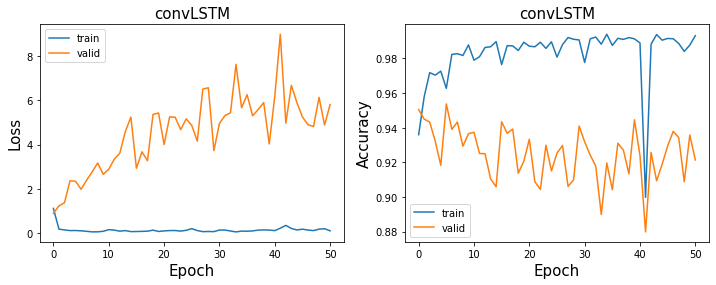

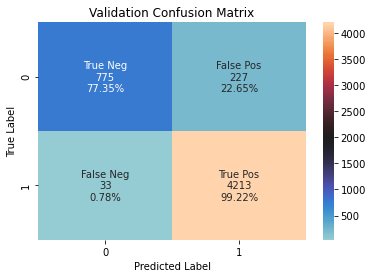

validation loss:0.8999719023704529 accuracy:0.9504573170731707 F1:0.9700667741192724


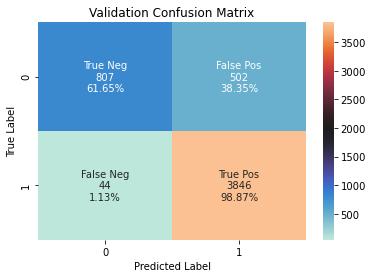

test loss:0.48221078515052795 accuracy:0.8949798038084247 F1:0.9337217771303714
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD15_EPOCH0.pt
best epoch training accuracy:  0.8827753967334646


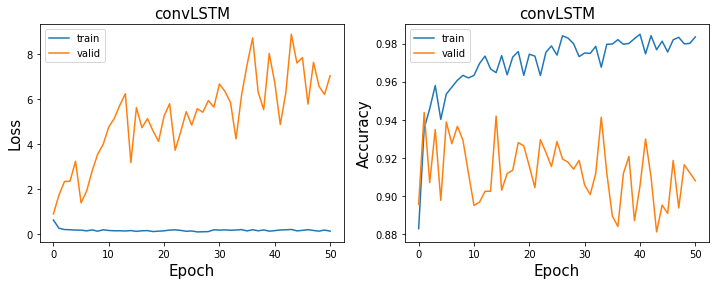

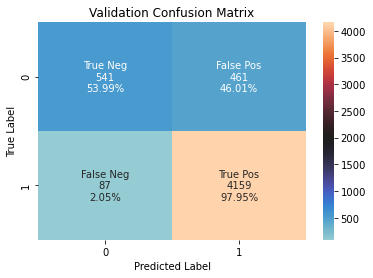

validation loss:0.9054107069969177 accuracy:0.895579268292683 F1:0.9381908414166479


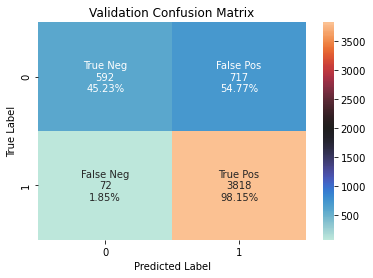

test loss:0.8659650087356567 accuracy:0.8482400461627236 F1:0.9063501483679525
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD48_EPOCH16.pt
best epoch training accuracy:  0.9541295030696166


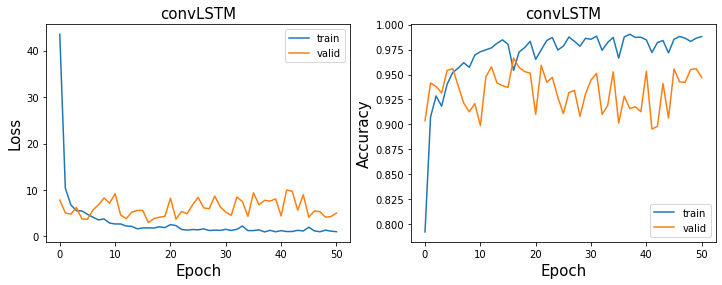

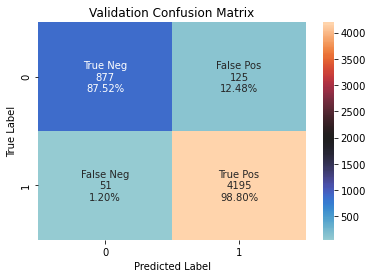

validation loss:2.9608705043792725 accuracy:0.9664634146341463 F1:0.9794536539808545


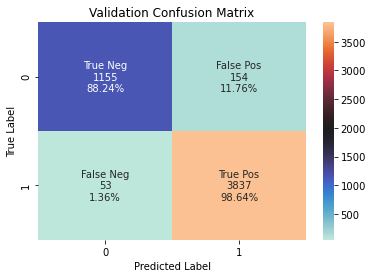

test loss:3.298593282699585 accuracy:0.9601846508944027 F1:0.9737342976779596
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD48_EPOCH1.pt
best epoch training accuracy:  0.9500752924823352


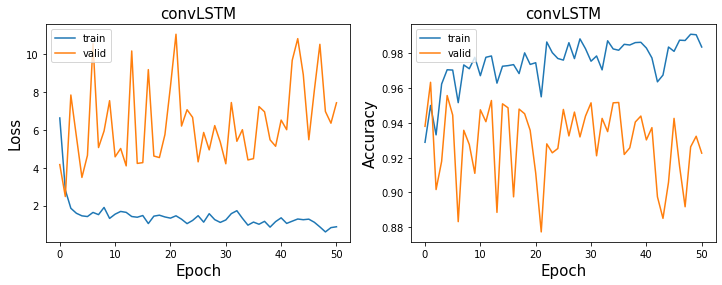

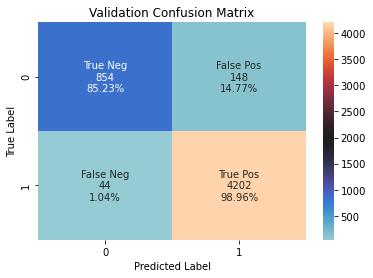

validation loss:2.4765377044677734 accuracy:0.9634146341463414 F1:0.9776640297812936


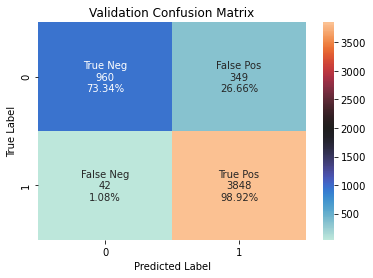

test loss:4.791281223297119 accuracy:0.9247932294672052 F1:0.9516507975763571
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD48_EPOCH23.pt
best epoch training accuracy:  0.9669292250666048


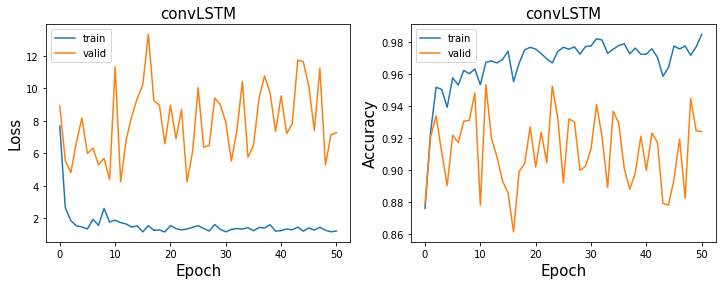

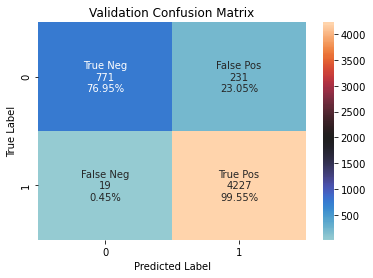

validation loss:4.2543487548828125 accuracy:0.9523628048780488 F1:0.9712775735294118


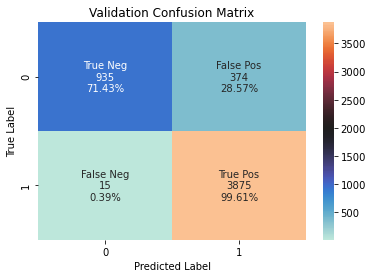

test loss:6.701451301574707 accuracy:0.9251779188305443 F1:0.9522054306425851
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD56_EPOCH49.pt
best epoch training accuracy:  0.5


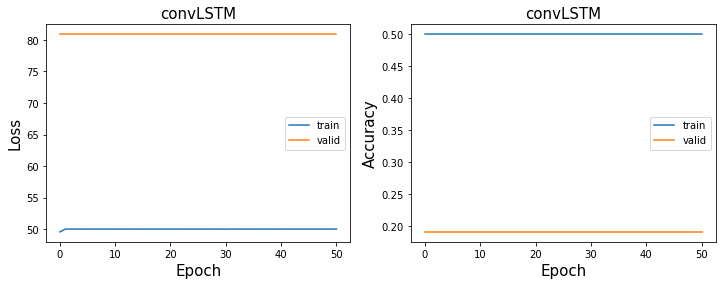

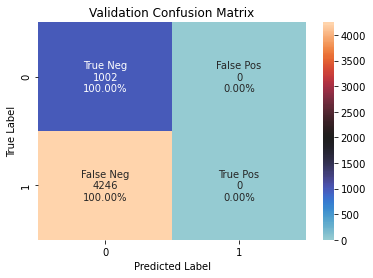

validation loss:80.90701293945312 accuracy:0.19092987804878048 F1:0.0


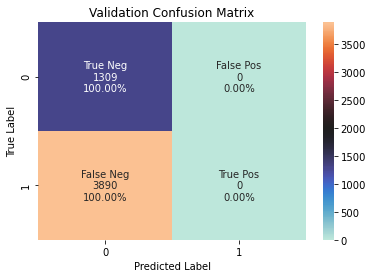

test loss:74.83260345458984 accuracy:0.2517791883054434 F1:0.0
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD56_EPOCH11.pt
best epoch training accuracy:  0.9723734507123827


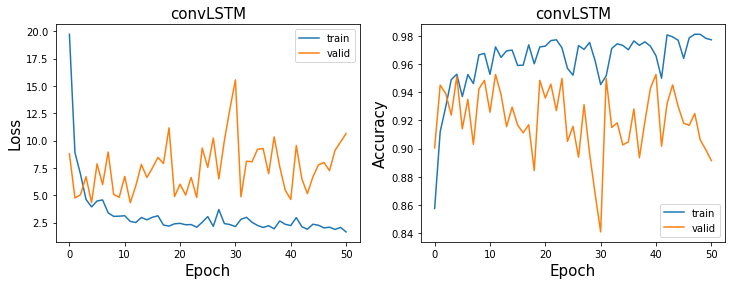

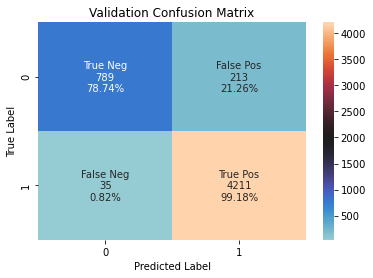

validation loss:4.321882724761963 accuracy:0.9527439024390244 F1:0.9713956170703576


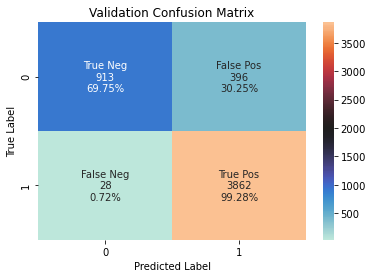

test loss:7.631734371185303 accuracy:0.9184458549721101 F1:0.9479626902307314
/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD56_EPOCH3.pt
best epoch training accuracy:  0.9530869917757442


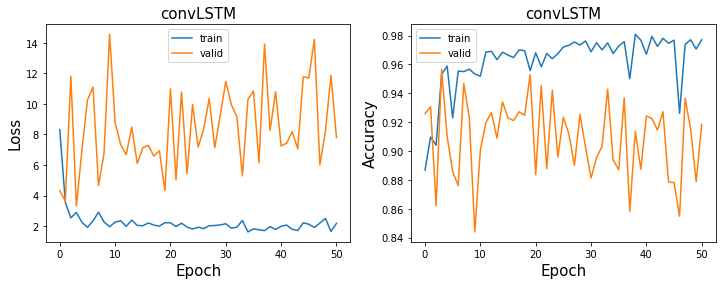

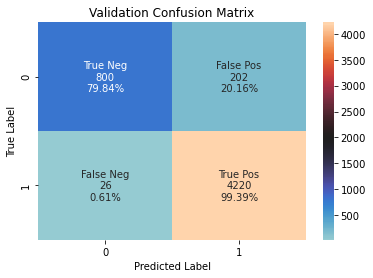

validation loss:3.309354305267334 accuracy:0.9565548780487805 F1:0.9736963544070143


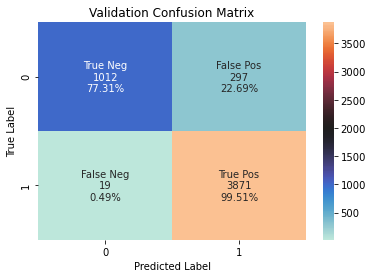

test loss:4.501376628875732 accuracy:0.9392190805924217 F1:0.9607843137254902


In [127]:
for i,(index,row) in enumerate(best_results.iterrows()):

    best_epoch = int(row)
    hidden = int(index[0])
    dropout = index[1]
    alpha = 0
    
    
    # load best model
    model = convLSTM(input_dim = 62, hidden_dim = hidden).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
    model.load_state_dict(torch.load('{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden,best_epoch)))
    
    print('{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, dropout, hidden,best_epoch))

    ## Plot training result
    plot_train_result_file(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden, best_epoch)

    ## Calculate validation accuracy and validation loss
    val_loss, val_acc, val_preds, val_F1, val_labels = evaluate(model, optimizer, criterion, val_loader, device='cuda', collect_result = True)
    print('validation loss:{} accuracy:{} F1:{}'.format(val_loss, val_acc, val_F1))
    
    ## Calculate test accuracy and test loss
    test_loss, test_acc, test_preds, test_F1, test_labels = evaluate(model, optimizer, criterion, test_loader, device='cuda', collect_result = True)
    print('test loss:{} accuracy:{} F1:{}'.format(test_loss, test_acc, test_F1))

    
    
#     ## Calculate validation accuracy and validation loss
#     val_loss, val_acc, val_preds, val_labels = evaluate(model, optimizer, criterion, val_loader, device='cuda', collect_result = True)
#     print('validation loss:{} accuracy:{}'.format(val_loss, val_acc))
    
#     ## Calculate test accuracy and test loss
#     test_loss, test_acc, test_preds, test_labels = evaluate(model, optimizer, criterion, test_loader, device='cuda', collect_result = True)
#     print('test loss:{} accuracy:{}'.format(test_loss, test_acc))
#     print(np.mean(np.concatenate(test_labels)))
    
#     ## Confusion matrix-validation
#     predictions_val = np.concatenate(val_preds)
#     labels_val = np.concatenate(val_labels)
    
#     val_cm_filename = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_valcm.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout,hidden)
#     print(val_cm_filename)
#     val_cm_result = {'predictions_val': predictions_val, 'labels_val' : labels_val}

#     pickle.dump( val_cm_result, open( val_cm_filename, "wb" ) )
    
    
#     df_val = pd.DataFrame({'predictions': predictions_val, 'labels': labels_val})

#     cm_val = confusion_matrix(labels_val, predictions_val)
#     ax = plt.axes()
#     group_names = ['True Neg','False Pos','False Neg','True Pos']
#     group_counts = ["{0:0.0f}".format(value) for value in
#                     cm_val.flatten()]

#     TNR = int(group_counts[0]) / (int(group_counts[0])+int(group_counts[1]))
#     FPR = 1 - TNR
#     TPR = int(group_counts[3]) / (int(group_counts[3])+int(group_counts[2]))
#     FNR = 1-TPR
#     group_percentages =[TNR, FPR, FNR, TPR]

#     group_percentages = ["{0:.2%}".format(value) for value in
#                          group_percentages]
#     labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
#               zip(group_names,group_counts,group_percentages)]
#     labels = np.asarray(labels).reshape(2,2)
#     sn.heatmap(cm_val, annot=labels, fmt='', center = 2000)
#     ax.set_title('Validation Confusion Matrix')
#     ax.set_xlabel('Predicted Label')
#     ax.set_ylabel('True Label')
#     plt.show()
    
#     ## Confusion matrix-test
#     predictions_test = np.concatenate(test_preds)
#     labels_test = np.concatenate(test_labels)

#     test_cm_filename = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_testcm.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout,hidden)
#     print(test_cm_filename)
#     test_cm_result = {'predictions_test': predictions_test, 'labels_val' : labels_test}

#     pickle.dump( test_cm_result, open( test_cm_filename, "wb" ) )

#     df_test = pd.DataFrame({'predictions': predictions_test, 'labels': labels_test})

#     cm_test = confusion_matrix(labels_test, predictions_test)
#     ax = plt.axes()
#     group_names = ['True Neg','False Pos','False Neg','True Pos']
#     group_counts = ["{0:0.0f}".format(value) for value in
#                     cm_test.flatten()]

#     TNR = int(group_counts[0]) / (int(group_counts[0])+int(group_counts[1]))
#     FPR = 1 - TNR
#     TPR = int(group_counts[3]) / (int(group_counts[3])+int(group_counts[2]))
#     FNR = 1-TPR
#     group_percentages =[TNR, FPR, FNR, TPR]

#     group_percentages = ["{0:.2%}".format(value) for value in
#                          group_percentages]
#     labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
#               zip(group_names,group_counts,group_percentages)]
#     labels = np.asarray(labels).reshape(2,2)
#     sn.heatmap(cm_test, annot=labels, fmt='', center = 2000)
#     ax.set_title('Test Confusion Matrix')
#     ax.set_xlabel('Predicted Label')
#     ax.set_ylabel('True Label')
#     plt.show()
    
